In [16]:
import torch
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets

In [2]:
from utils import Logger

In [3]:
def mnist_data():
    compose = transforms.Compose(
        [transforms.ToTensor(),
         transforms.Normalize((.5, .5, .5), (.5, .5, .5))
        ])
    out_dir = './dataset'
    return datasets.MNIST(root=out_dir, train=True, transform=compose, download=True)
# Load data
data = mnist_data()
# Create loader with data, so that we can iterate over it
data_loader = torch.utils.data.DataLoader(data, batch_size=100, shuffle=True)
# Num batches
num_batches = len(data_loader)

In [4]:
num_batches

600

In [5]:
class DiscriminatorNet(torch.nn.Module):
    """
    A three hidden-layer discriminative neural network
    """
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 784
        n_out = 1
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.out = nn.Sequential(
            torch.nn.Linear(256, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
discriminator = DiscriminatorNet()

In [6]:
def images_to_vectors(images):
    return images.view(images.size(0), 784)

def vectors_to_images(vectors):
    return vectors.view(vectors.size(0), 1, 28, 28)

In [7]:
class GeneratorNet(torch.nn.Module):
    """
    A three hidden-layer generative neural network
    """
    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_features = 100
        n_out = 784
        
        self.hidden0 = nn.Sequential(
            nn.Linear(n_features, 256),
            nn.LeakyReLU(0.2)
        )
        self.hidden1 = nn.Sequential(            
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2)
        )
        
        self.out = nn.Sequential(
            nn.Linear(1024, n_out),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
generator = GeneratorNet()

In [8]:
def noise(size):
    '''
    Generates a 1-d vector of gaussian sampled random values
    '''
    n = Variable(torch.randn(size, 100))
    return n

In [11]:
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)

In [9]:
discriminator.parameters()

<generator object Module.parameters at 0x7f6da9718bf8>

In [10]:
loss = nn.BCELoss()

In [11]:
def ones_target(size):
    '''
    Tensor containing ones, with shape = size
    '''
    data = Variable(torch.ones(size, 1))
    return data

def zeros_target(size):
    '''
    Tensor containing zeros, with shape = size
    '''
    data = Variable(torch.zeros(size, 1))
    return data

In [12]:
def train_discriminator(optimizer, real_data, fake_data):
    N = real_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, ones_target(N) )
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, zeros_target(N))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error and predictions for real and fake inputs
    return error_real + error_fake, prediction_real, prediction_fake

In [13]:
def train_generator(optimizer, fake_data):
    N = fake_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    # Calculate error and backpropagate
    error = loss(prediction, ones_target(N))
    error.backward()
    # Update weights with gradients
    optimizer.step()
    # Return error
    return error

In [14]:
num_test_samples = 16
test_noise = noise(num_test_samples)

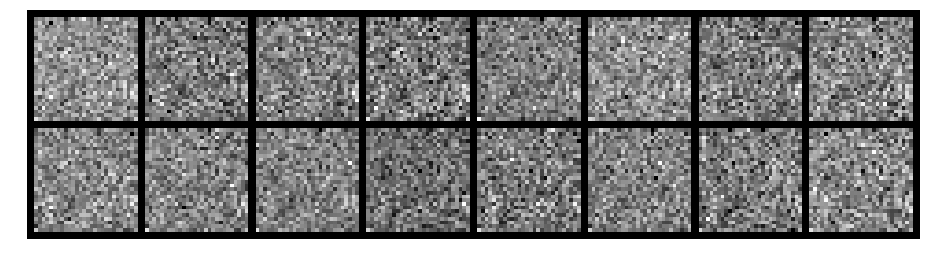

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.3958, Generator Loss: 0.6682
D(x): 0.5074, D(G(z)): 0.5117


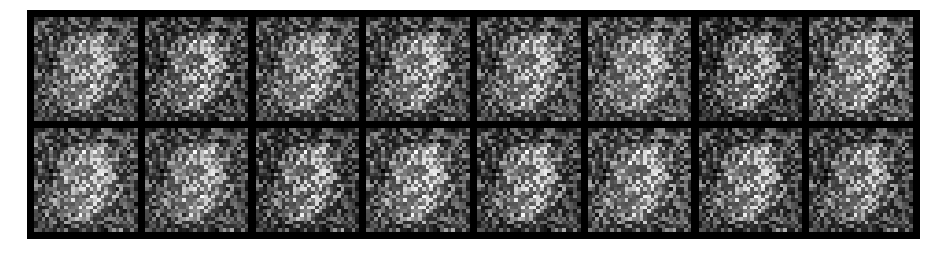

Epoch: [0/200], Batch Num: [100/600]
Discriminator Loss: 0.2663, Generator Loss: 2.3762
D(x): 0.9087, D(G(z)): 0.1395


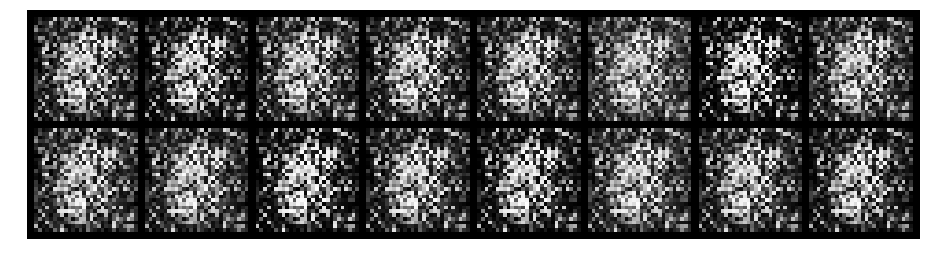

Epoch: [0/200], Batch Num: [200/600]
Discriminator Loss: 0.1931, Generator Loss: 3.5956
D(x): 0.9620, D(G(z)): 0.1377


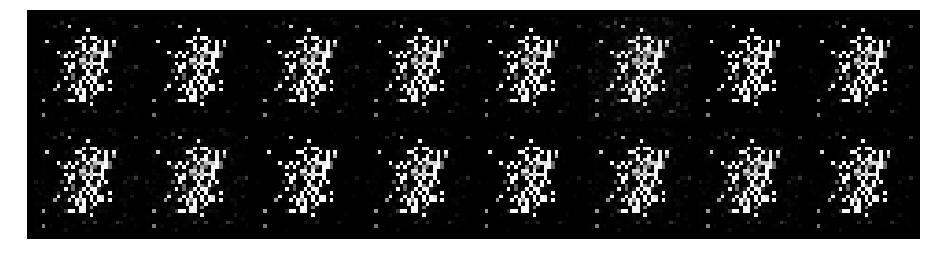

Epoch: [0/200], Batch Num: [300/600]
Discriminator Loss: 0.0501, Generator Loss: 5.4383
D(x): 0.9722, D(G(z)): 0.0197


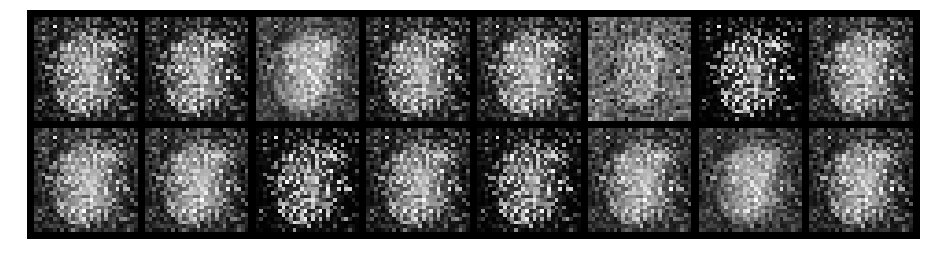

Epoch: [0/200], Batch Num: [400/600]
Discriminator Loss: 0.4530, Generator Loss: 4.0186
D(x): 0.9762, D(G(z)): 0.2927


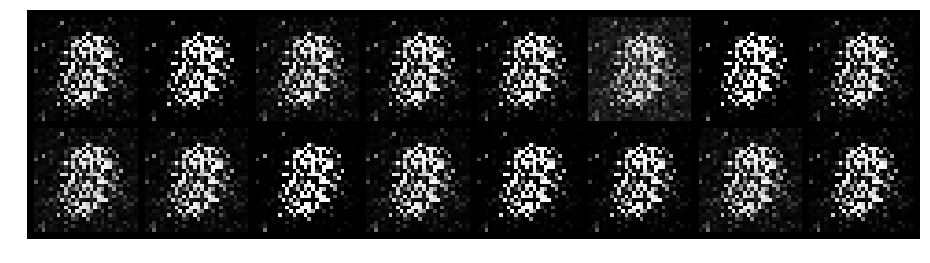

Epoch: [0/200], Batch Num: [500/600]
Discriminator Loss: 0.2868, Generator Loss: 3.6424
D(x): 0.8578, D(G(z)): 0.1120


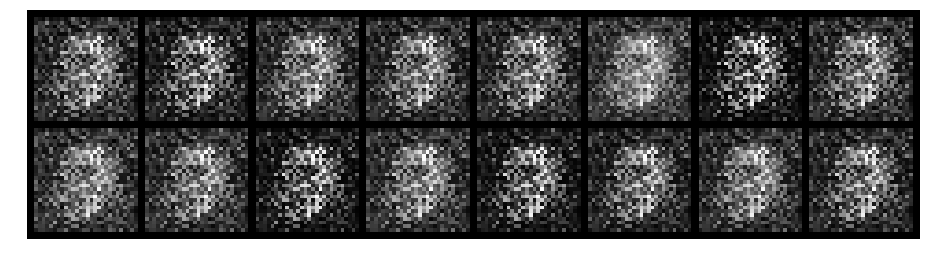

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 3.6456, Generator Loss: 0.0555
D(x): 0.8628, D(G(z)): 0.9582


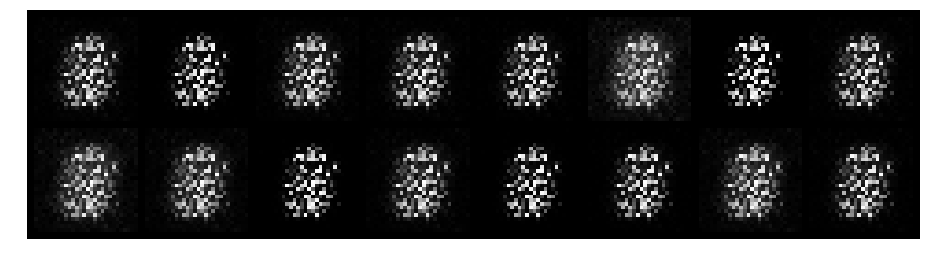

Epoch: [1/200], Batch Num: [100/600]
Discriminator Loss: 0.6595, Generator Loss: 2.1328
D(x): 0.7705, D(G(z)): 0.2828


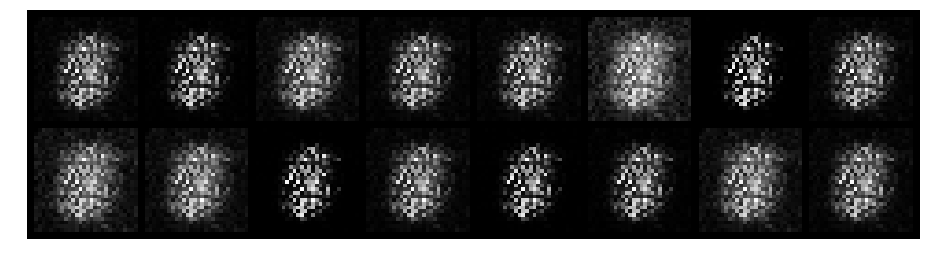

Epoch: [1/200], Batch Num: [200/600]
Discriminator Loss: 1.5098, Generator Loss: 2.4639
D(x): 0.5509, D(G(z)): 0.4659


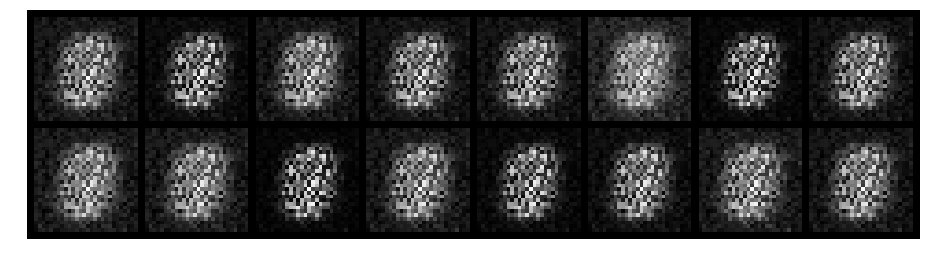

Epoch: [1/200], Batch Num: [300/600]
Discriminator Loss: 1.8390, Generator Loss: 1.2929
D(x): 0.6582, D(G(z)): 0.6397


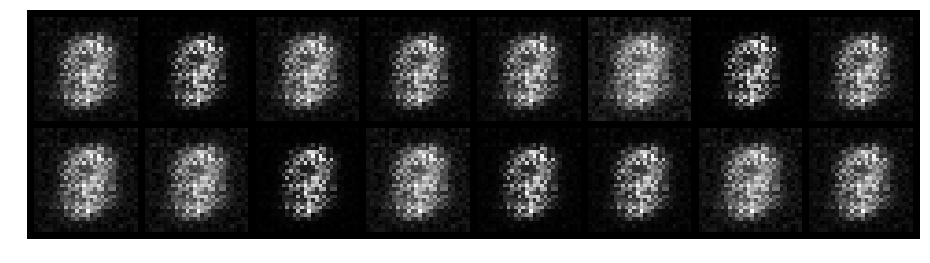

Epoch: [1/200], Batch Num: [400/600]
Discriminator Loss: 1.4935, Generator Loss: 0.8092
D(x): 0.6170, D(G(z)): 0.5697


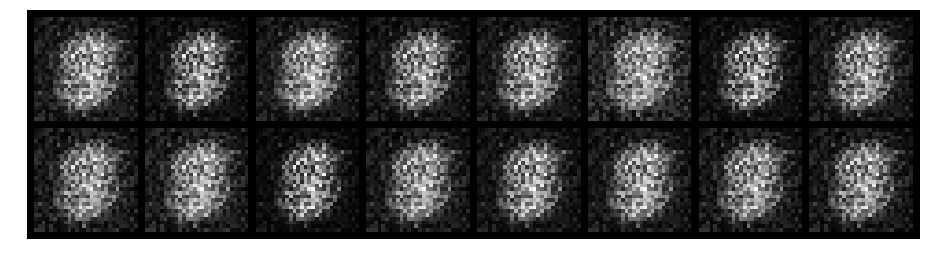

Epoch: [1/200], Batch Num: [500/600]
Discriminator Loss: 0.5001, Generator Loss: 2.5001
D(x): 0.8088, D(G(z)): 0.2019


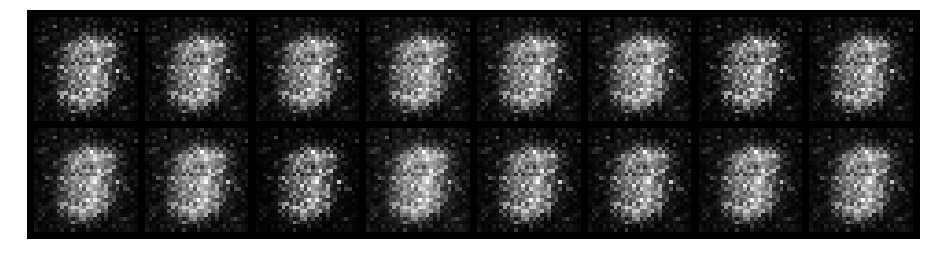

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 1.7648, Generator Loss: 0.4700
D(x): 0.5078, D(G(z)): 0.6439


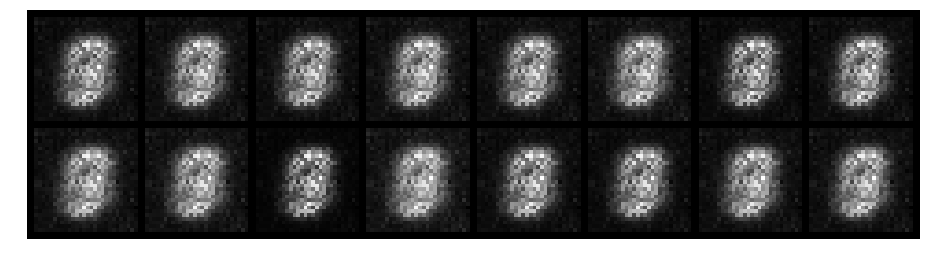

Epoch: [2/200], Batch Num: [100/600]
Discriminator Loss: 1.3520, Generator Loss: 0.9645
D(x): 0.5603, D(G(z)): 0.4944


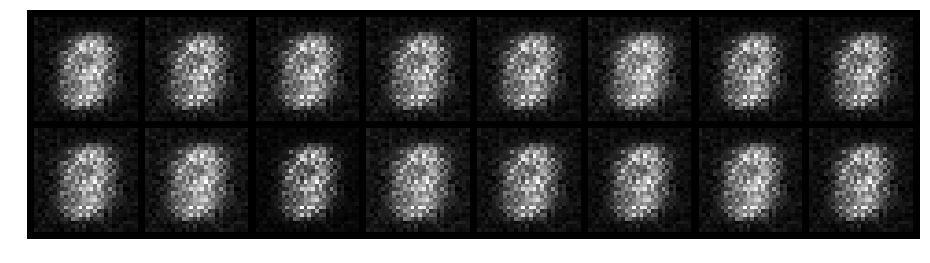

Epoch: [2/200], Batch Num: [200/600]
Discriminator Loss: 0.5194, Generator Loss: 1.9798
D(x): 0.8037, D(G(z)): 0.2279


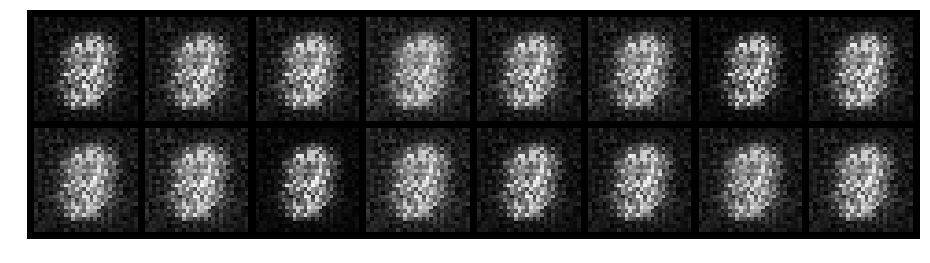

Epoch: [2/200], Batch Num: [300/600]
Discriminator Loss: 1.0046, Generator Loss: 2.3215
D(x): 0.7217, D(G(z)): 0.3480


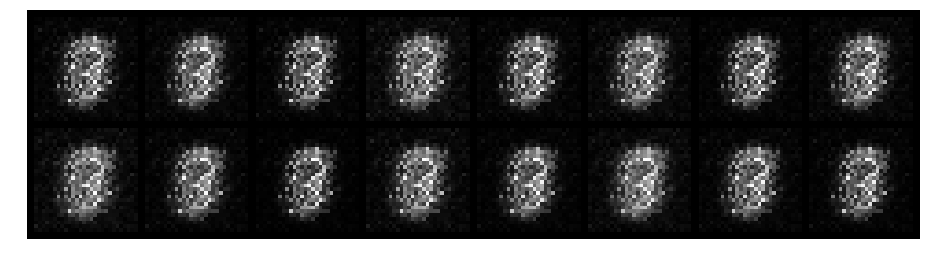

Epoch: [2/200], Batch Num: [400/600]
Discriminator Loss: 2.1716, Generator Loss: 0.8914
D(x): 0.5372, D(G(z)): 0.6387


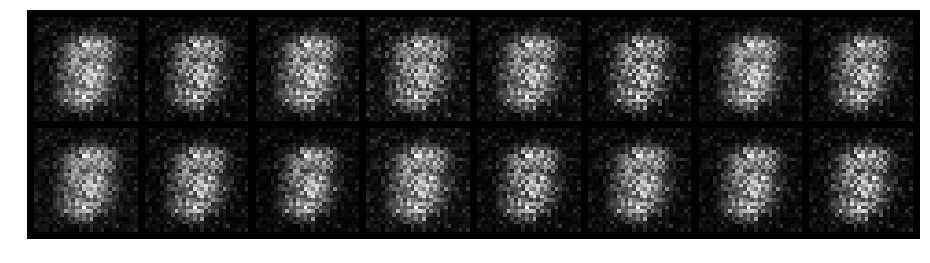

Epoch: [2/200], Batch Num: [500/600]
Discriminator Loss: 0.8486, Generator Loss: 3.1221
D(x): 0.7121, D(G(z)): 0.2564


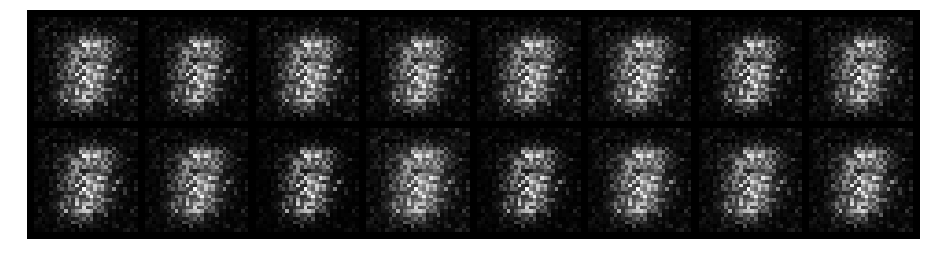

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 0.5720, Generator Loss: 1.8297
D(x): 0.7852, D(G(z)): 0.1965


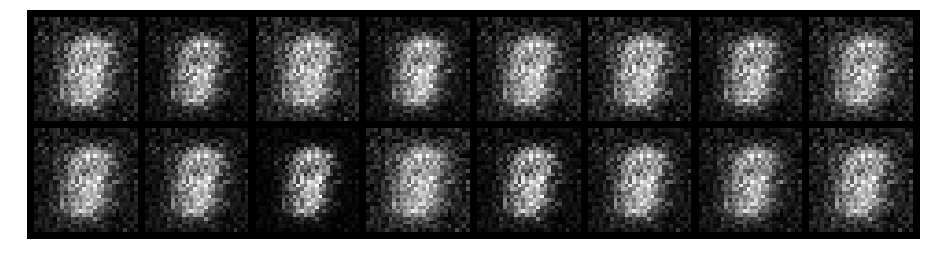

Epoch: [3/200], Batch Num: [100/600]
Discriminator Loss: 0.8755, Generator Loss: 2.2648
D(x): 0.8236, D(G(z)): 0.2276


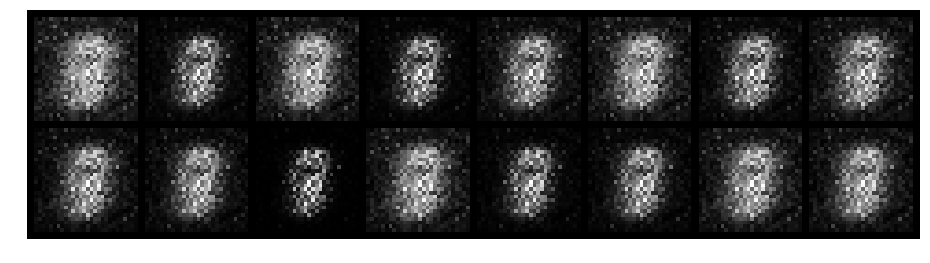

Epoch: [3/200], Batch Num: [200/600]
Discriminator Loss: 0.7824, Generator Loss: 2.6764
D(x): 0.8494, D(G(z)): 0.1981


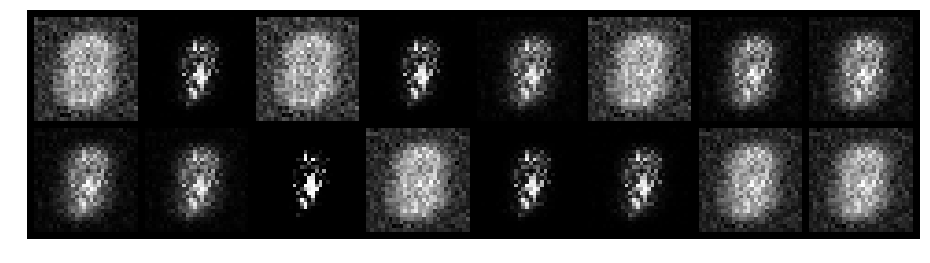

Epoch: [3/200], Batch Num: [300/600]
Discriminator Loss: 0.4809, Generator Loss: 2.7418
D(x): 0.8772, D(G(z)): 0.1875


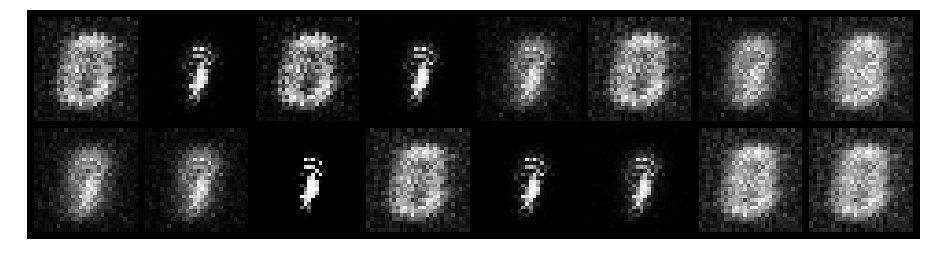

Epoch: [3/200], Batch Num: [400/600]
Discriminator Loss: 0.6116, Generator Loss: 2.1030
D(x): 0.8269, D(G(z)): 0.2316


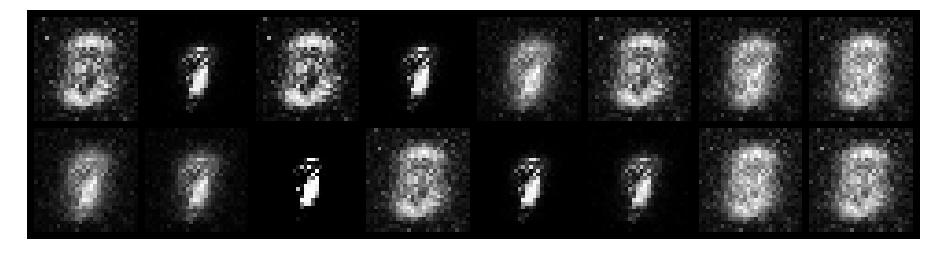

Epoch: [3/200], Batch Num: [500/600]
Discriminator Loss: 0.4773, Generator Loss: 3.0873
D(x): 0.8655, D(G(z)): 0.1557


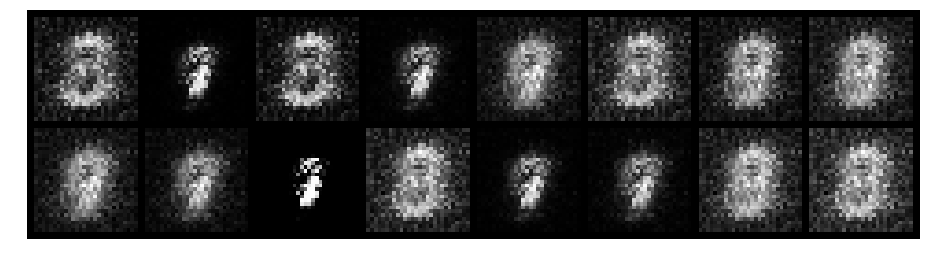

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 0.4430, Generator Loss: 3.2261
D(x): 0.8440, D(G(z)): 0.0975


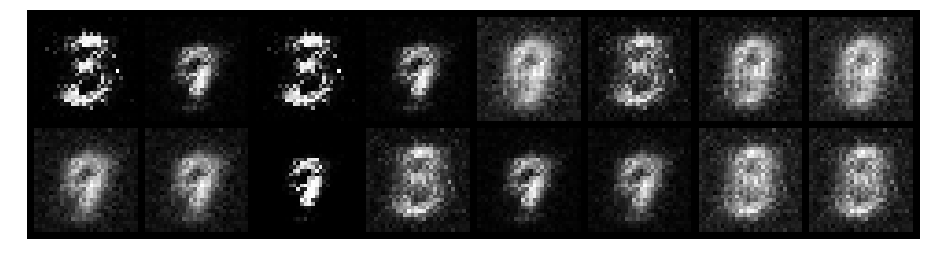

Epoch: [4/200], Batch Num: [100/600]
Discriminator Loss: 0.5056, Generator Loss: 3.5293
D(x): 0.8389, D(G(z)): 0.1204


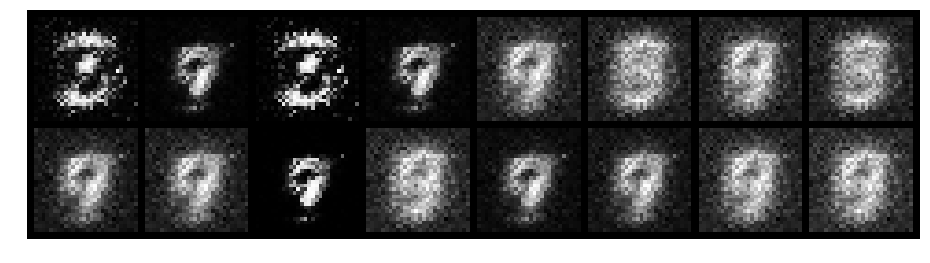

Epoch: [4/200], Batch Num: [200/600]
Discriminator Loss: 0.5502, Generator Loss: 2.1703
D(x): 0.8815, D(G(z)): 0.2143


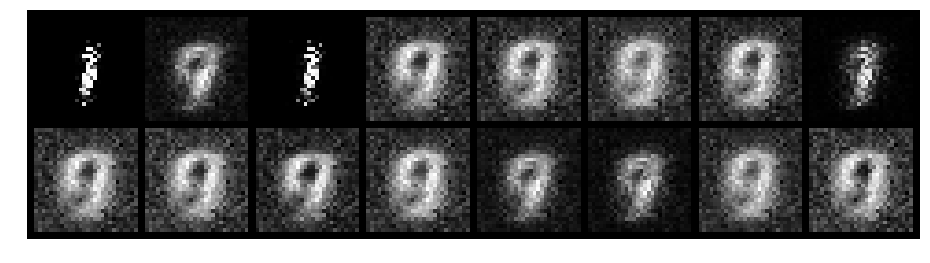

Epoch: [4/200], Batch Num: [300/600]
Discriminator Loss: 0.3563, Generator Loss: 2.3609
D(x): 0.9440, D(G(z)): 0.2025


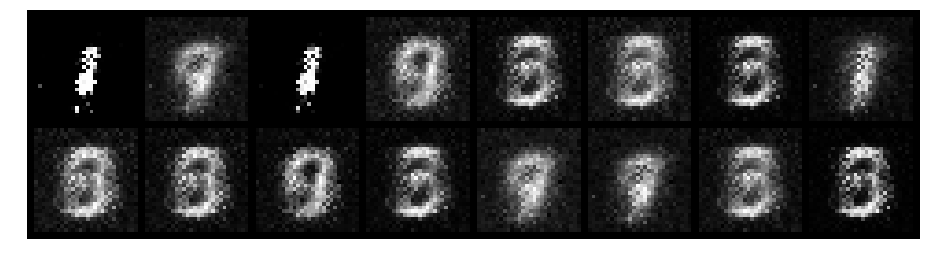

Epoch: [4/200], Batch Num: [400/600]
Discriminator Loss: 0.3658, Generator Loss: 4.2576
D(x): 0.8689, D(G(z)): 0.0740


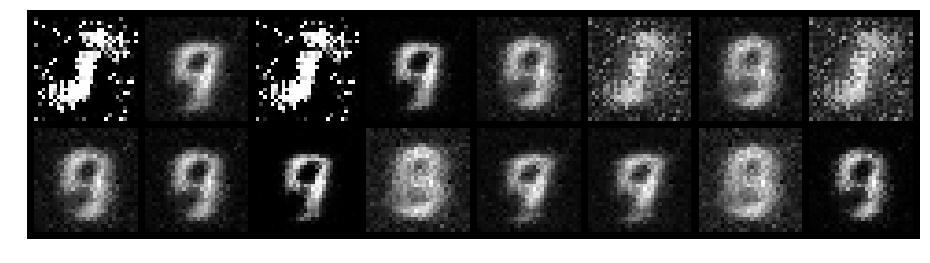

Epoch: [4/200], Batch Num: [500/600]
Discriminator Loss: 0.4648, Generator Loss: 2.9134
D(x): 0.8013, D(G(z)): 0.1183


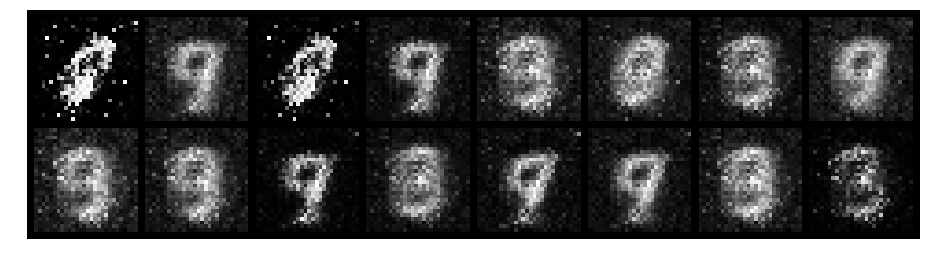

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 0.4012, Generator Loss: 2.6185
D(x): 0.8820, D(G(z)): 0.1470


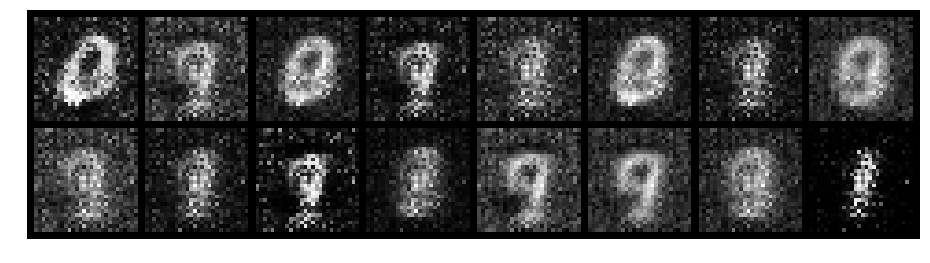

Epoch: [5/200], Batch Num: [100/600]
Discriminator Loss: 0.3113, Generator Loss: 3.9177
D(x): 0.9228, D(G(z)): 0.1501


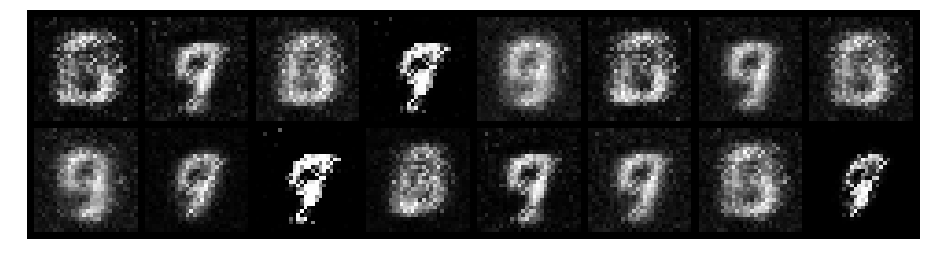

Epoch: [5/200], Batch Num: [200/600]
Discriminator Loss: 0.5123, Generator Loss: 2.7363
D(x): 0.8029, D(G(z)): 0.1269


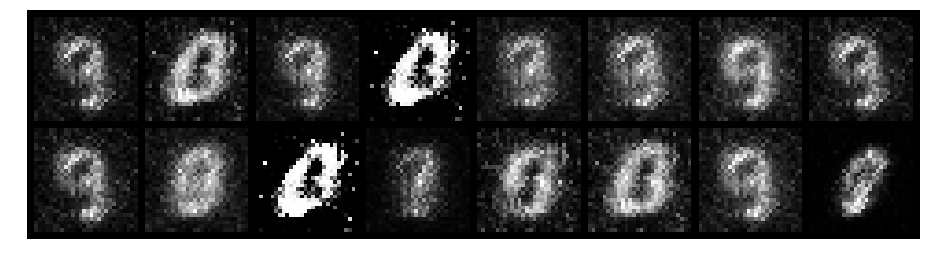

Epoch: [5/200], Batch Num: [300/600]
Discriminator Loss: 0.3455, Generator Loss: 2.4846
D(x): 0.9294, D(G(z)): 0.1662


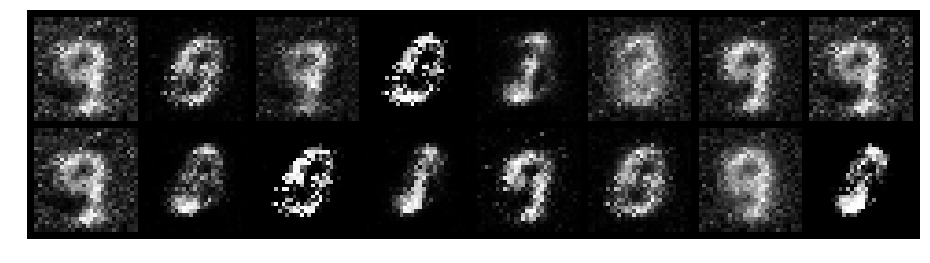

Epoch: [5/200], Batch Num: [400/600]
Discriminator Loss: 0.6452, Generator Loss: 3.1609
D(x): 0.7852, D(G(z)): 0.0987


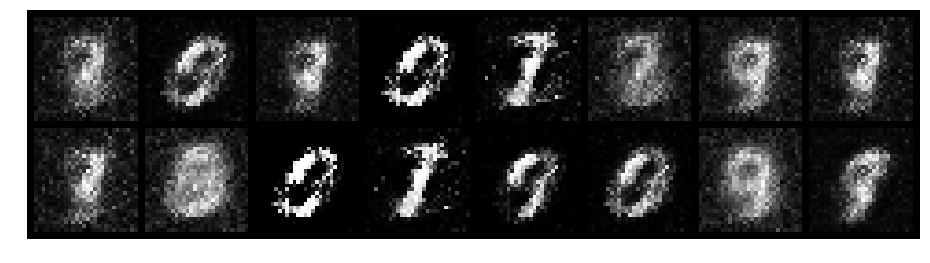

Epoch: [5/200], Batch Num: [500/600]
Discriminator Loss: 0.6015, Generator Loss: 2.6636
D(x): 0.8646, D(G(z)): 0.1900


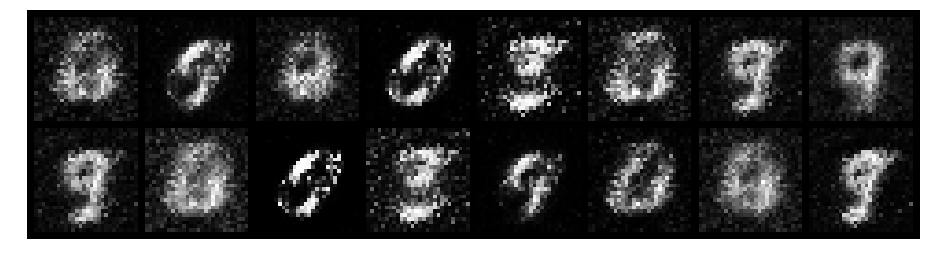

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 0.5394, Generator Loss: 2.7658
D(x): 0.8610, D(G(z)): 0.1956


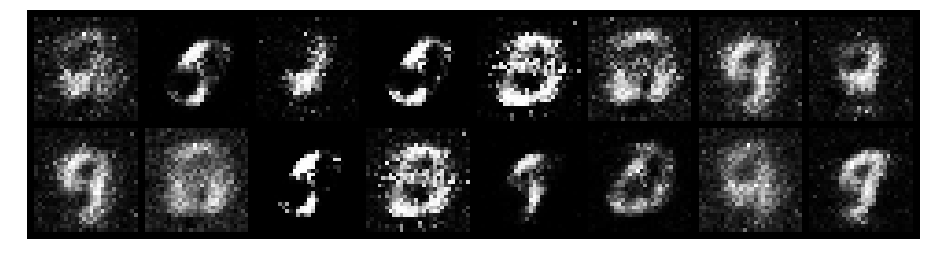

Epoch: [6/200], Batch Num: [100/600]
Discriminator Loss: 0.7417, Generator Loss: 2.7000
D(x): 0.6841, D(G(z)): 0.1457


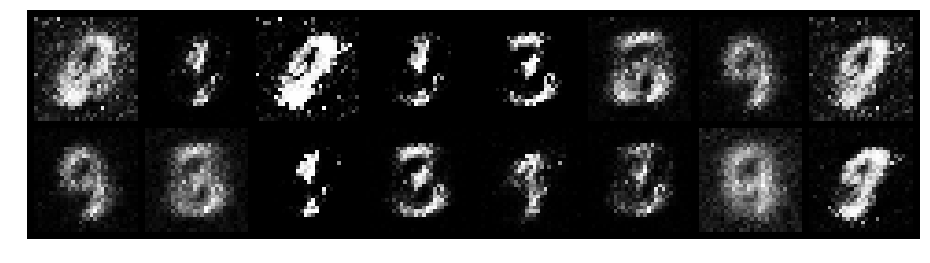

Epoch: [6/200], Batch Num: [200/600]
Discriminator Loss: 0.4153, Generator Loss: 3.0306
D(x): 0.8718, D(G(z)): 0.1372


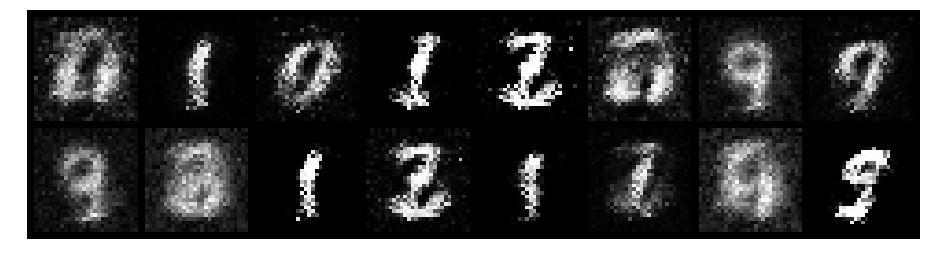

Epoch: [6/200], Batch Num: [300/600]
Discriminator Loss: 0.2676, Generator Loss: 3.7082
D(x): 0.9032, D(G(z)): 0.0910


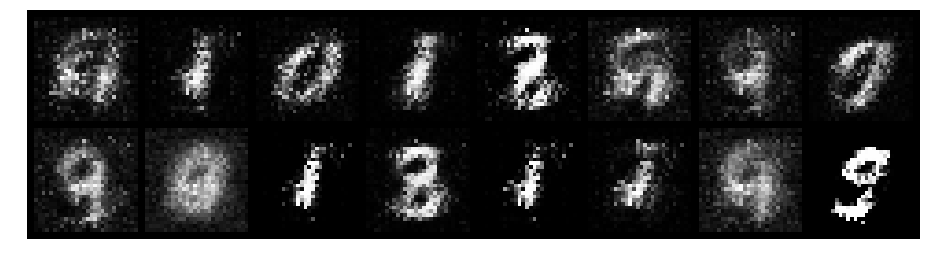

Epoch: [6/200], Batch Num: [400/600]
Discriminator Loss: 0.3404, Generator Loss: 3.3132
D(x): 0.8630, D(G(z)): 0.0612


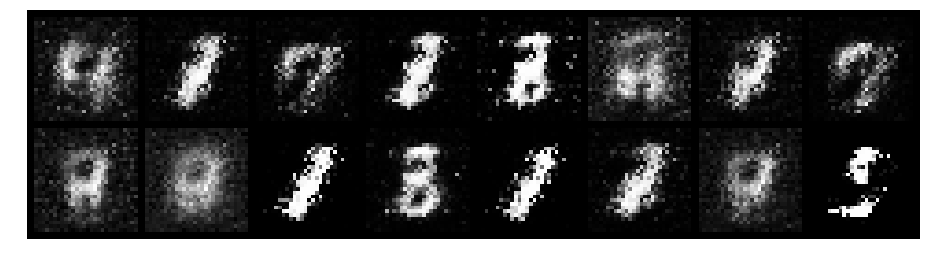

Epoch: [6/200], Batch Num: [500/600]
Discriminator Loss: 0.3417, Generator Loss: 2.8124
D(x): 0.8798, D(G(z)): 0.1064


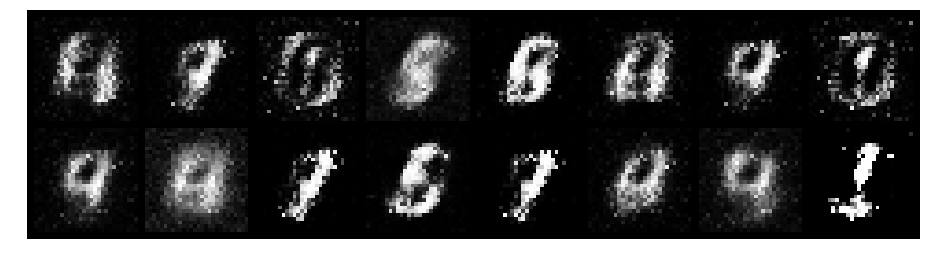

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 0.7983, Generator Loss: 2.9962
D(x): 0.7136, D(G(z)): 0.1874


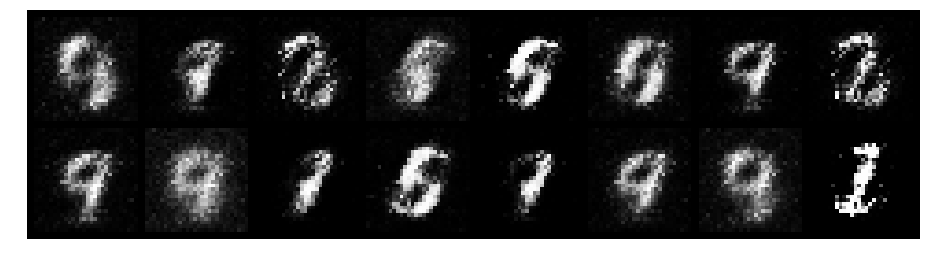

Epoch: [7/200], Batch Num: [100/600]
Discriminator Loss: 0.5828, Generator Loss: 1.8971
D(x): 0.8739, D(G(z)): 0.2151


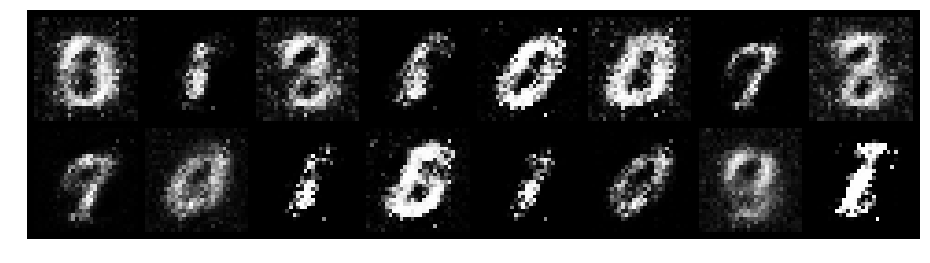

Epoch: [7/200], Batch Num: [200/600]
Discriminator Loss: 0.6676, Generator Loss: 2.9887
D(x): 0.7856, D(G(z)): 0.1749


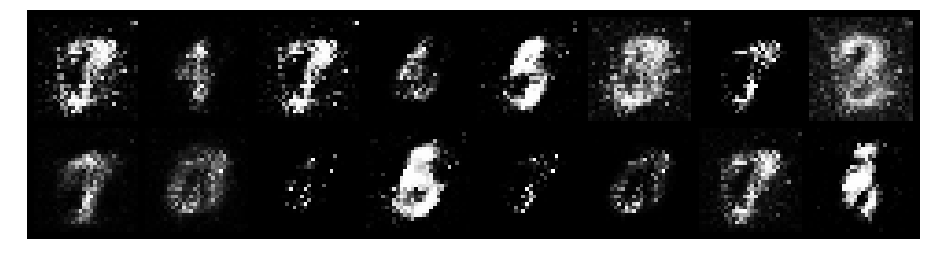

Epoch: [7/200], Batch Num: [300/600]
Discriminator Loss: 0.3726, Generator Loss: 2.8753
D(x): 0.9129, D(G(z)): 0.1592


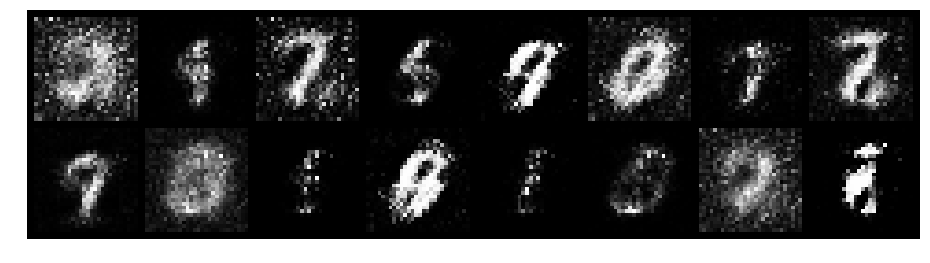

Epoch: [7/200], Batch Num: [400/600]
Discriminator Loss: 0.4979, Generator Loss: 2.0827
D(x): 0.8538, D(G(z)): 0.1787


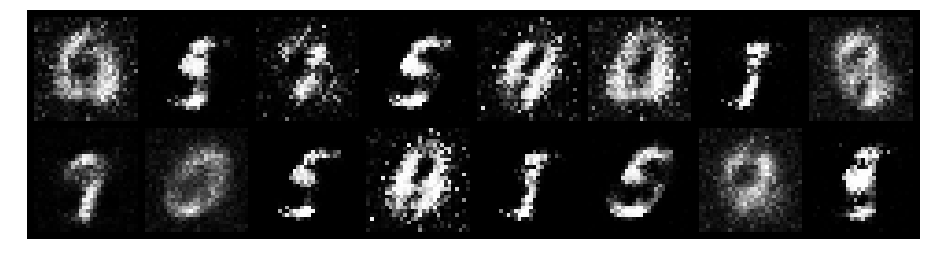

Epoch: [7/200], Batch Num: [500/600]
Discriminator Loss: 0.5503, Generator Loss: 2.3766
D(x): 0.8071, D(G(z)): 0.1518


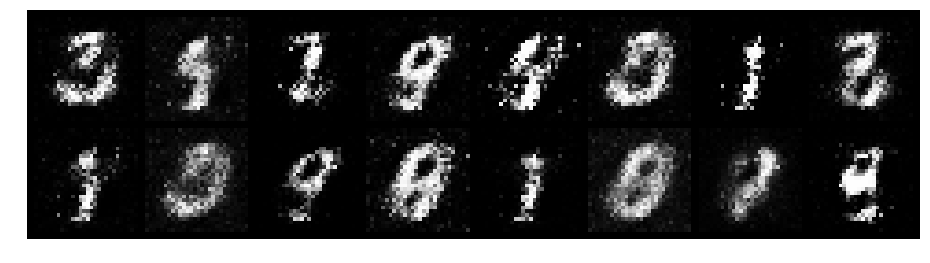

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 0.6430, Generator Loss: 2.6505
D(x): 0.8281, D(G(z)): 0.2070


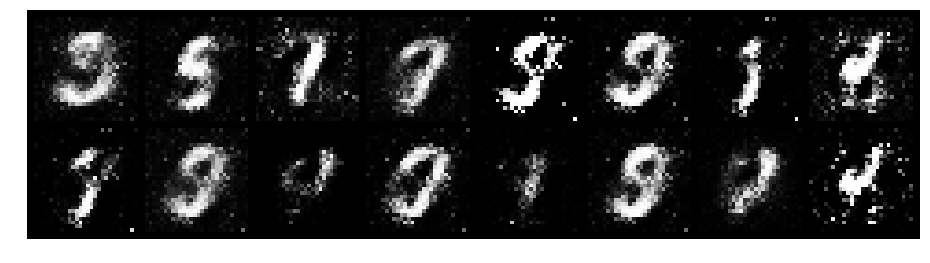

Epoch: [8/200], Batch Num: [100/600]
Discriminator Loss: 0.8813, Generator Loss: 2.6196
D(x): 0.7054, D(G(z)): 0.1590


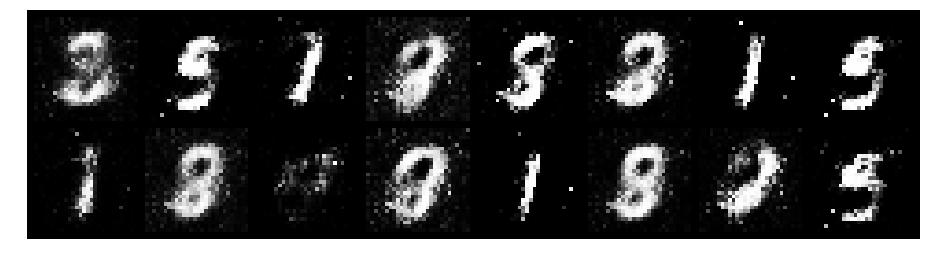

Epoch: [8/200], Batch Num: [200/600]
Discriminator Loss: 0.5382, Generator Loss: 2.9512
D(x): 0.7912, D(G(z)): 0.1292


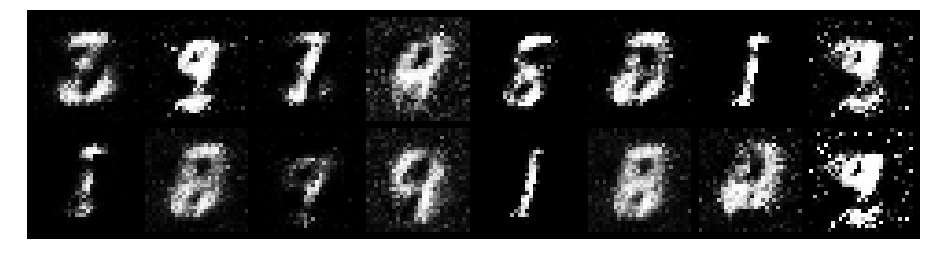

Epoch: [8/200], Batch Num: [300/600]
Discriminator Loss: 0.7349, Generator Loss: 1.9443
D(x): 0.7939, D(G(z)): 0.2559


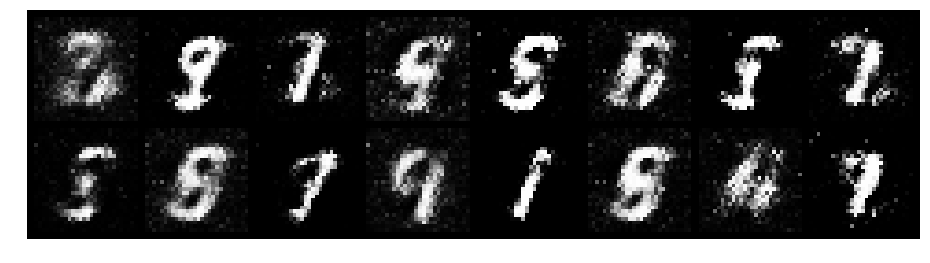

Epoch: [8/200], Batch Num: [400/600]
Discriminator Loss: 0.6151, Generator Loss: 2.4597
D(x): 0.8306, D(G(z)): 0.2003


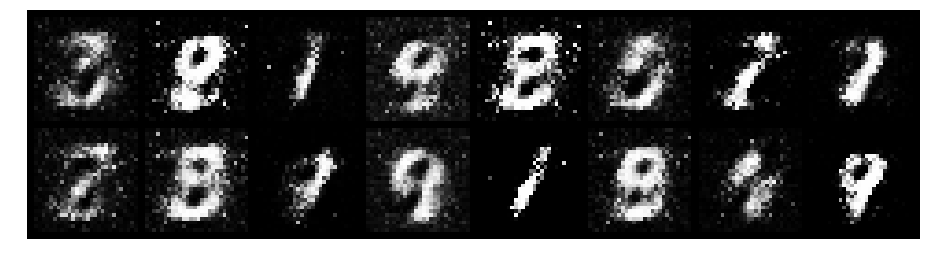

Epoch: [8/200], Batch Num: [500/600]
Discriminator Loss: 0.3954, Generator Loss: 3.0755
D(x): 0.8807, D(G(z)): 0.1452


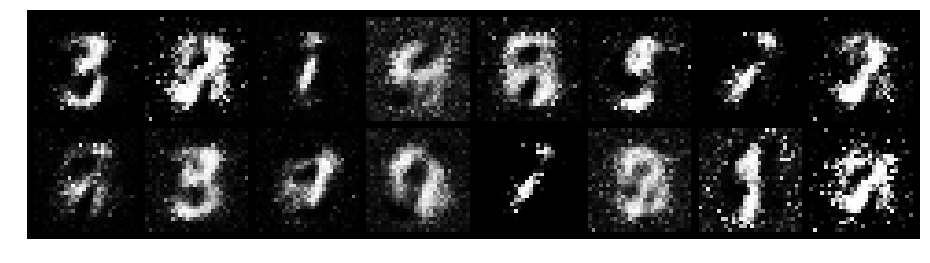

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 0.4227, Generator Loss: 2.4293
D(x): 0.8396, D(G(z)): 0.1455


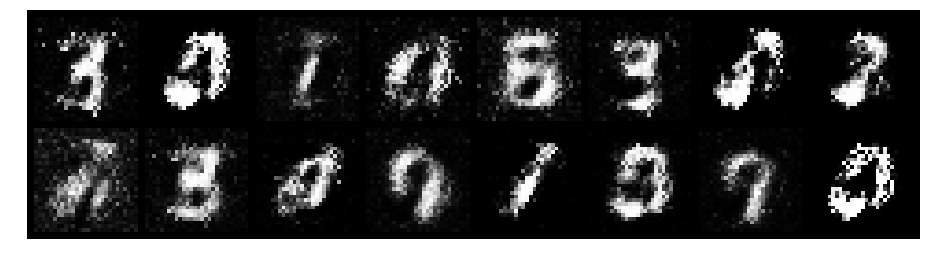

Epoch: [9/200], Batch Num: [100/600]
Discriminator Loss: 0.5960, Generator Loss: 2.2862
D(x): 0.8644, D(G(z)): 0.2358


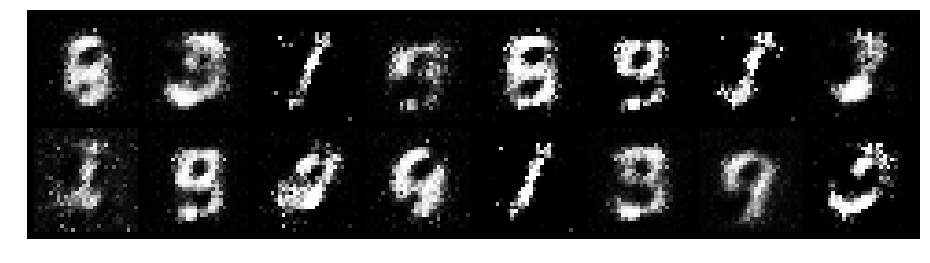

Epoch: [9/200], Batch Num: [200/600]
Discriminator Loss: 0.6174, Generator Loss: 2.0561
D(x): 0.7827, D(G(z)): 0.2181


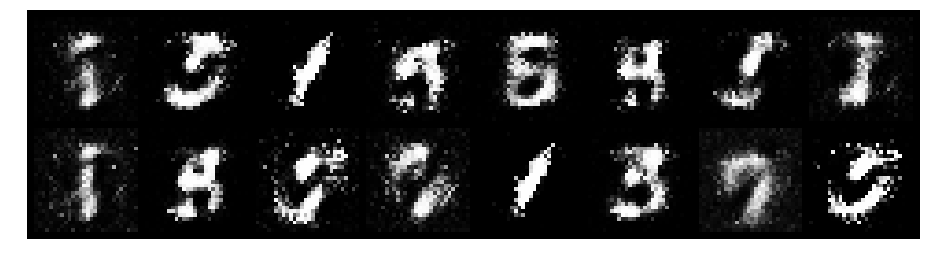

Epoch: [9/200], Batch Num: [300/600]
Discriminator Loss: 0.5998, Generator Loss: 3.9669
D(x): 0.8453, D(G(z)): 0.2113


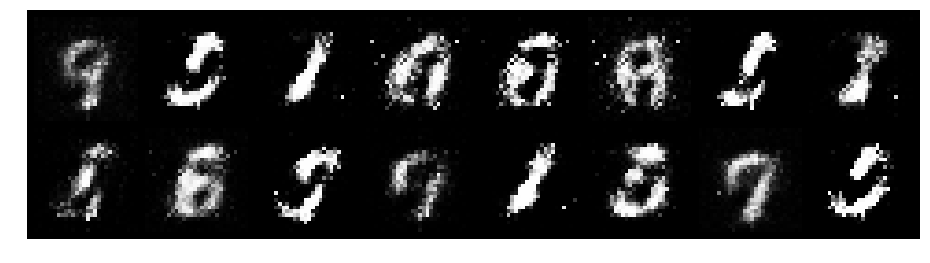

Epoch: [9/200], Batch Num: [400/600]
Discriminator Loss: 0.5036, Generator Loss: 2.4393
D(x): 0.8214, D(G(z)): 0.1303


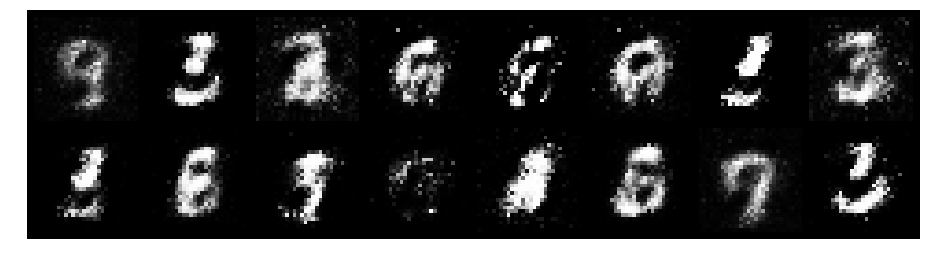

Epoch: [9/200], Batch Num: [500/600]
Discriminator Loss: 0.8249, Generator Loss: 2.7701
D(x): 0.6965, D(G(z)): 0.1852


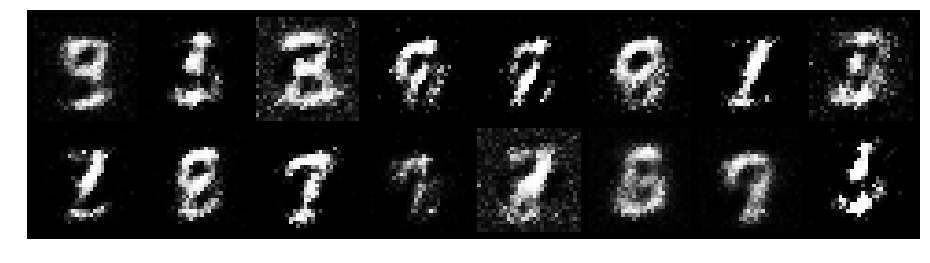

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 0.7409, Generator Loss: 2.2889
D(x): 0.8143, D(G(z)): 0.2471


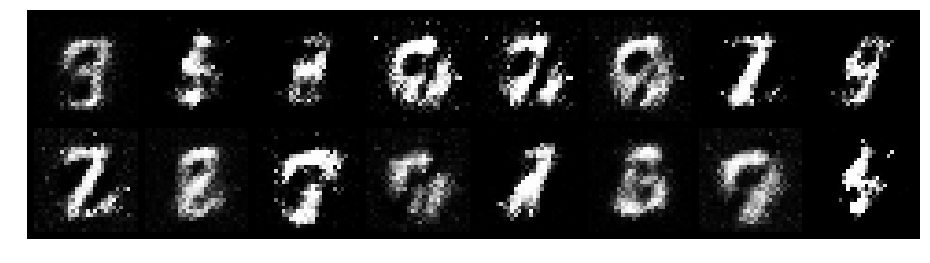

Epoch: [10/200], Batch Num: [100/600]
Discriminator Loss: 0.6824, Generator Loss: 2.0088
D(x): 0.7368, D(G(z)): 0.1968


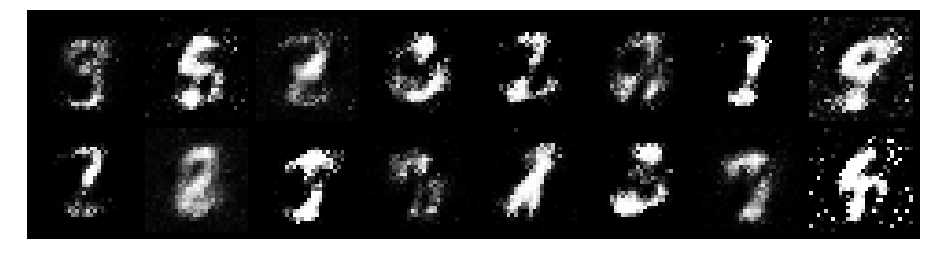

Epoch: [10/200], Batch Num: [200/600]
Discriminator Loss: 0.7627, Generator Loss: 1.6887
D(x): 0.8032, D(G(z)): 0.2932


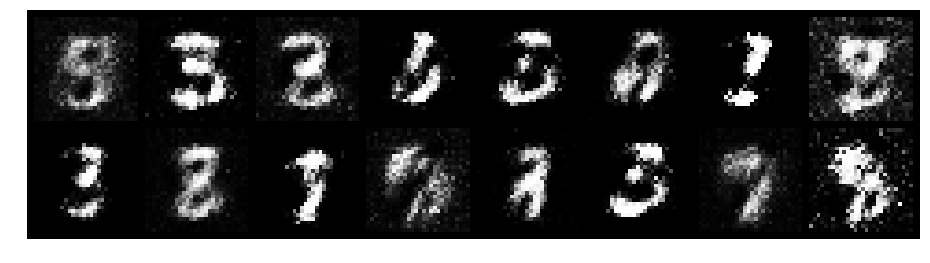

Epoch: [10/200], Batch Num: [300/600]
Discriminator Loss: 0.7314, Generator Loss: 2.4296
D(x): 0.8029, D(G(z)): 0.2218


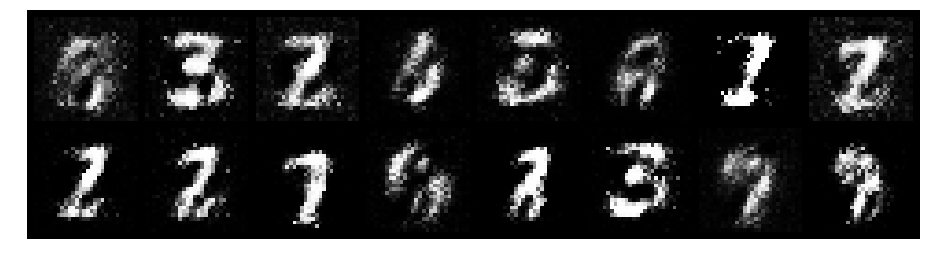

Epoch: [10/200], Batch Num: [400/600]
Discriminator Loss: 0.5887, Generator Loss: 1.9453
D(x): 0.7774, D(G(z)): 0.1558


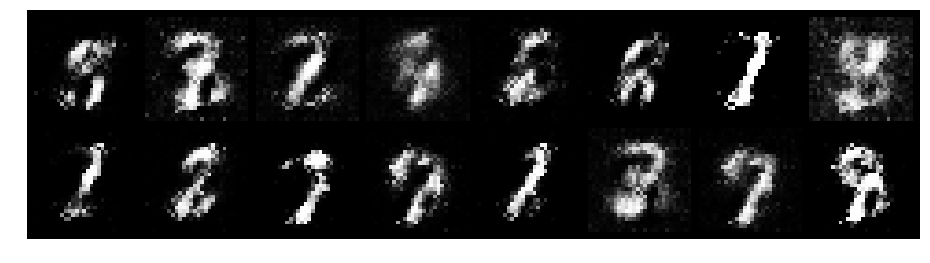

Epoch: [10/200], Batch Num: [500/600]
Discriminator Loss: 0.5534, Generator Loss: 2.2521
D(x): 0.8067, D(G(z)): 0.1486


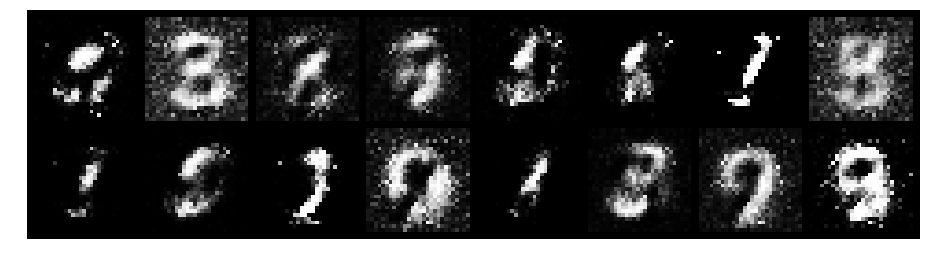

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 0.6067, Generator Loss: 2.3910
D(x): 0.8447, D(G(z)): 0.2149


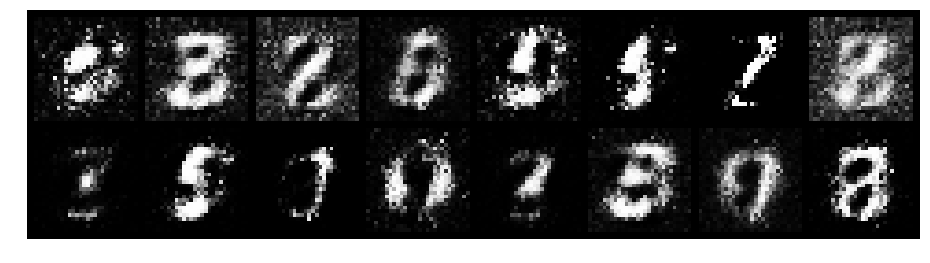

Epoch: [11/200], Batch Num: [100/600]
Discriminator Loss: 0.8252, Generator Loss: 2.0336
D(x): 0.7794, D(G(z)): 0.2830


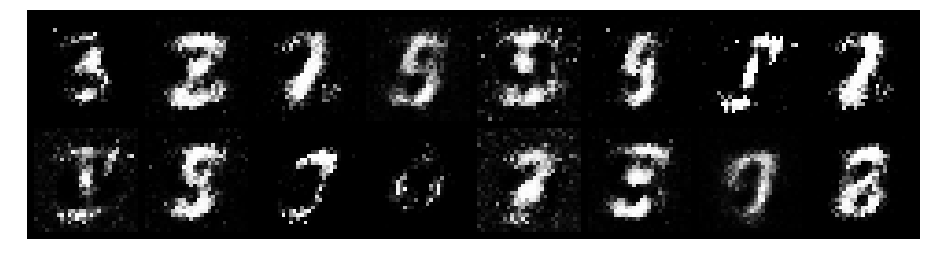

Epoch: [11/200], Batch Num: [200/600]
Discriminator Loss: 0.7082, Generator Loss: 2.2673
D(x): 0.7496, D(G(z)): 0.1953


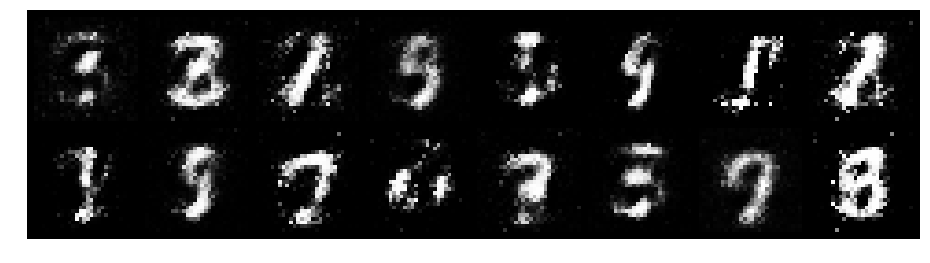

Epoch: [11/200], Batch Num: [300/600]
Discriminator Loss: 0.9014, Generator Loss: 1.9373
D(x): 0.7809, D(G(z)): 0.3186


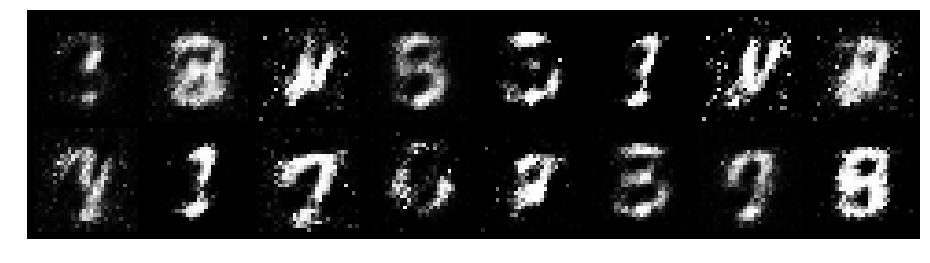

Epoch: [11/200], Batch Num: [400/600]
Discriminator Loss: 0.5008, Generator Loss: 2.3514
D(x): 0.8333, D(G(z)): 0.1845


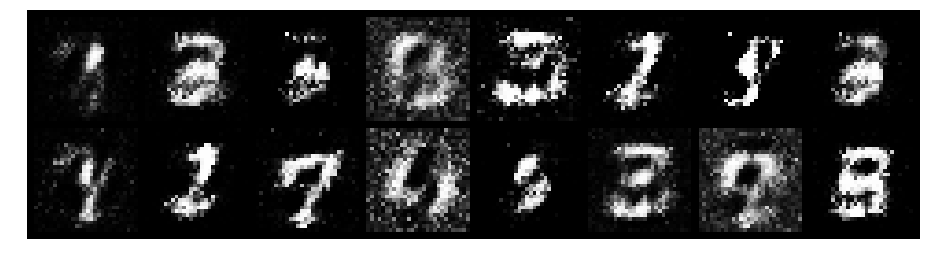

Epoch: [11/200], Batch Num: [500/600]
Discriminator Loss: 0.7898, Generator Loss: 1.9881
D(x): 0.7018, D(G(z)): 0.1898


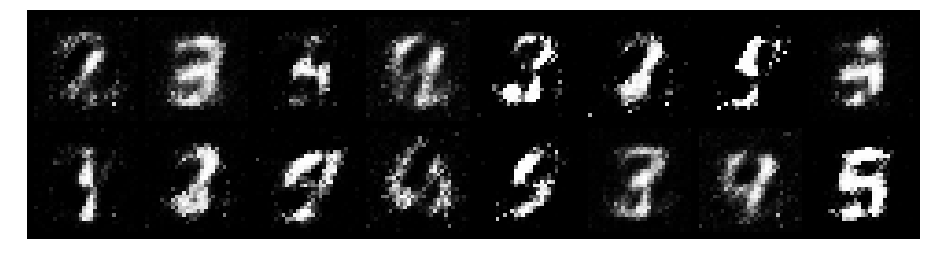

Epoch: [12/200], Batch Num: [0/600]
Discriminator Loss: 0.5546, Generator Loss: 2.1239
D(x): 0.8071, D(G(z)): 0.1953


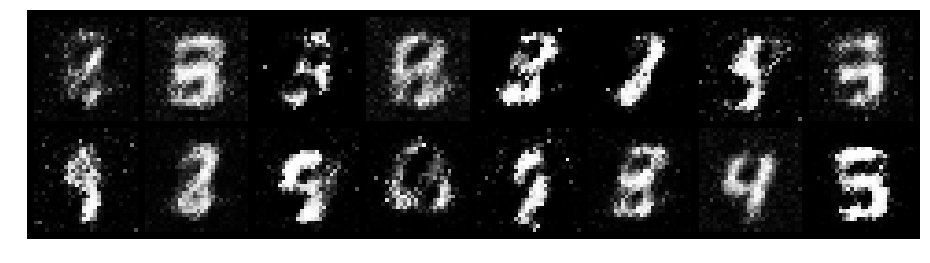

Epoch: [12/200], Batch Num: [100/600]
Discriminator Loss: 0.7000, Generator Loss: 2.2134
D(x): 0.7223, D(G(z)): 0.1907


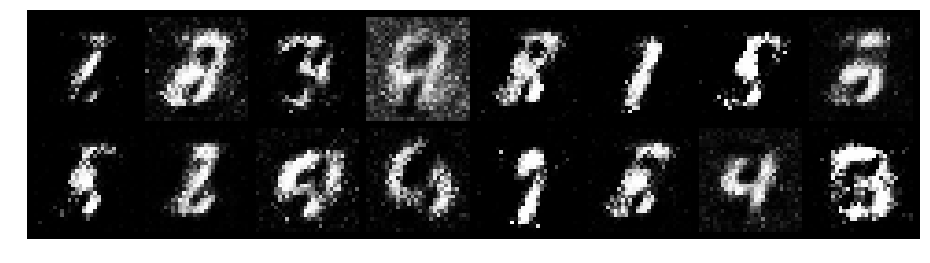

Epoch: [12/200], Batch Num: [200/600]
Discriminator Loss: 1.1291, Generator Loss: 1.5204
D(x): 0.6487, D(G(z)): 0.3457


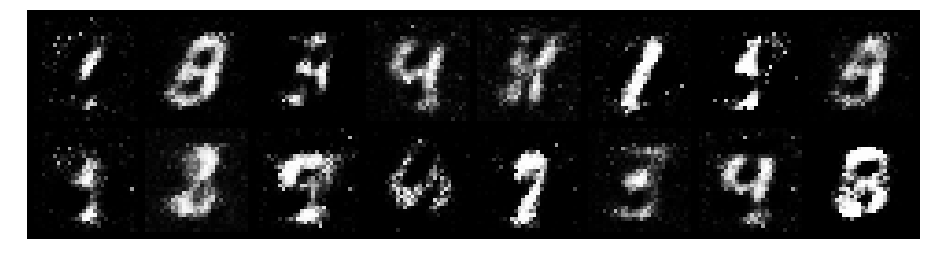

Epoch: [12/200], Batch Num: [300/600]
Discriminator Loss: 0.7380, Generator Loss: 1.5560
D(x): 0.7921, D(G(z)): 0.3007


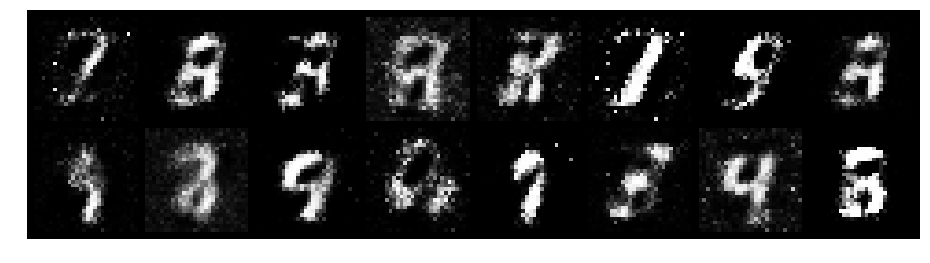

Epoch: [12/200], Batch Num: [400/600]
Discriminator Loss: 0.7836, Generator Loss: 1.3005
D(x): 0.8415, D(G(z)): 0.3365


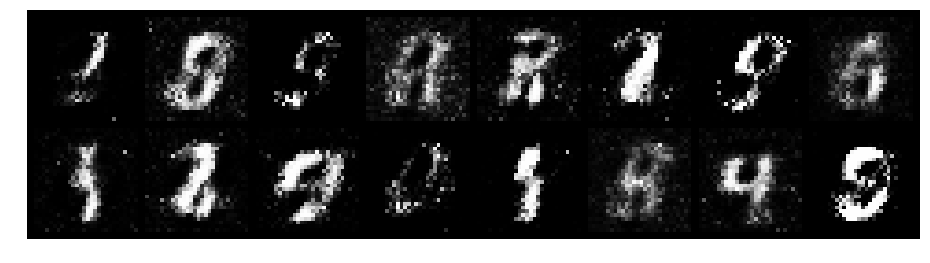

Epoch: [12/200], Batch Num: [500/600]
Discriminator Loss: 0.8094, Generator Loss: 1.8134
D(x): 0.7703, D(G(z)): 0.3018


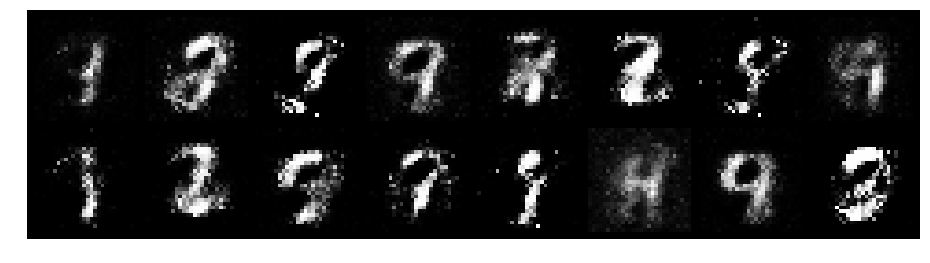

Epoch: [13/200], Batch Num: [0/600]
Discriminator Loss: 0.8906, Generator Loss: 1.7781
D(x): 0.6840, D(G(z)): 0.1959


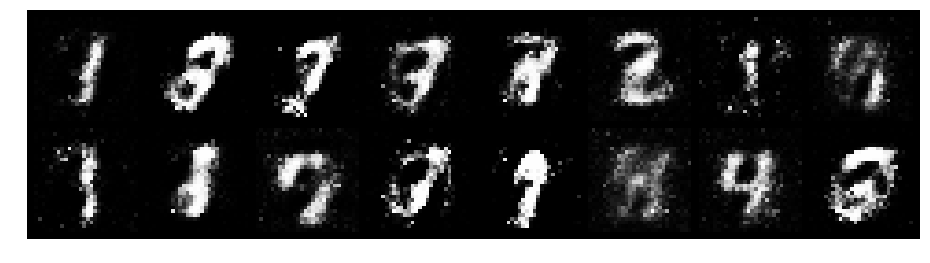

Epoch: [13/200], Batch Num: [100/600]
Discriminator Loss: 1.0162, Generator Loss: 1.4081
D(x): 0.7168, D(G(z)): 0.3434


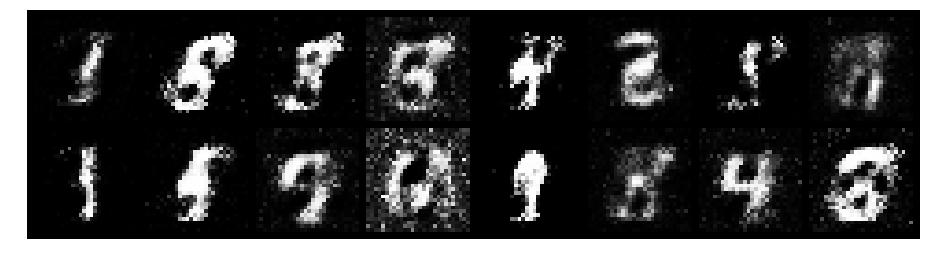

Epoch: [13/200], Batch Num: [200/600]
Discriminator Loss: 0.5835, Generator Loss: 2.5459
D(x): 0.7783, D(G(z)): 0.1727


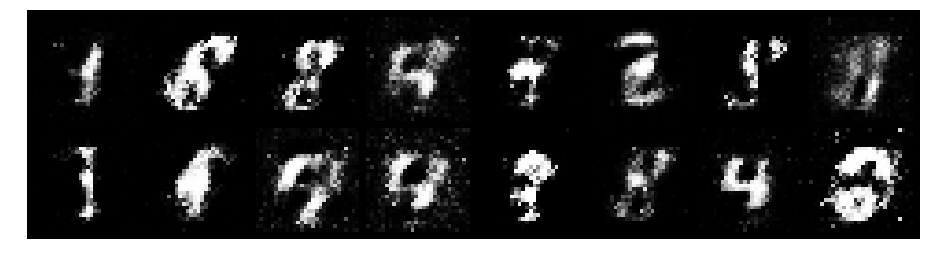

Epoch: [13/200], Batch Num: [300/600]
Discriminator Loss: 0.8048, Generator Loss: 1.8170
D(x): 0.8220, D(G(z)): 0.3020


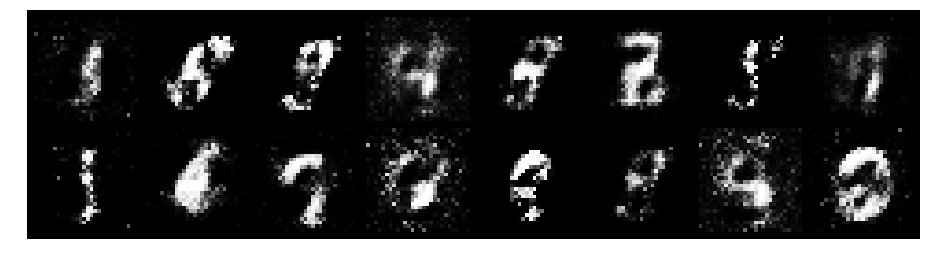

Epoch: [13/200], Batch Num: [400/600]
Discriminator Loss: 0.5407, Generator Loss: 2.5769
D(x): 0.8099, D(G(z)): 0.1681


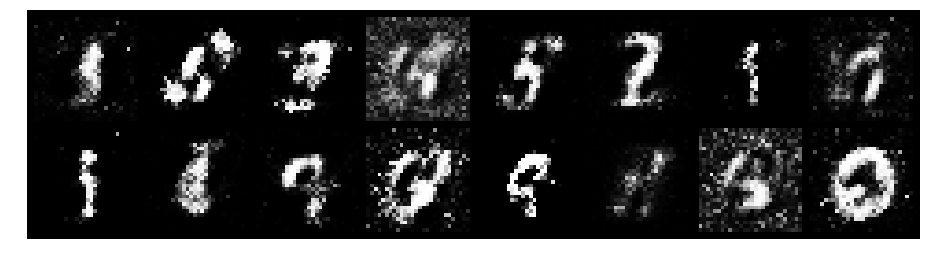

Epoch: [13/200], Batch Num: [500/600]
Discriminator Loss: 0.9544, Generator Loss: 1.7403
D(x): 0.6412, D(G(z)): 0.2256


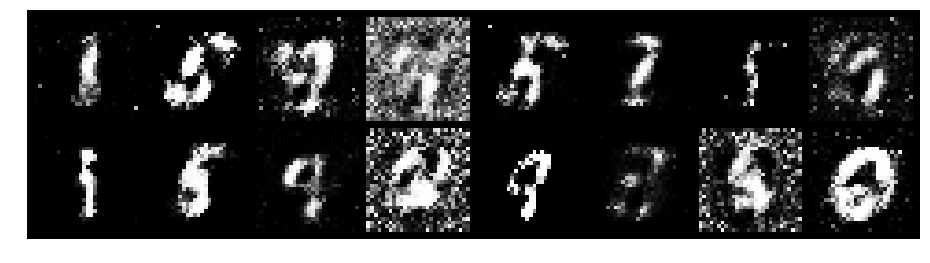

Epoch: [14/200], Batch Num: [0/600]
Discriminator Loss: 0.7883, Generator Loss: 1.7132
D(x): 0.7378, D(G(z)): 0.2611


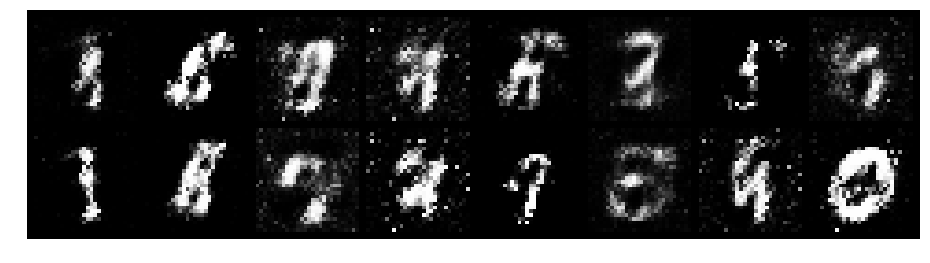

Epoch: [14/200], Batch Num: [100/600]
Discriminator Loss: 0.8729, Generator Loss: 2.5901
D(x): 0.6672, D(G(z)): 0.1934


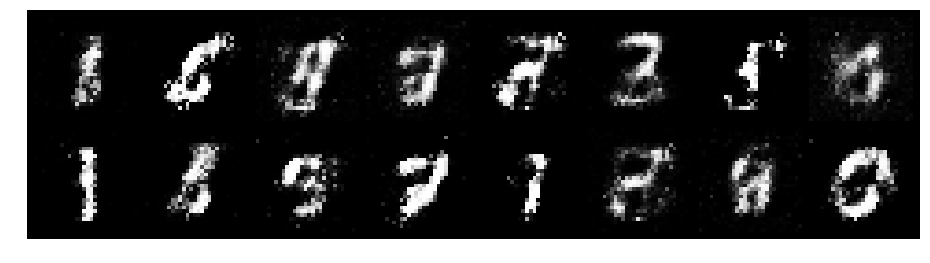

Epoch: [14/200], Batch Num: [200/600]
Discriminator Loss: 0.8282, Generator Loss: 1.5667
D(x): 0.7678, D(G(z)): 0.3219


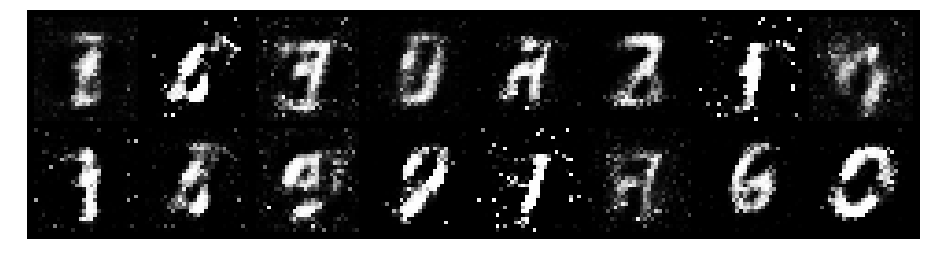

Epoch: [14/200], Batch Num: [300/600]
Discriminator Loss: 0.9682, Generator Loss: 1.8440
D(x): 0.6354, D(G(z)): 0.2247


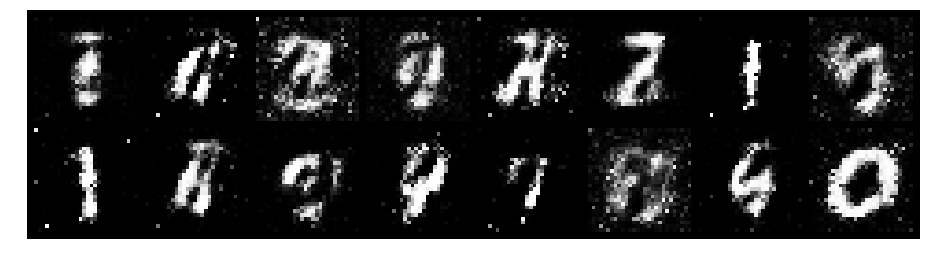

Epoch: [14/200], Batch Num: [400/600]
Discriminator Loss: 0.8065, Generator Loss: 1.7555
D(x): 0.7535, D(G(z)): 0.2628


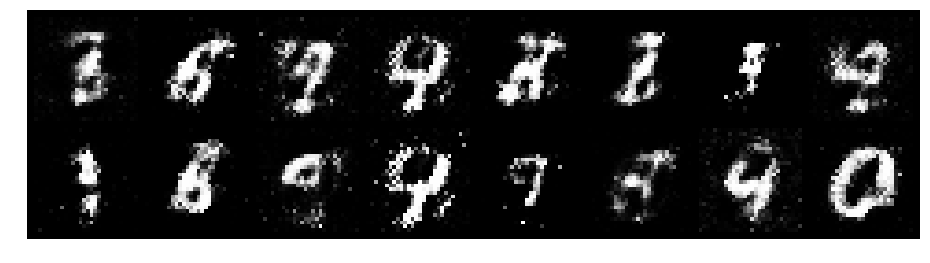

Epoch: [14/200], Batch Num: [500/600]
Discriminator Loss: 0.8618, Generator Loss: 1.7949
D(x): 0.7514, D(G(z)): 0.3035


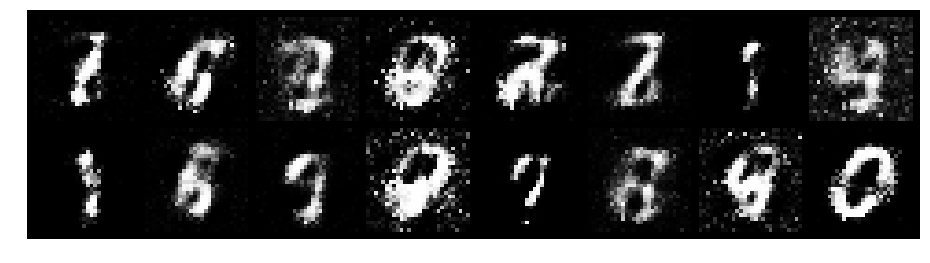

Epoch: [15/200], Batch Num: [0/600]
Discriminator Loss: 0.8600, Generator Loss: 2.4925
D(x): 0.7815, D(G(z)): 0.2848


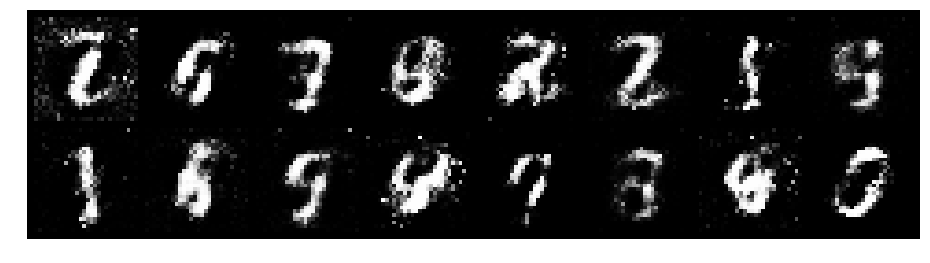

Epoch: [15/200], Batch Num: [100/600]
Discriminator Loss: 0.8773, Generator Loss: 2.4789
D(x): 0.7097, D(G(z)): 0.2527


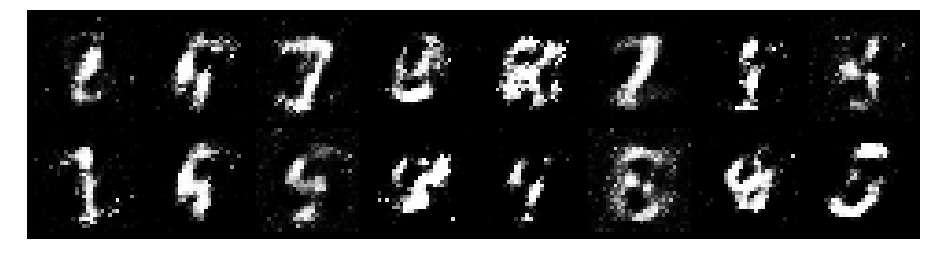

Epoch: [15/200], Batch Num: [200/600]
Discriminator Loss: 1.0345, Generator Loss: 1.4897
D(x): 0.7261, D(G(z)): 0.3328


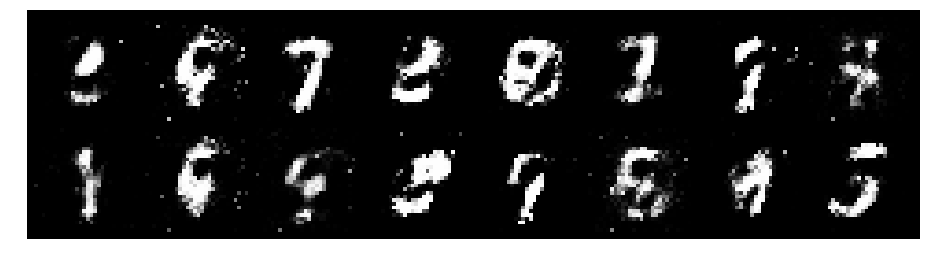

Epoch: [15/200], Batch Num: [300/600]
Discriminator Loss: 1.0994, Generator Loss: 1.3942
D(x): 0.6343, D(G(z)): 0.2820


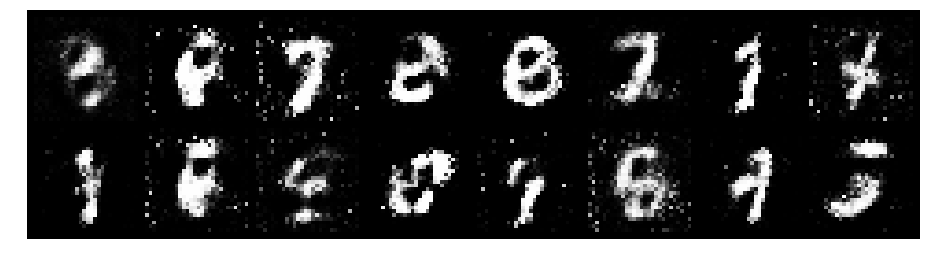

Epoch: [15/200], Batch Num: [400/600]
Discriminator Loss: 1.1245, Generator Loss: 1.3078
D(x): 0.6906, D(G(z)): 0.3797


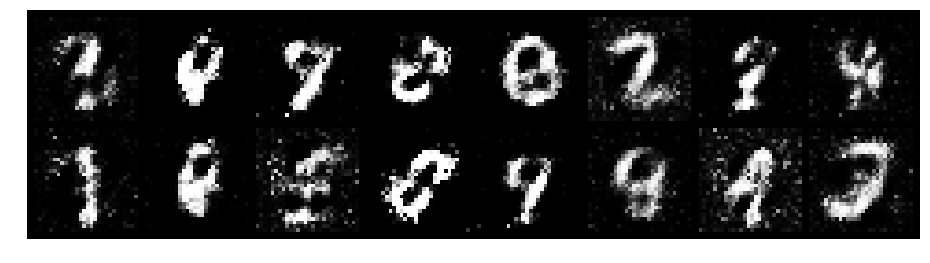

Epoch: [15/200], Batch Num: [500/600]
Discriminator Loss: 0.9512, Generator Loss: 1.8406
D(x): 0.6903, D(G(z)): 0.2663


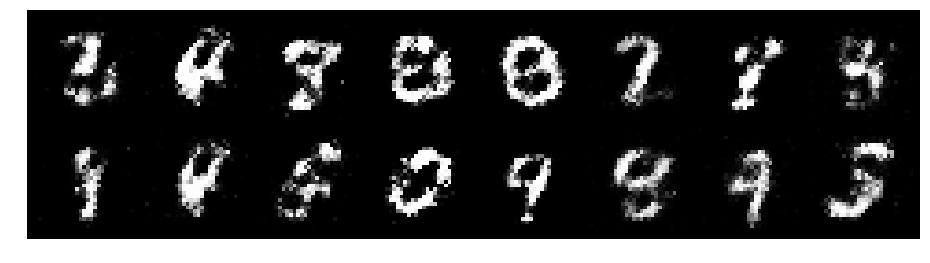

Epoch: [16/200], Batch Num: [0/600]
Discriminator Loss: 0.8410, Generator Loss: 1.6832
D(x): 0.7385, D(G(z)): 0.2911


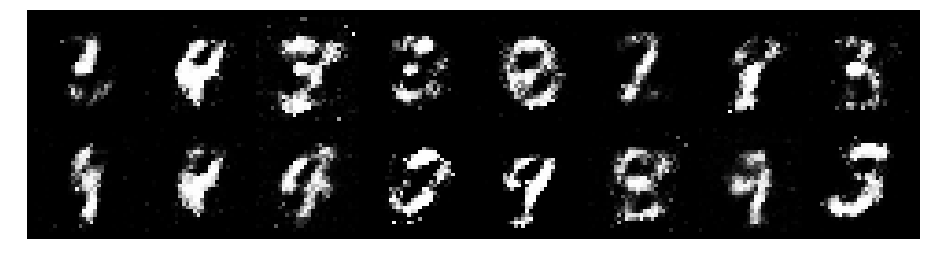

Epoch: [16/200], Batch Num: [100/600]
Discriminator Loss: 0.7234, Generator Loss: 1.5959
D(x): 0.7647, D(G(z)): 0.2533


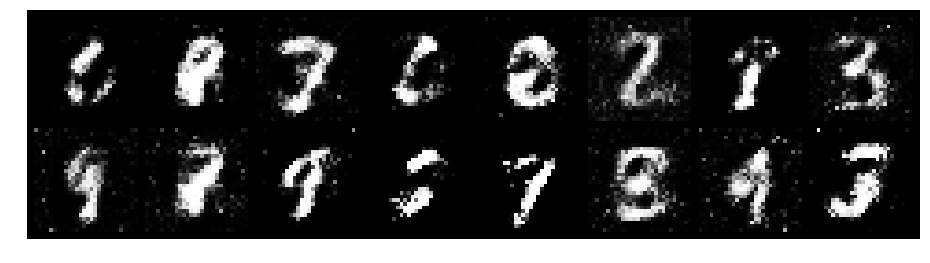

Epoch: [16/200], Batch Num: [200/600]
Discriminator Loss: 0.8604, Generator Loss: 1.5306
D(x): 0.7587, D(G(z)): 0.3080


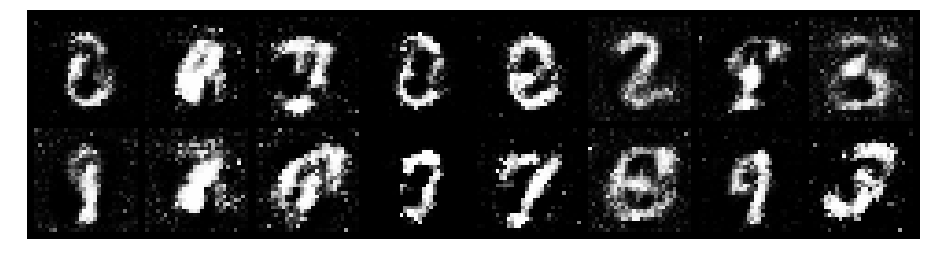

Epoch: [16/200], Batch Num: [300/600]
Discriminator Loss: 0.9425, Generator Loss: 1.6455
D(x): 0.6914, D(G(z)): 0.2947


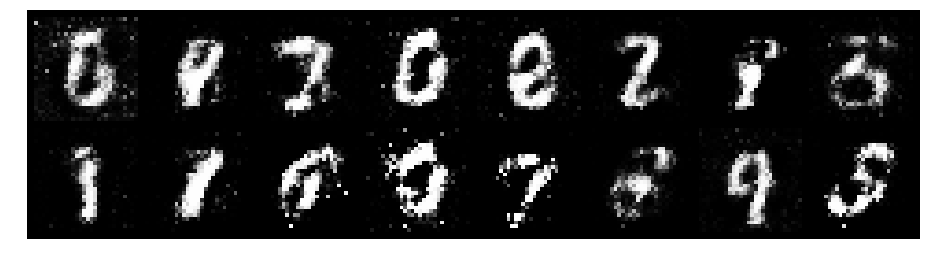

Epoch: [16/200], Batch Num: [400/600]
Discriminator Loss: 0.9700, Generator Loss: 2.3220
D(x): 0.6468, D(G(z)): 0.2228


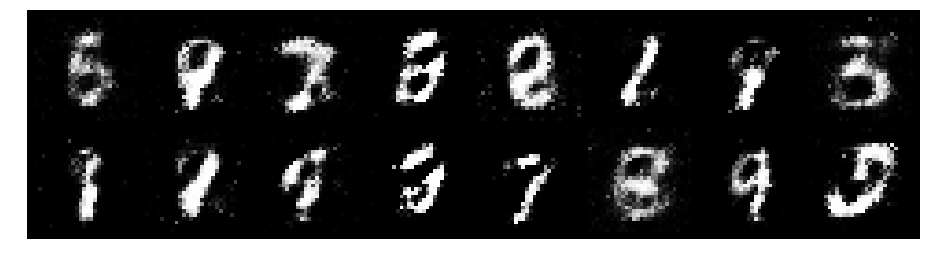

Epoch: [16/200], Batch Num: [500/600]
Discriminator Loss: 0.8564, Generator Loss: 1.8324
D(x): 0.7269, D(G(z)): 0.2773


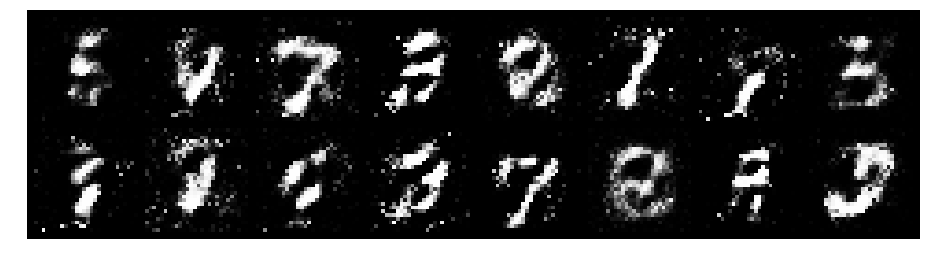

Epoch: [17/200], Batch Num: [0/600]
Discriminator Loss: 0.8028, Generator Loss: 1.3740
D(x): 0.7626, D(G(z)): 0.3119


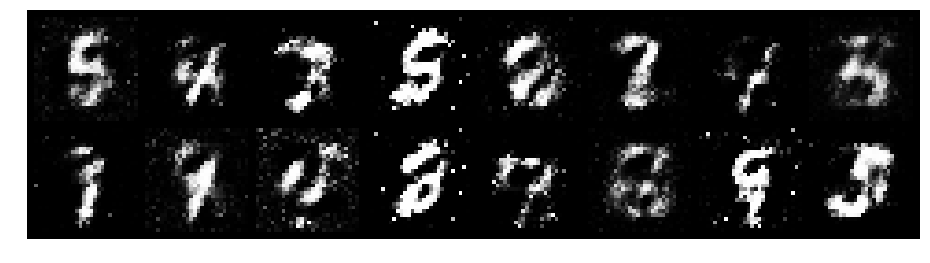

Epoch: [17/200], Batch Num: [100/600]
Discriminator Loss: 0.5943, Generator Loss: 1.7586
D(x): 0.8362, D(G(z)): 0.2381


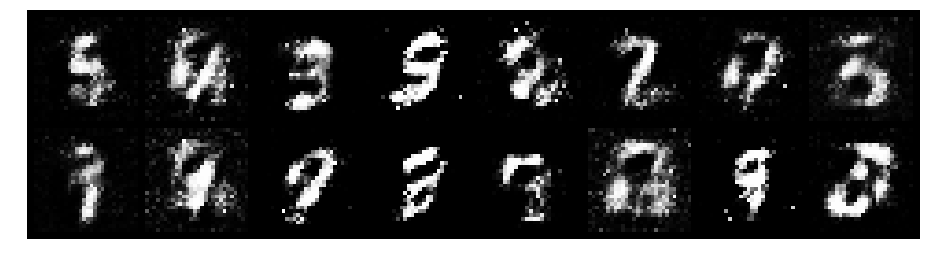

Epoch: [17/200], Batch Num: [200/600]
Discriminator Loss: 0.9409, Generator Loss: 1.6975
D(x): 0.6886, D(G(z)): 0.2775


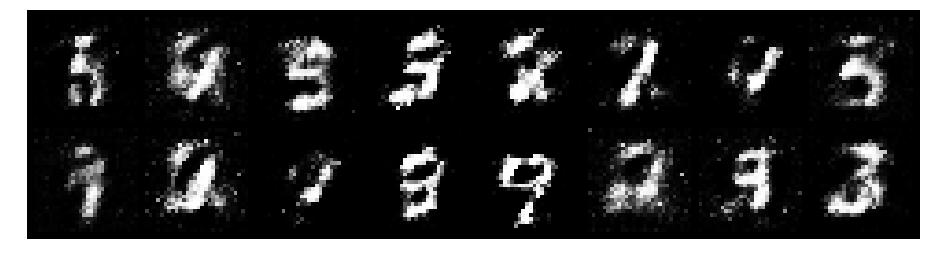

Epoch: [17/200], Batch Num: [300/600]
Discriminator Loss: 0.9617, Generator Loss: 1.8043
D(x): 0.6107, D(G(z)): 0.1995


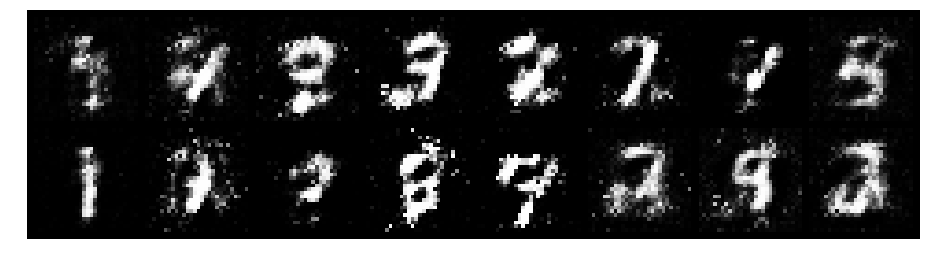

Epoch: [17/200], Batch Num: [400/600]
Discriminator Loss: 0.6794, Generator Loss: 2.0465
D(x): 0.7386, D(G(z)): 0.2083


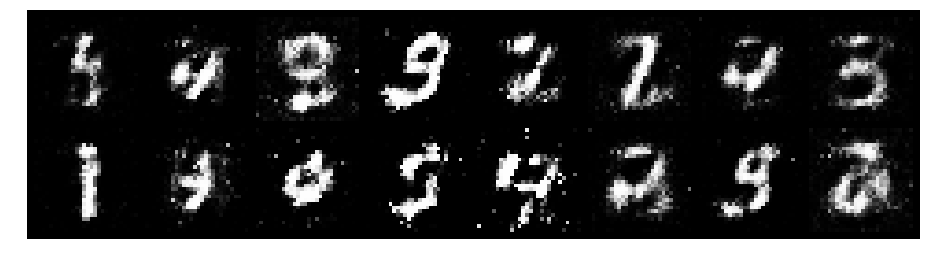

Epoch: [17/200], Batch Num: [500/600]
Discriminator Loss: 0.8404, Generator Loss: 1.7507
D(x): 0.7157, D(G(z)): 0.2873


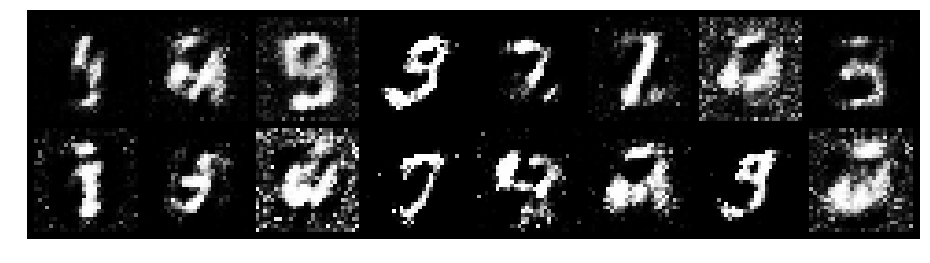

Epoch: [18/200], Batch Num: [0/600]
Discriminator Loss: 0.9588, Generator Loss: 1.8130
D(x): 0.6862, D(G(z)): 0.3076


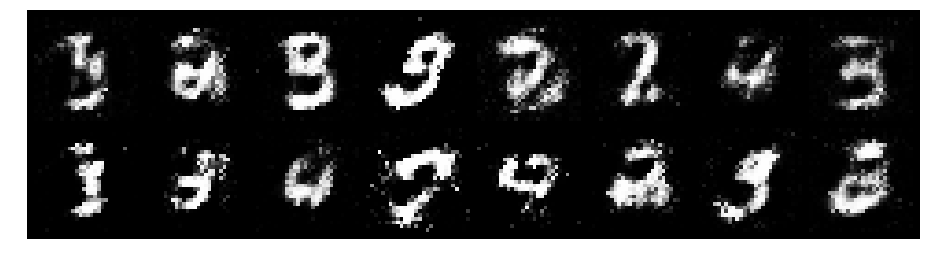

Epoch: [18/200], Batch Num: [100/600]
Discriminator Loss: 0.8901, Generator Loss: 2.0579
D(x): 0.6763, D(G(z)): 0.2302


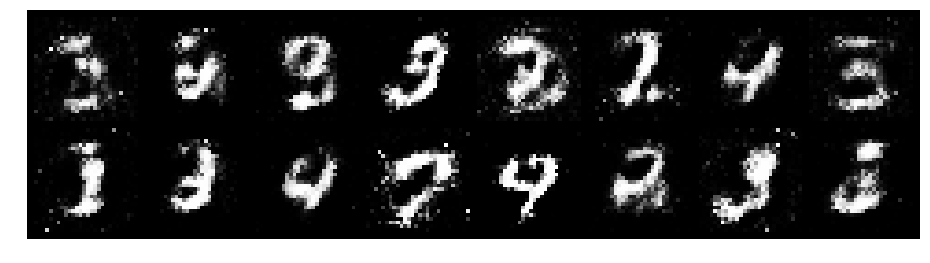

Epoch: [18/200], Batch Num: [200/600]
Discriminator Loss: 0.9682, Generator Loss: 1.8358
D(x): 0.6998, D(G(z)): 0.2908


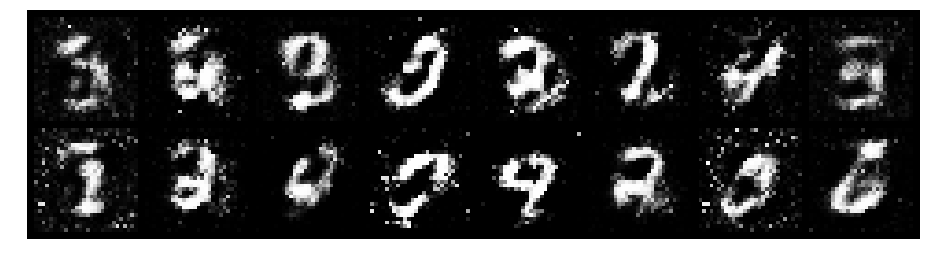

Epoch: [18/200], Batch Num: [300/600]
Discriminator Loss: 0.8842, Generator Loss: 1.5664
D(x): 0.7528, D(G(z)): 0.2575


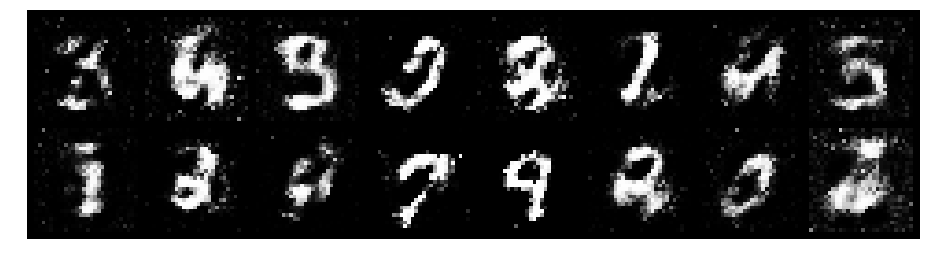

Epoch: [18/200], Batch Num: [400/600]
Discriminator Loss: 0.9197, Generator Loss: 1.5320
D(x): 0.6592, D(G(z)): 0.2494


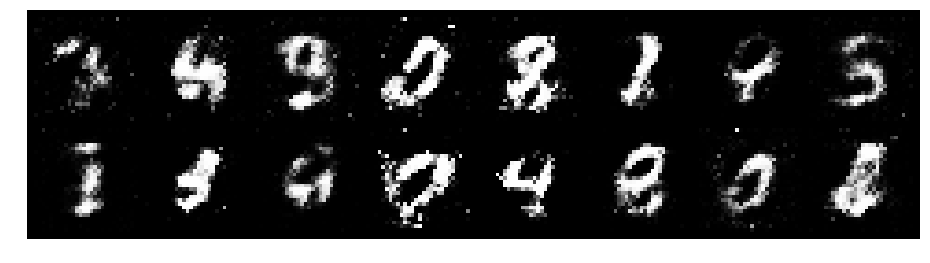

Epoch: [18/200], Batch Num: [500/600]
Discriminator Loss: 0.9680, Generator Loss: 1.8668
D(x): 0.6585, D(G(z)): 0.2338


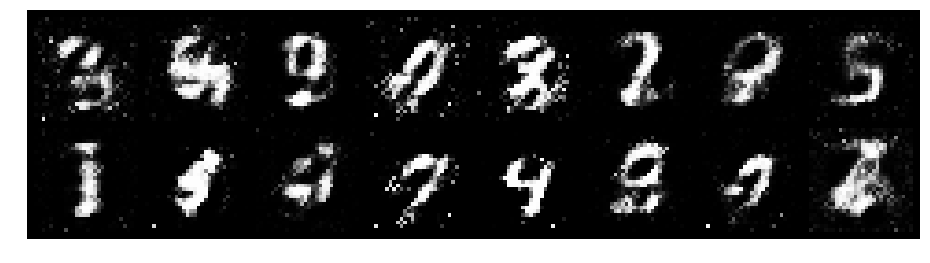

Epoch: [19/200], Batch Num: [0/600]
Discriminator Loss: 0.9609, Generator Loss: 1.4169
D(x): 0.6908, D(G(z)): 0.2950


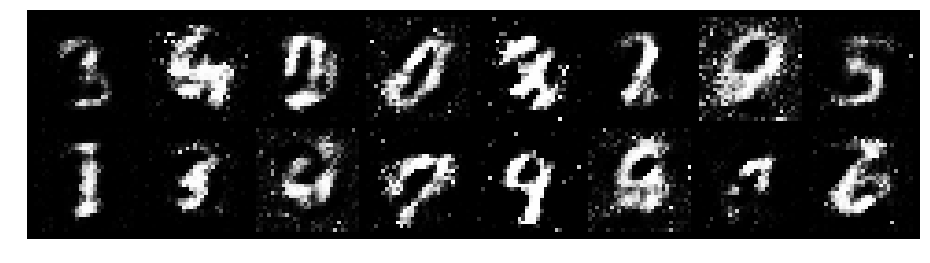

Epoch: [19/200], Batch Num: [100/600]
Discriminator Loss: 0.9597, Generator Loss: 1.5066
D(x): 0.6702, D(G(z)): 0.3195


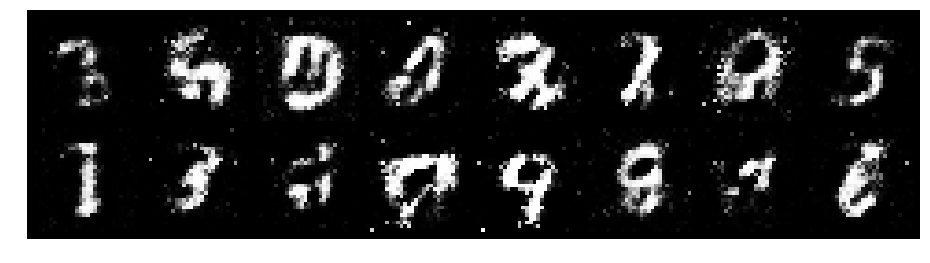

Epoch: [19/200], Batch Num: [200/600]
Discriminator Loss: 0.8300, Generator Loss: 1.9893
D(x): 0.7162, D(G(z)): 0.2530


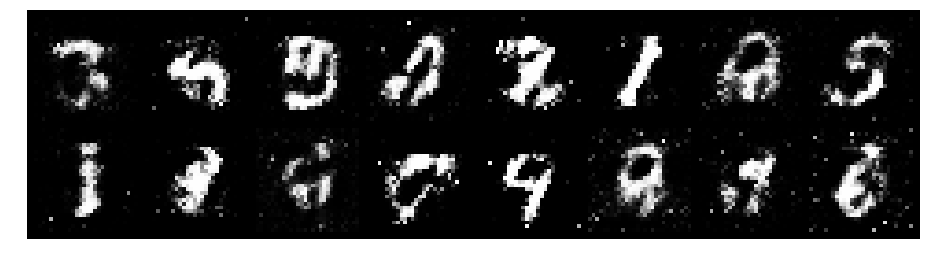

Epoch: [19/200], Batch Num: [300/600]
Discriminator Loss: 1.0786, Generator Loss: 0.9500
D(x): 0.6641, D(G(z)): 0.3959


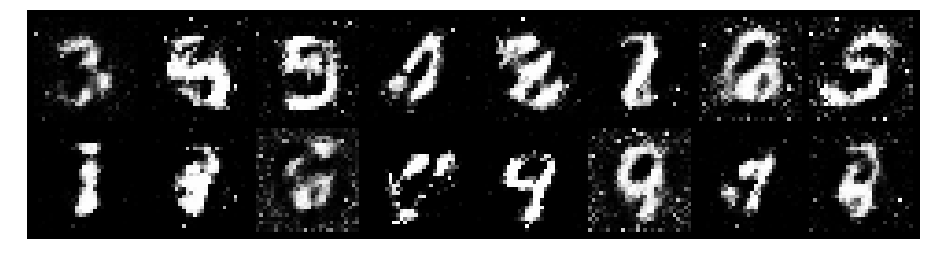

Epoch: [19/200], Batch Num: [400/600]
Discriminator Loss: 0.7760, Generator Loss: 1.7038
D(x): 0.7686, D(G(z)): 0.2851


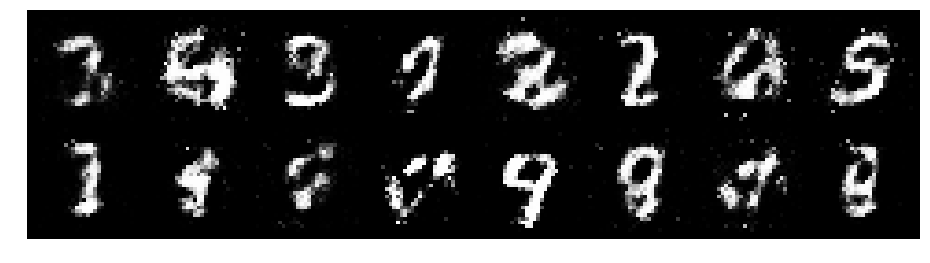

Epoch: [19/200], Batch Num: [500/600]
Discriminator Loss: 0.9591, Generator Loss: 1.2836
D(x): 0.7438, D(G(z)): 0.3566


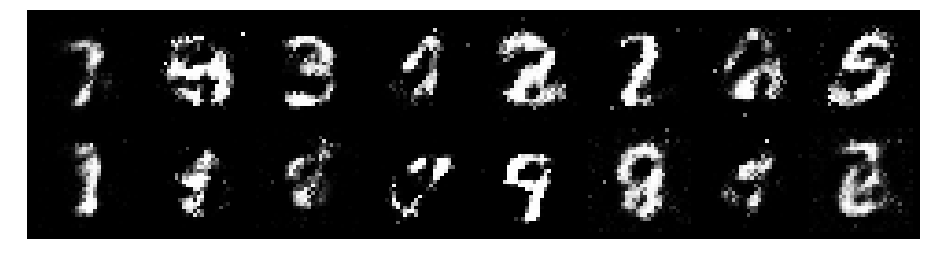

Epoch: [20/200], Batch Num: [0/600]
Discriminator Loss: 0.8709, Generator Loss: 1.2823
D(x): 0.6560, D(G(z)): 0.2865


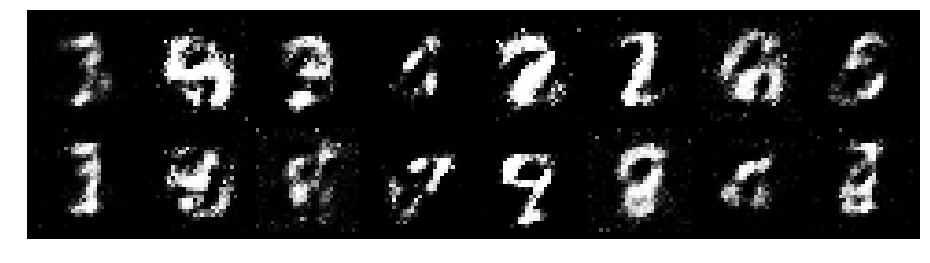

Epoch: [20/200], Batch Num: [100/600]
Discriminator Loss: 1.0170, Generator Loss: 1.2659
D(x): 0.6372, D(G(z)): 0.3398


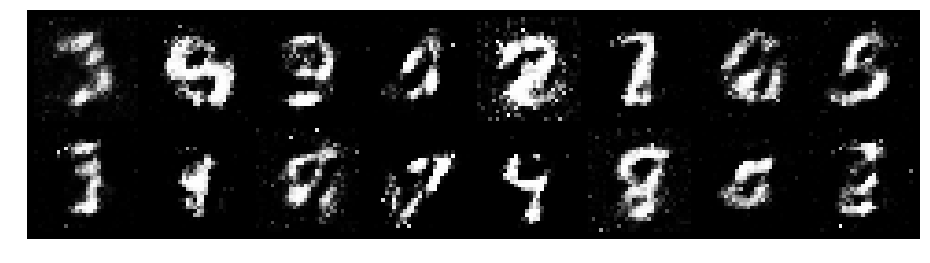

Epoch: [20/200], Batch Num: [200/600]
Discriminator Loss: 0.8985, Generator Loss: 1.3101
D(x): 0.7523, D(G(z)): 0.3457


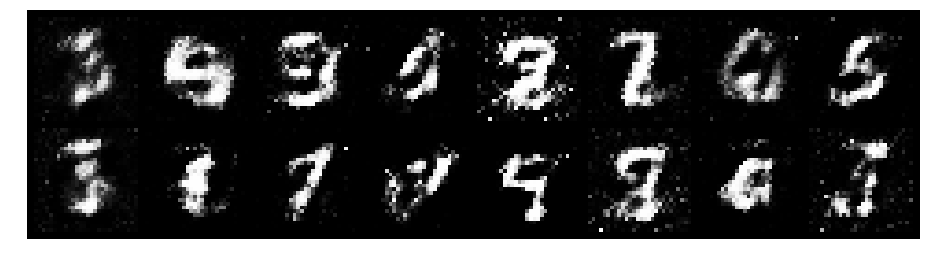

Epoch: [20/200], Batch Num: [300/600]
Discriminator Loss: 0.8292, Generator Loss: 1.4578
D(x): 0.7298, D(G(z)): 0.2924


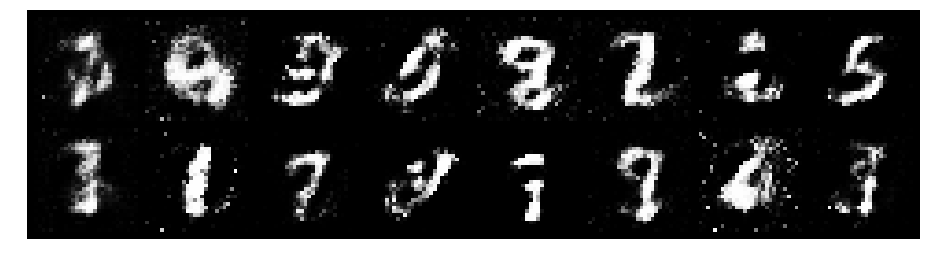

Epoch: [20/200], Batch Num: [400/600]
Discriminator Loss: 0.7582, Generator Loss: 1.6062
D(x): 0.7438, D(G(z)): 0.2941


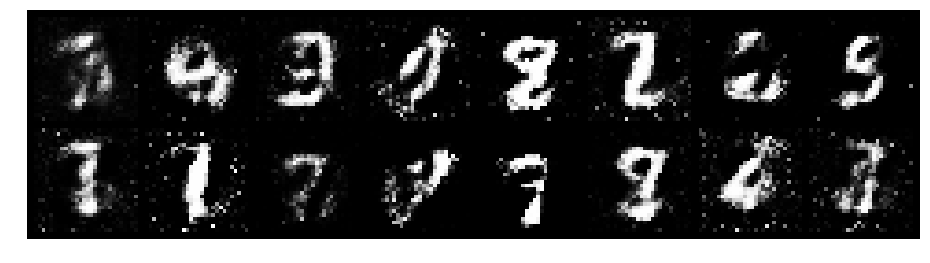

Epoch: [20/200], Batch Num: [500/600]
Discriminator Loss: 1.0384, Generator Loss: 1.6360
D(x): 0.6937, D(G(z)): 0.3365


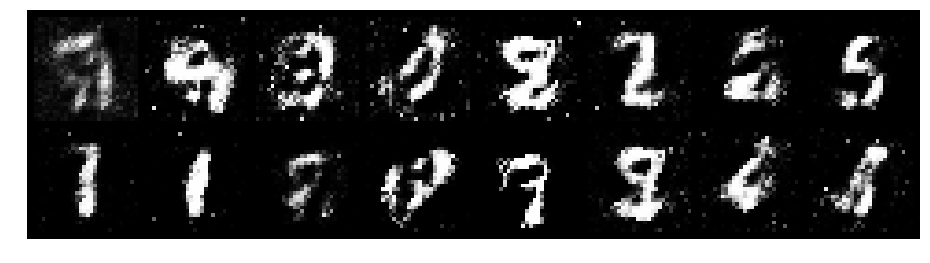

Epoch: [21/200], Batch Num: [0/600]
Discriminator Loss: 0.9420, Generator Loss: 1.9734
D(x): 0.7205, D(G(z)): 0.3151


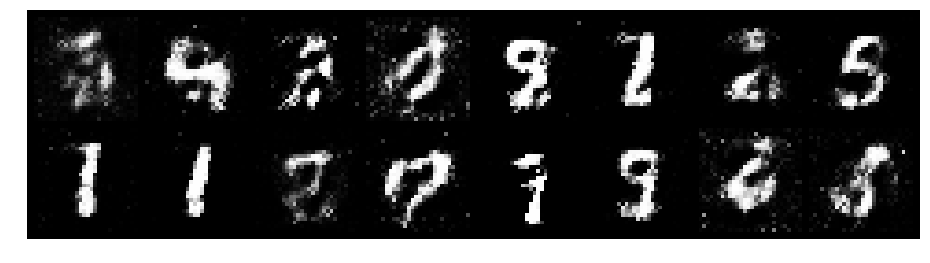

Epoch: [21/200], Batch Num: [100/600]
Discriminator Loss: 0.7784, Generator Loss: 1.6973
D(x): 0.7124, D(G(z)): 0.2144


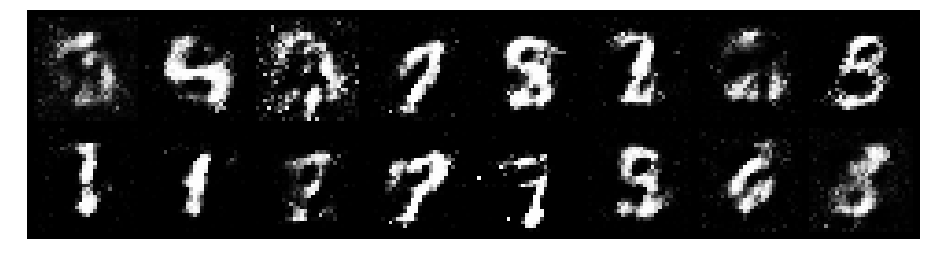

Epoch: [21/200], Batch Num: [200/600]
Discriminator Loss: 0.8371, Generator Loss: 1.4185
D(x): 0.7168, D(G(z)): 0.2752


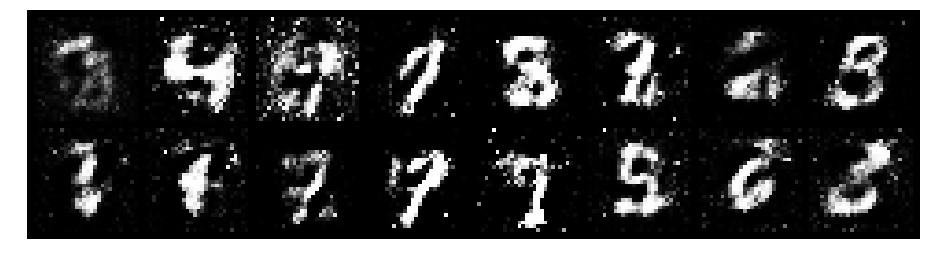

Epoch: [21/200], Batch Num: [300/600]
Discriminator Loss: 1.0120, Generator Loss: 1.6215
D(x): 0.7226, D(G(z)): 0.3496


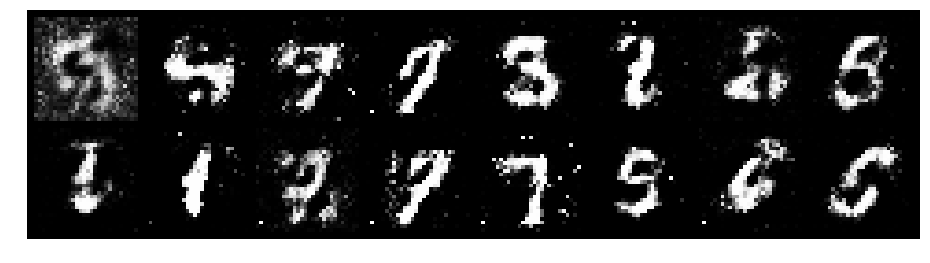

Epoch: [21/200], Batch Num: [400/600]
Discriminator Loss: 0.7427, Generator Loss: 1.6613
D(x): 0.7361, D(G(z)): 0.2232


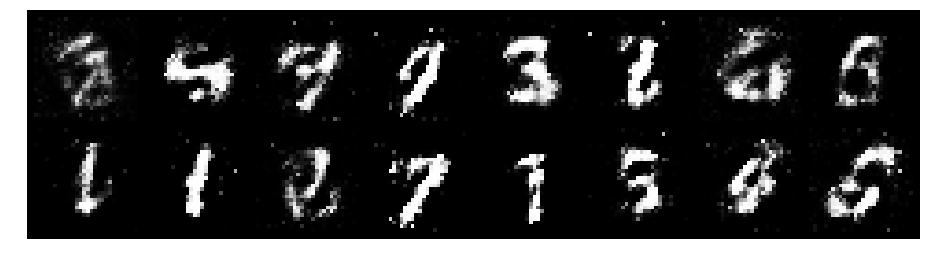

Epoch: [21/200], Batch Num: [500/600]
Discriminator Loss: 0.9225, Generator Loss: 1.5705
D(x): 0.7023, D(G(z)): 0.3029


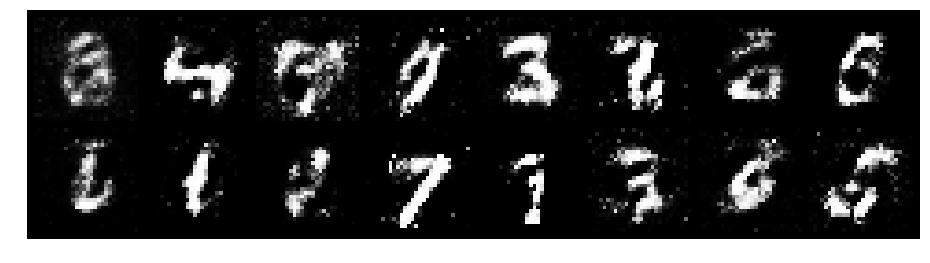

Epoch: [22/200], Batch Num: [0/600]
Discriminator Loss: 0.8452, Generator Loss: 2.1142
D(x): 0.7369, D(G(z)): 0.2711


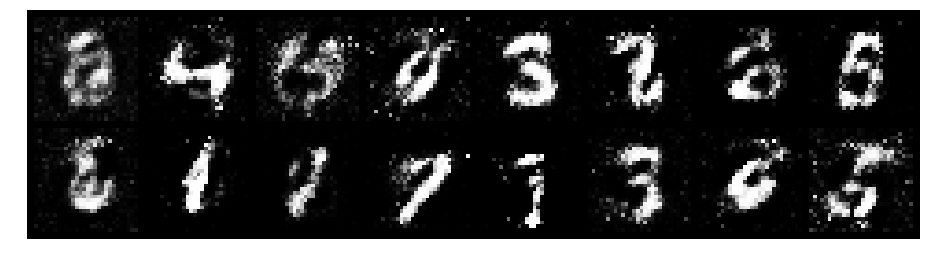

Epoch: [22/200], Batch Num: [100/600]
Discriminator Loss: 0.8109, Generator Loss: 1.7049
D(x): 0.6983, D(G(z)): 0.2355


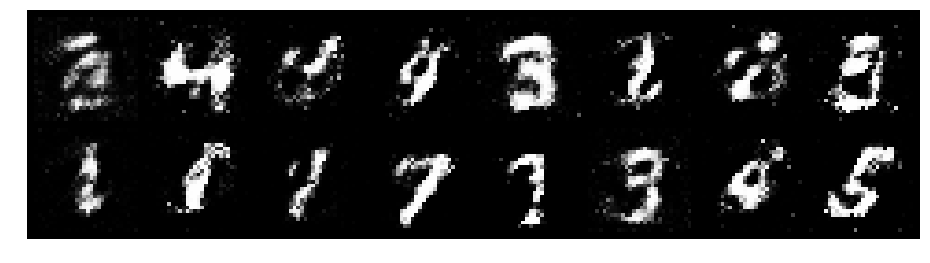

Epoch: [22/200], Batch Num: [200/600]
Discriminator Loss: 0.8705, Generator Loss: 1.8486
D(x): 0.6698, D(G(z)): 0.2314


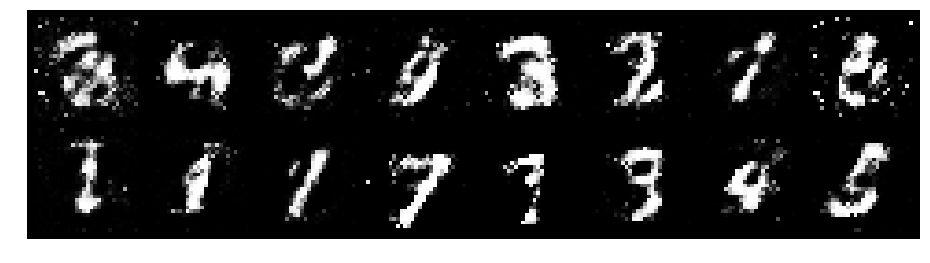

Epoch: [22/200], Batch Num: [300/600]
Discriminator Loss: 0.7845, Generator Loss: 1.9386
D(x): 0.7140, D(G(z)): 0.2222


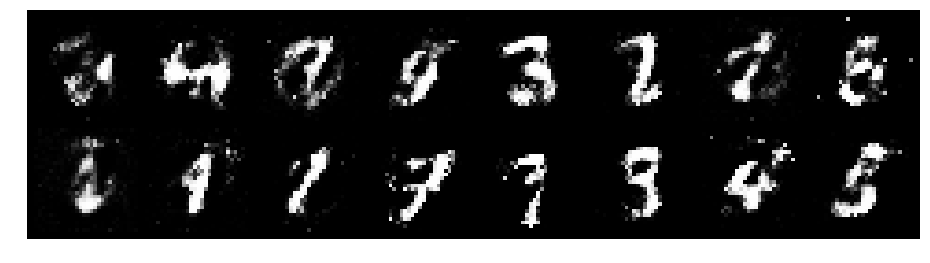

Epoch: [22/200], Batch Num: [400/600]
Discriminator Loss: 0.7877, Generator Loss: 1.9792
D(x): 0.7813, D(G(z)): 0.2872


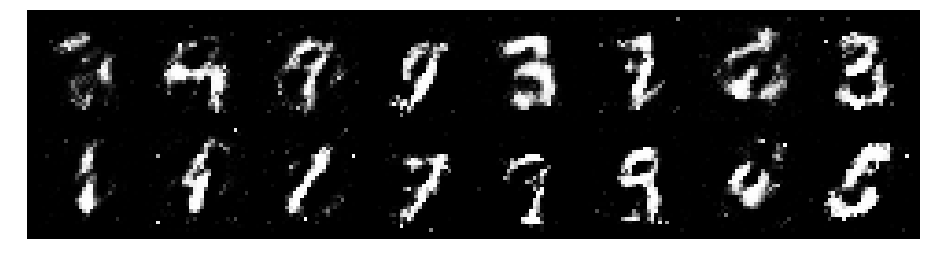

Epoch: [22/200], Batch Num: [500/600]
Discriminator Loss: 0.8066, Generator Loss: 2.2333
D(x): 0.7521, D(G(z)): 0.2698


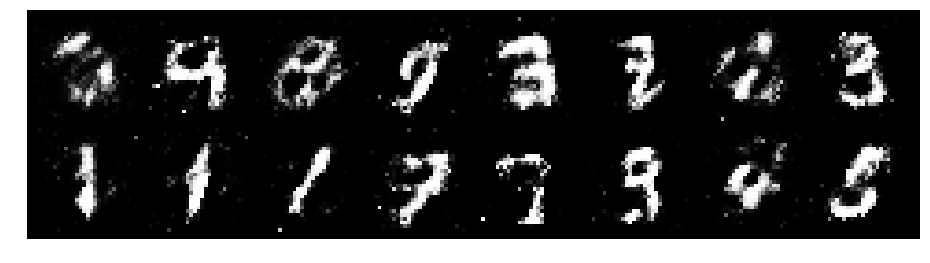

Epoch: [23/200], Batch Num: [0/600]
Discriminator Loss: 0.8247, Generator Loss: 1.8042
D(x): 0.7949, D(G(z)): 0.3113


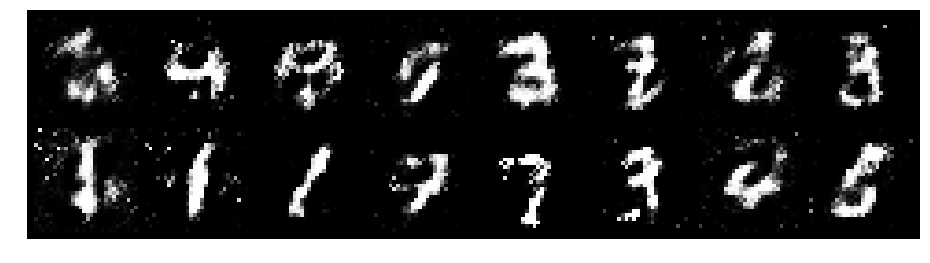

Epoch: [23/200], Batch Num: [100/600]
Discriminator Loss: 0.7216, Generator Loss: 2.0107
D(x): 0.7014, D(G(z)): 0.2181


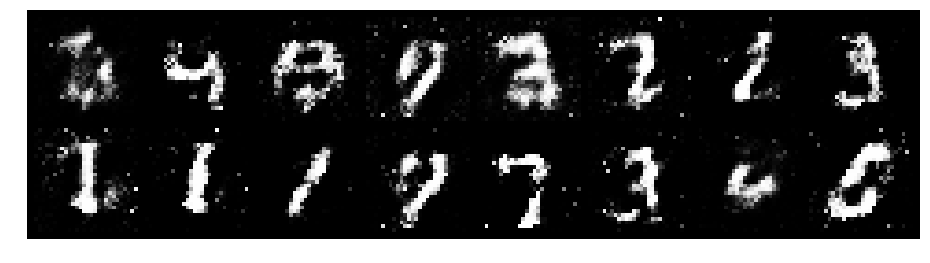

Epoch: [23/200], Batch Num: [200/600]
Discriminator Loss: 0.7034, Generator Loss: 1.8892
D(x): 0.7393, D(G(z)): 0.2416


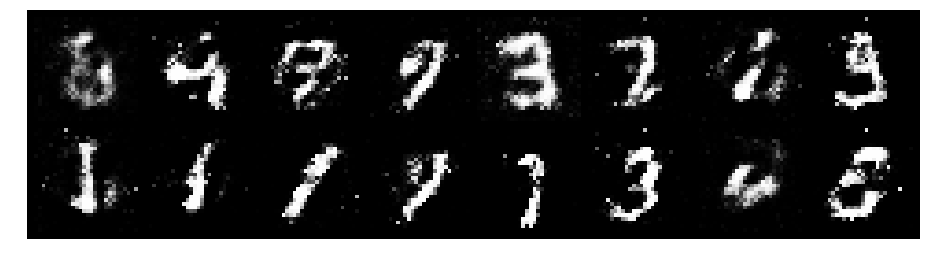

Epoch: [23/200], Batch Num: [300/600]
Discriminator Loss: 0.6830, Generator Loss: 1.8192
D(x): 0.7235, D(G(z)): 0.2017


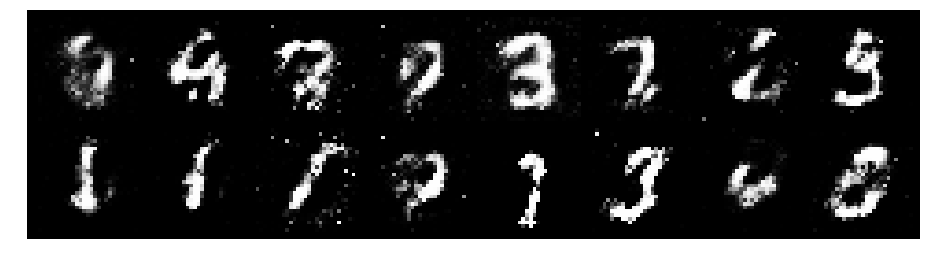

Epoch: [23/200], Batch Num: [400/600]
Discriminator Loss: 0.6734, Generator Loss: 1.7256
D(x): 0.7972, D(G(z)): 0.2565


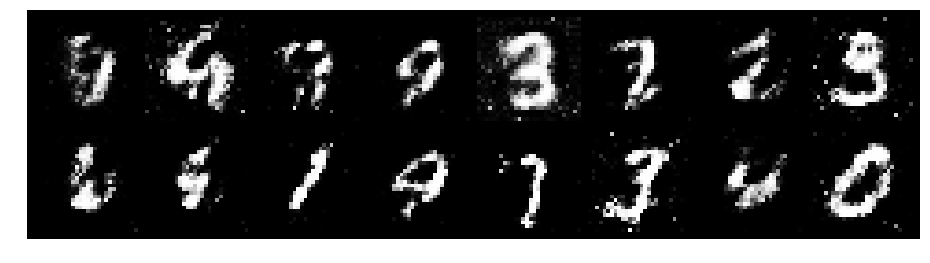

Epoch: [23/200], Batch Num: [500/600]
Discriminator Loss: 1.2502, Generator Loss: 1.2434
D(x): 0.5340, D(G(z)): 0.2850


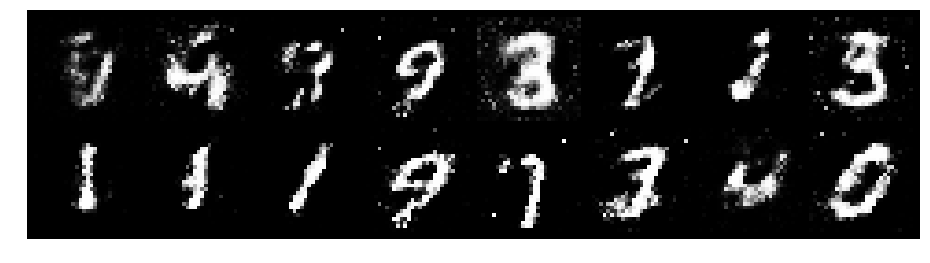

Epoch: [24/200], Batch Num: [0/600]
Discriminator Loss: 0.8781, Generator Loss: 1.4825
D(x): 0.6816, D(G(z)): 0.3039


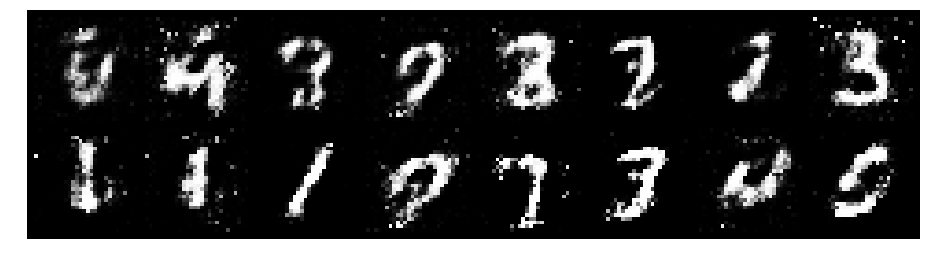

Epoch: [24/200], Batch Num: [100/600]
Discriminator Loss: 0.7683, Generator Loss: 1.7037
D(x): 0.7458, D(G(z)): 0.2793


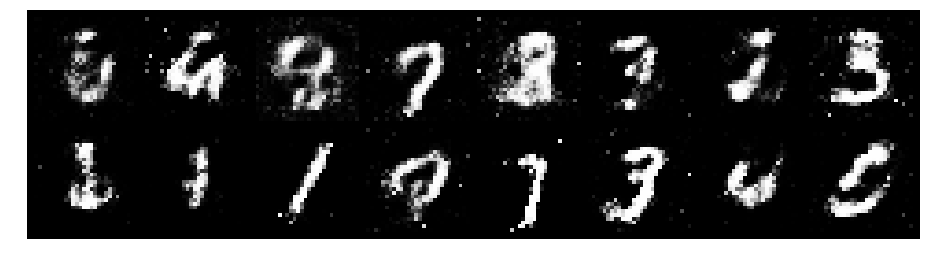

Epoch: [24/200], Batch Num: [200/600]
Discriminator Loss: 1.0599, Generator Loss: 1.2238
D(x): 0.6698, D(G(z)): 0.3080


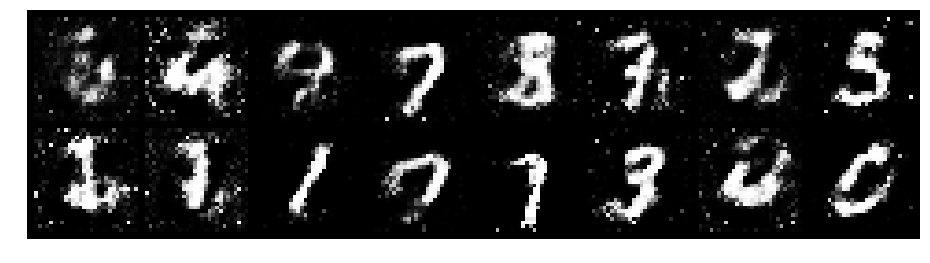

Epoch: [24/200], Batch Num: [300/600]
Discriminator Loss: 1.0848, Generator Loss: 1.4965
D(x): 0.6313, D(G(z)): 0.3009


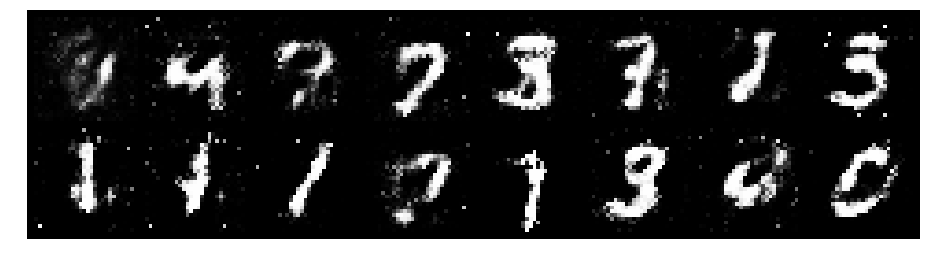

Epoch: [24/200], Batch Num: [400/600]
Discriminator Loss: 0.8849, Generator Loss: 1.8487
D(x): 0.7029, D(G(z)): 0.2838


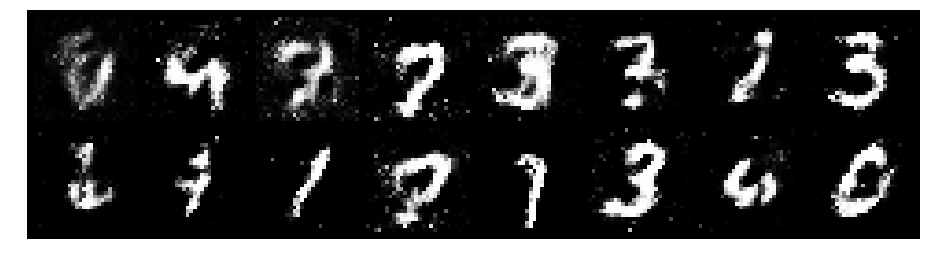

Epoch: [24/200], Batch Num: [500/600]
Discriminator Loss: 1.0205, Generator Loss: 1.4993
D(x): 0.6826, D(G(z)): 0.3537


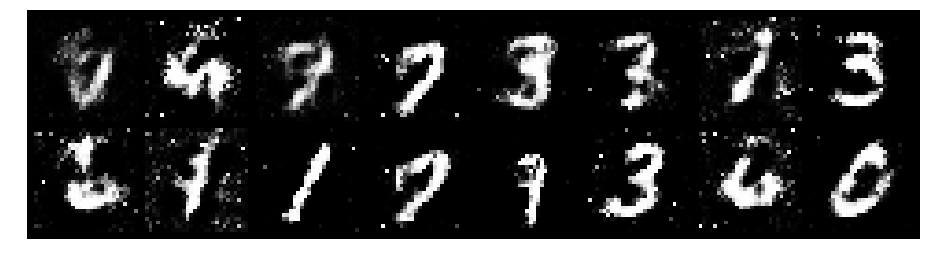

Epoch: [25/200], Batch Num: [0/600]
Discriminator Loss: 0.9810, Generator Loss: 1.4894
D(x): 0.6686, D(G(z)): 0.3393


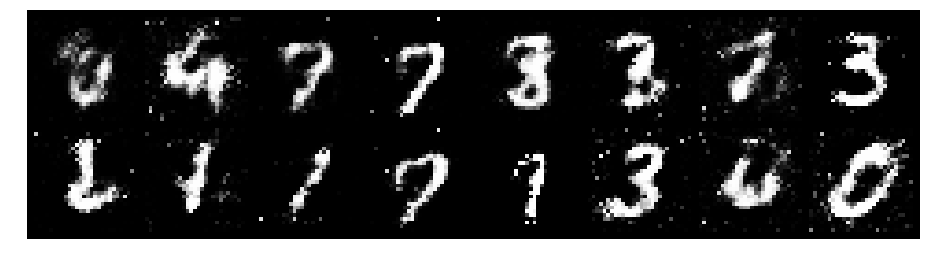

Epoch: [25/200], Batch Num: [100/600]
Discriminator Loss: 1.3447, Generator Loss: 1.2901
D(x): 0.6954, D(G(z)): 0.4824


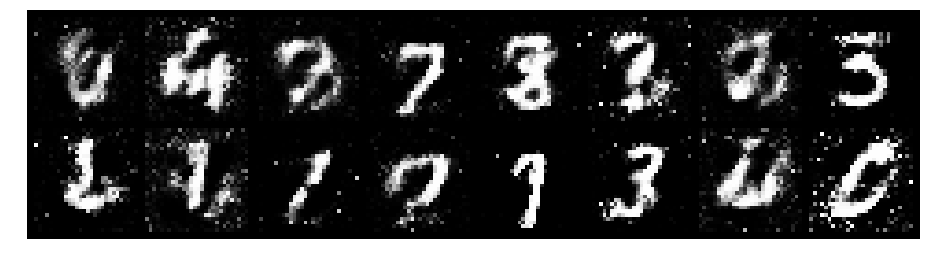

Epoch: [25/200], Batch Num: [200/600]
Discriminator Loss: 1.2147, Generator Loss: 1.2599
D(x): 0.6409, D(G(z)): 0.4120


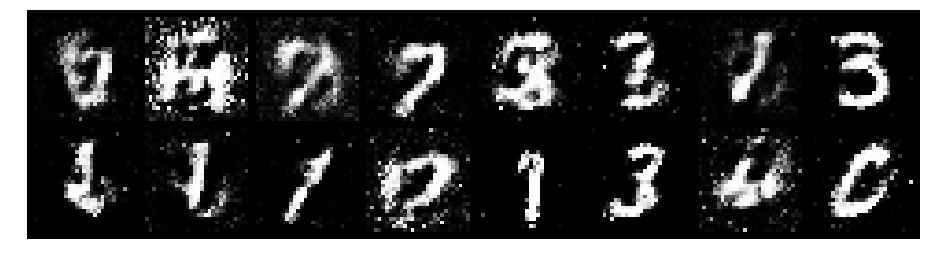

Epoch: [25/200], Batch Num: [300/600]
Discriminator Loss: 1.0036, Generator Loss: 1.3356
D(x): 0.6874, D(G(z)): 0.3465


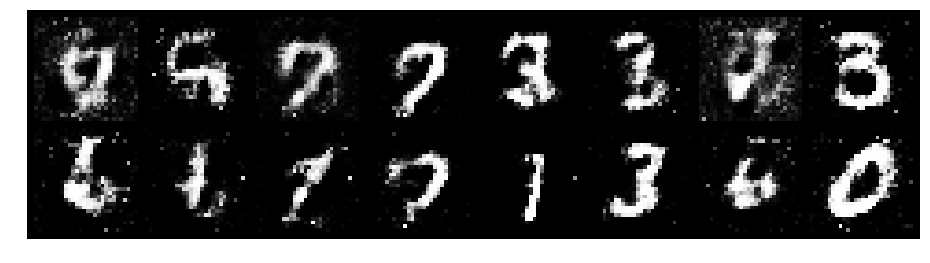

Epoch: [25/200], Batch Num: [400/600]
Discriminator Loss: 0.9475, Generator Loss: 1.2451
D(x): 0.7053, D(G(z)): 0.3532


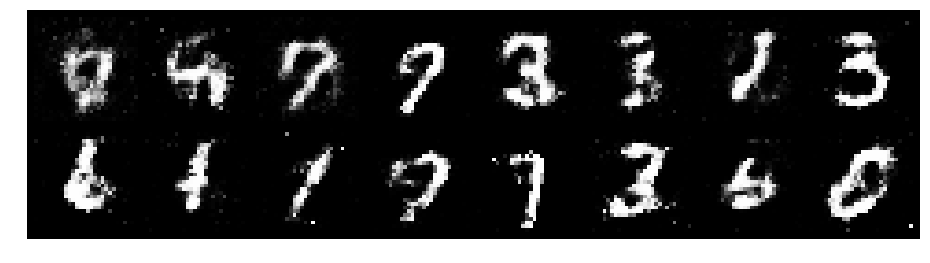

Epoch: [25/200], Batch Num: [500/600]
Discriminator Loss: 0.9607, Generator Loss: 1.5350
D(x): 0.6970, D(G(z)): 0.3356


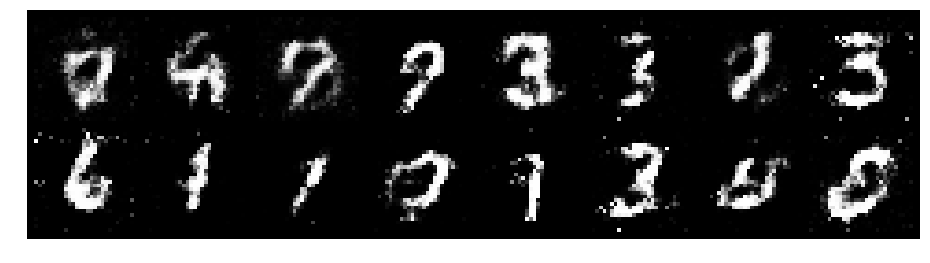

Epoch: [26/200], Batch Num: [0/600]
Discriminator Loss: 0.9990, Generator Loss: 1.2154
D(x): 0.6830, D(G(z)): 0.3591


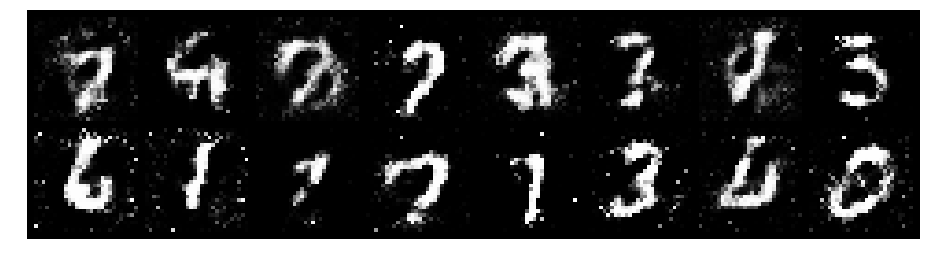

Epoch: [26/200], Batch Num: [100/600]
Discriminator Loss: 0.9945, Generator Loss: 1.1929
D(x): 0.6613, D(G(z)): 0.3210


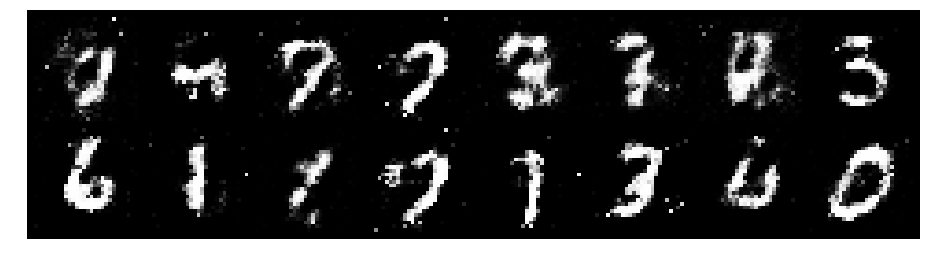

Epoch: [26/200], Batch Num: [200/600]
Discriminator Loss: 0.8987, Generator Loss: 1.3916
D(x): 0.6909, D(G(z)): 0.2887


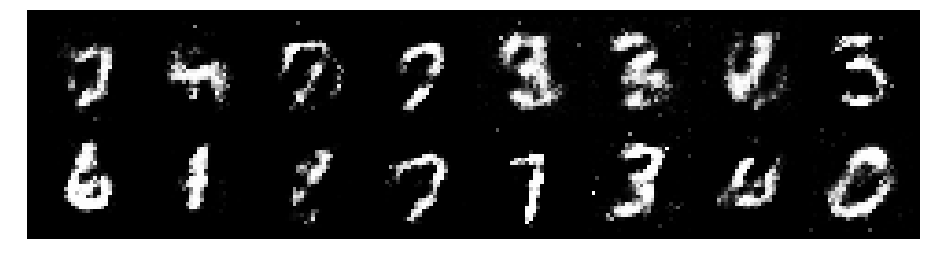

Epoch: [26/200], Batch Num: [300/600]
Discriminator Loss: 1.1276, Generator Loss: 1.2341
D(x): 0.7449, D(G(z)): 0.4179


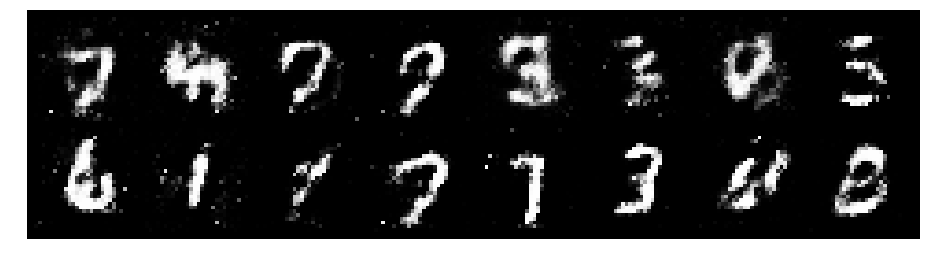

Epoch: [26/200], Batch Num: [400/600]
Discriminator Loss: 1.0514, Generator Loss: 1.3240
D(x): 0.6370, D(G(z)): 0.3427


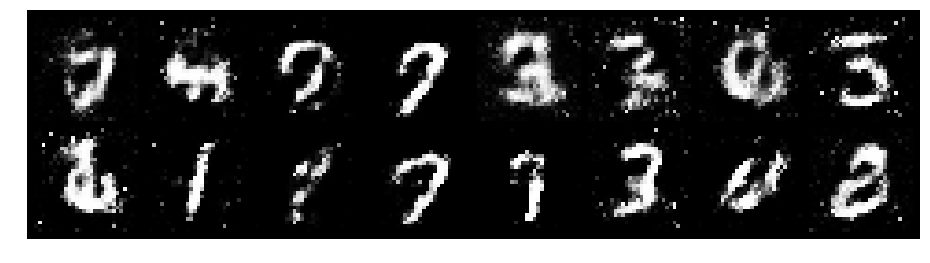

Epoch: [26/200], Batch Num: [500/600]
Discriminator Loss: 1.0112, Generator Loss: 1.3485
D(x): 0.6318, D(G(z)): 0.3467


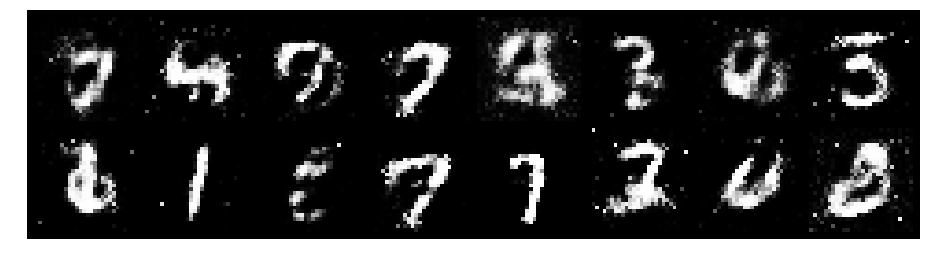

Epoch: [27/200], Batch Num: [0/600]
Discriminator Loss: 0.9465, Generator Loss: 1.2676
D(x): 0.6820, D(G(z)): 0.3249


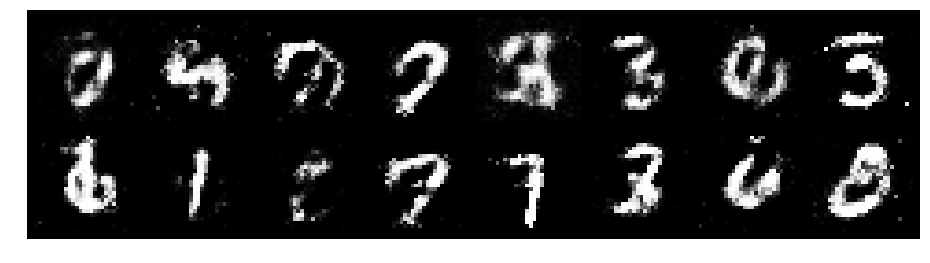

Epoch: [27/200], Batch Num: [100/600]
Discriminator Loss: 1.0975, Generator Loss: 1.5644
D(x): 0.7121, D(G(z)): 0.3871


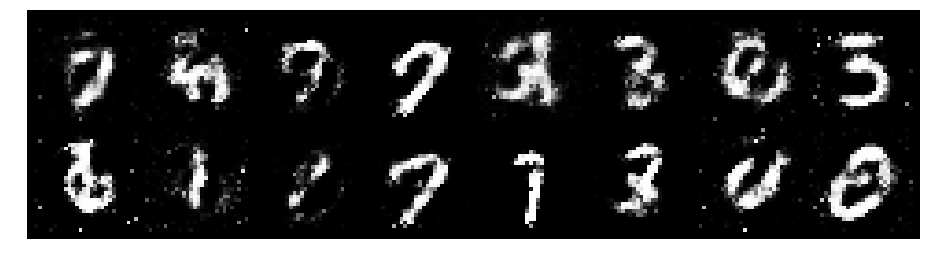

Epoch: [27/200], Batch Num: [200/600]
Discriminator Loss: 1.2039, Generator Loss: 1.4317
D(x): 0.6356, D(G(z)): 0.3541


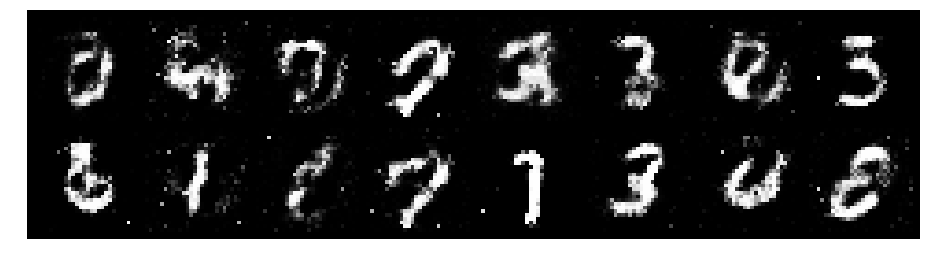

Epoch: [27/200], Batch Num: [300/600]
Discriminator Loss: 0.9670, Generator Loss: 1.0909
D(x): 0.7290, D(G(z)): 0.3934


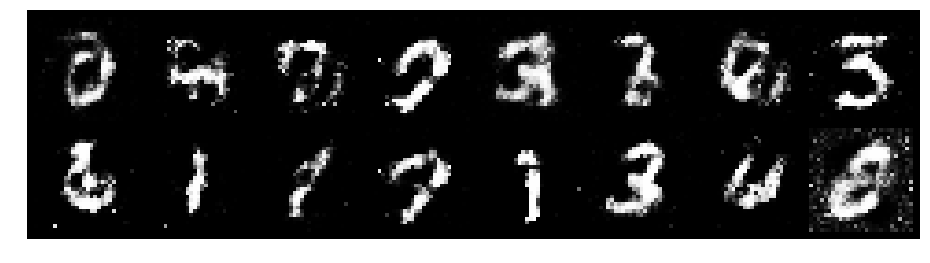

Epoch: [27/200], Batch Num: [400/600]
Discriminator Loss: 1.0281, Generator Loss: 1.5471
D(x): 0.7210, D(G(z)): 0.3640


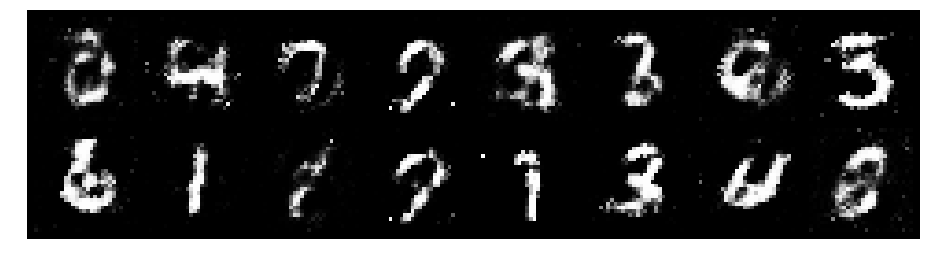

Epoch: [27/200], Batch Num: [500/600]
Discriminator Loss: 1.2684, Generator Loss: 1.2154
D(x): 0.5507, D(G(z)): 0.3376


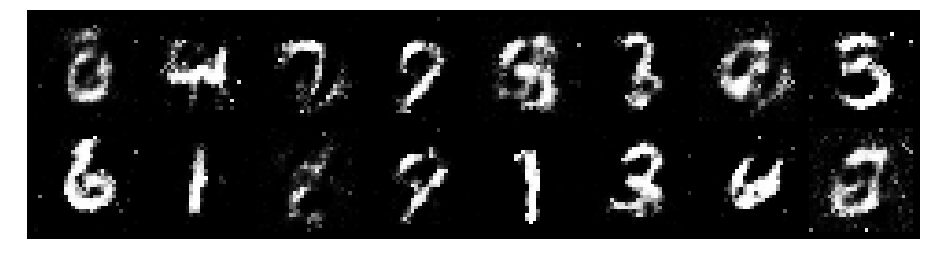

Epoch: [28/200], Batch Num: [0/600]
Discriminator Loss: 1.1893, Generator Loss: 0.8407
D(x): 0.6522, D(G(z)): 0.4457


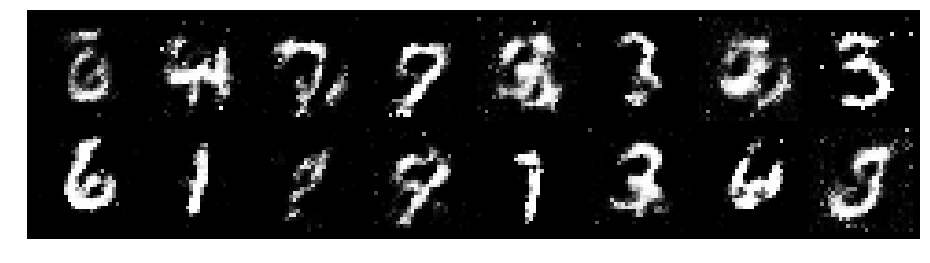

Epoch: [28/200], Batch Num: [100/600]
Discriminator Loss: 1.0888, Generator Loss: 1.1793
D(x): 0.5917, D(G(z)): 0.3460


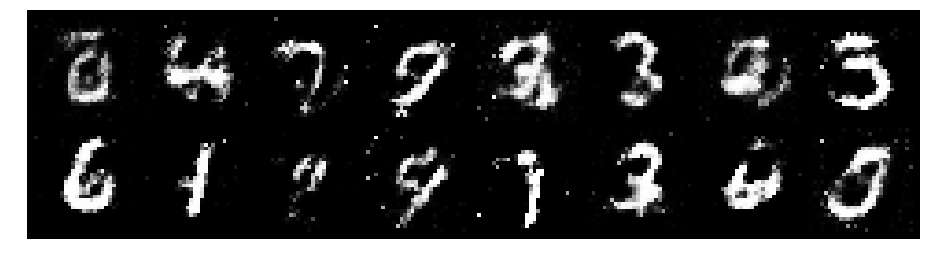

Epoch: [28/200], Batch Num: [200/600]
Discriminator Loss: 1.0595, Generator Loss: 1.4370
D(x): 0.5974, D(G(z)): 0.3029


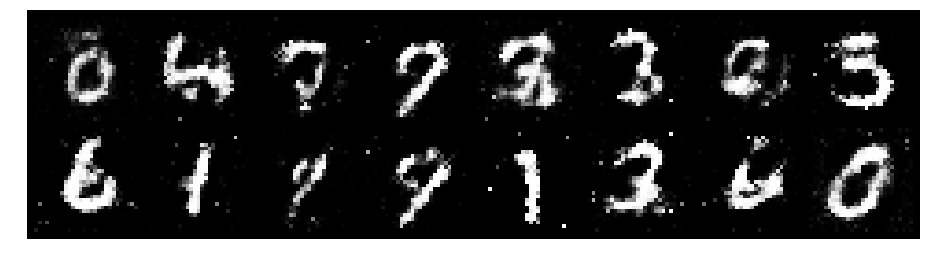

Epoch: [28/200], Batch Num: [300/600]
Discriminator Loss: 1.1400, Generator Loss: 1.2968
D(x): 0.7245, D(G(z)): 0.4142


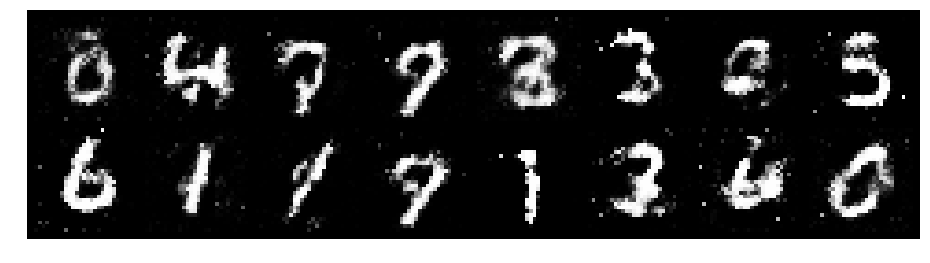

Epoch: [28/200], Batch Num: [400/600]
Discriminator Loss: 1.0966, Generator Loss: 1.0919
D(x): 0.6615, D(G(z)): 0.3485


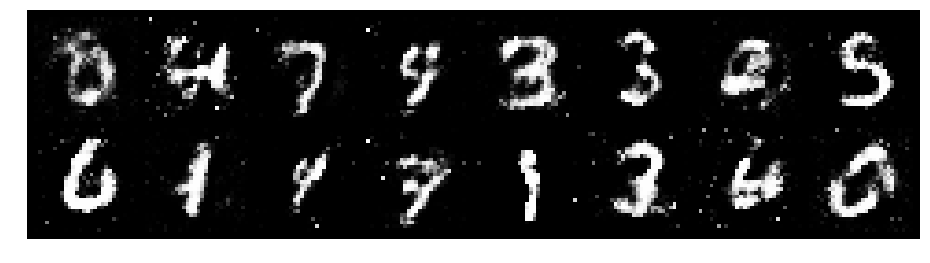

Epoch: [28/200], Batch Num: [500/600]
Discriminator Loss: 0.8226, Generator Loss: 1.4160
D(x): 0.7682, D(G(z)): 0.3354


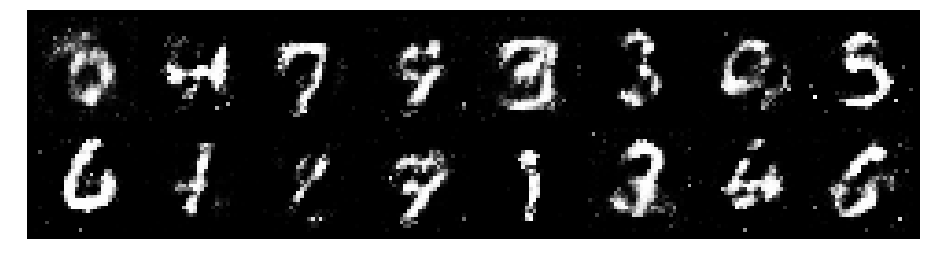

Epoch: [29/200], Batch Num: [0/600]
Discriminator Loss: 0.9487, Generator Loss: 1.5450
D(x): 0.6800, D(G(z)): 0.3136


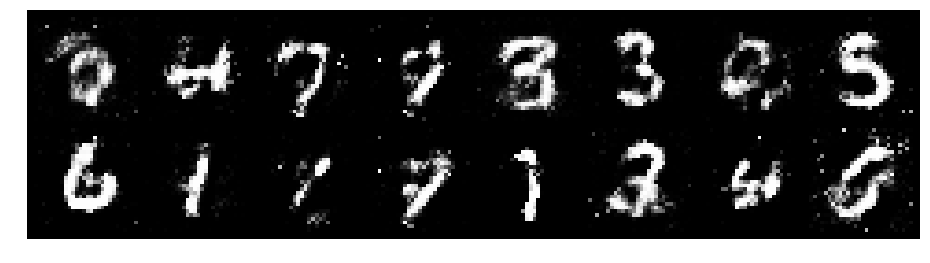

Epoch: [29/200], Batch Num: [100/600]
Discriminator Loss: 0.8825, Generator Loss: 1.5307
D(x): 0.7487, D(G(z)): 0.3352


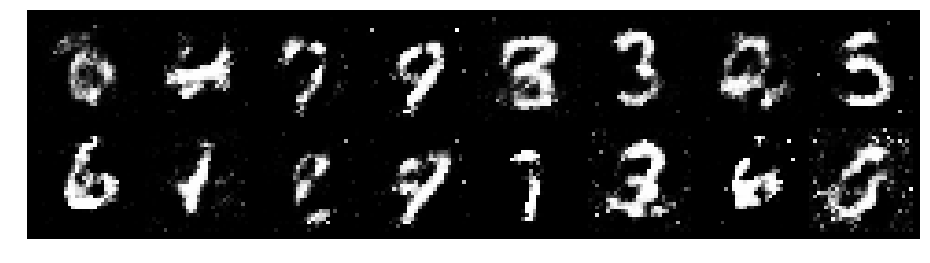

Epoch: [29/200], Batch Num: [200/600]
Discriminator Loss: 0.9643, Generator Loss: 1.3643
D(x): 0.6522, D(G(z)): 0.3082


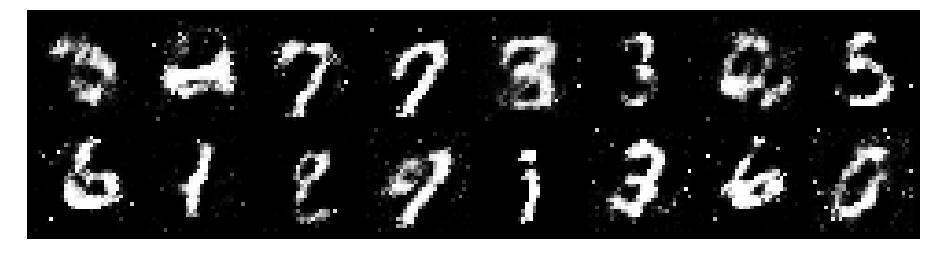

Epoch: [29/200], Batch Num: [300/600]
Discriminator Loss: 1.0361, Generator Loss: 1.9520
D(x): 0.6143, D(G(z)): 0.2542


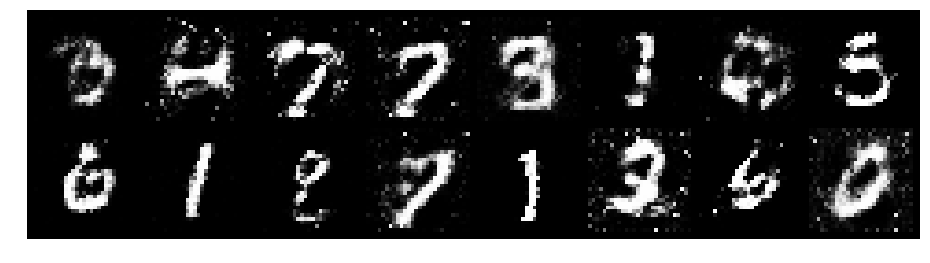

Epoch: [29/200], Batch Num: [400/600]
Discriminator Loss: 1.0026, Generator Loss: 1.7151
D(x): 0.6429, D(G(z)): 0.2980


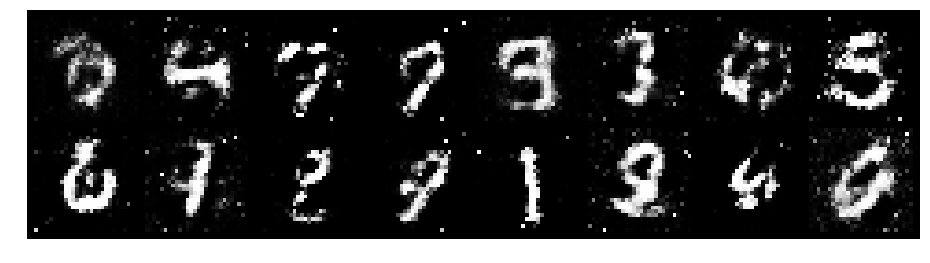

Epoch: [29/200], Batch Num: [500/600]
Discriminator Loss: 1.0231, Generator Loss: 1.2662
D(x): 0.6280, D(G(z)): 0.3413


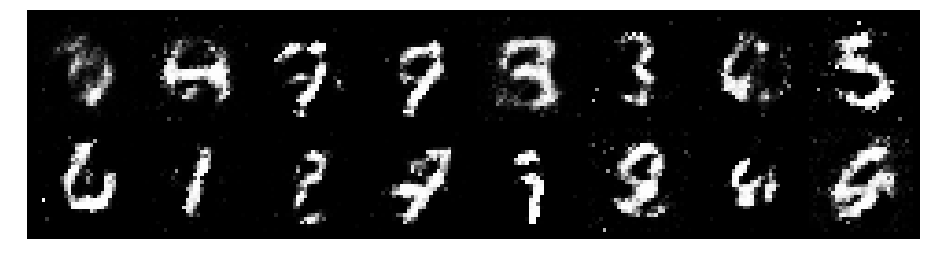

Epoch: [30/200], Batch Num: [0/600]
Discriminator Loss: 1.0385, Generator Loss: 1.2570
D(x): 0.6811, D(G(z)): 0.3809


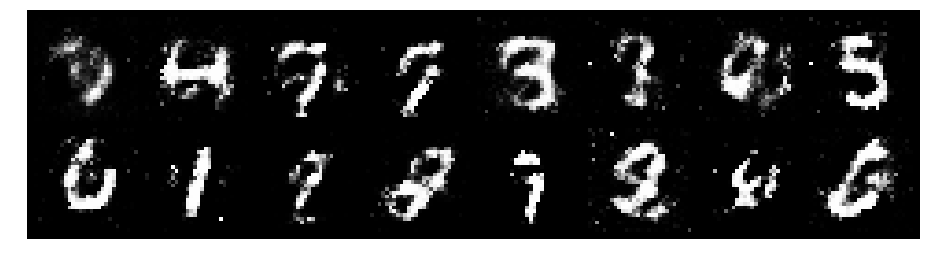

Epoch: [30/200], Batch Num: [100/600]
Discriminator Loss: 0.8147, Generator Loss: 1.9274
D(x): 0.7052, D(G(z)): 0.2507


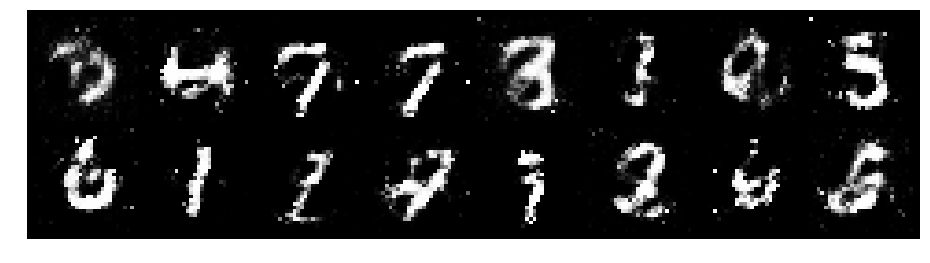

Epoch: [30/200], Batch Num: [200/600]
Discriminator Loss: 0.7781, Generator Loss: 1.8169
D(x): 0.7124, D(G(z)): 0.2609


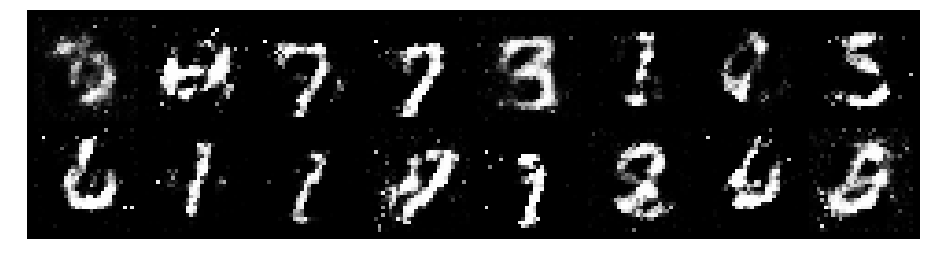

Epoch: [30/200], Batch Num: [300/600]
Discriminator Loss: 0.9175, Generator Loss: 1.3297
D(x): 0.6811, D(G(z)): 0.3076


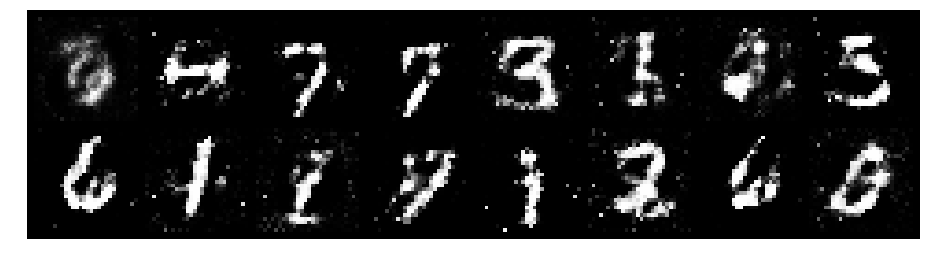

Epoch: [30/200], Batch Num: [400/600]
Discriminator Loss: 0.8462, Generator Loss: 1.8634
D(x): 0.7528, D(G(z)): 0.3370


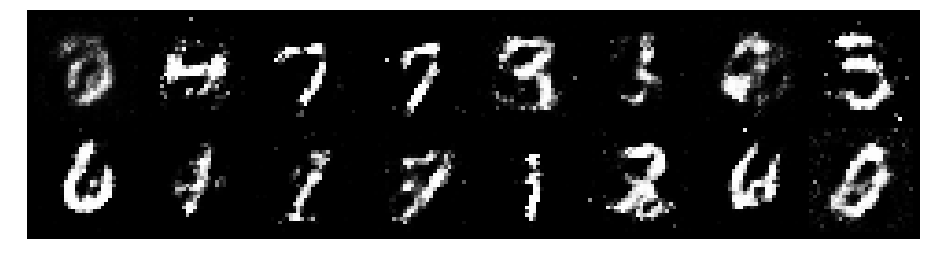

Epoch: [30/200], Batch Num: [500/600]
Discriminator Loss: 0.8440, Generator Loss: 1.7521
D(x): 0.6816, D(G(z)): 0.2293


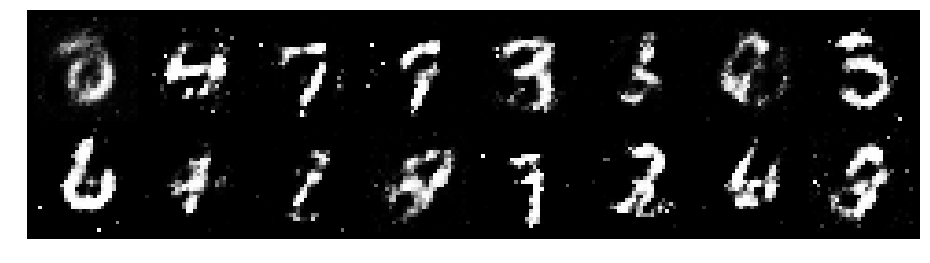

Epoch: [31/200], Batch Num: [0/600]
Discriminator Loss: 1.0813, Generator Loss: 1.5422
D(x): 0.5980, D(G(z)): 0.2896


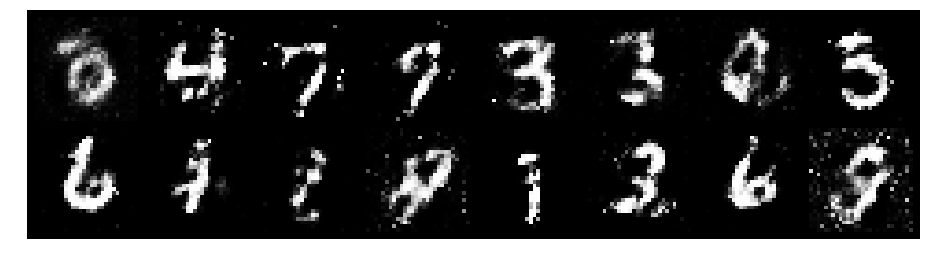

Epoch: [31/200], Batch Num: [100/600]
Discriminator Loss: 1.0784, Generator Loss: 1.2048
D(x): 0.6778, D(G(z)): 0.3874


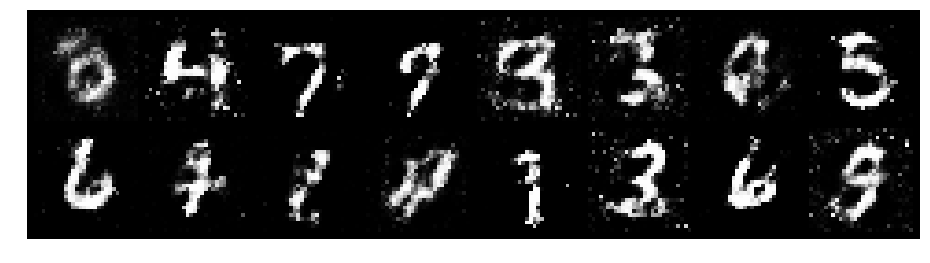

Epoch: [31/200], Batch Num: [200/600]
Discriminator Loss: 1.0716, Generator Loss: 1.0526
D(x): 0.6315, D(G(z)): 0.3580


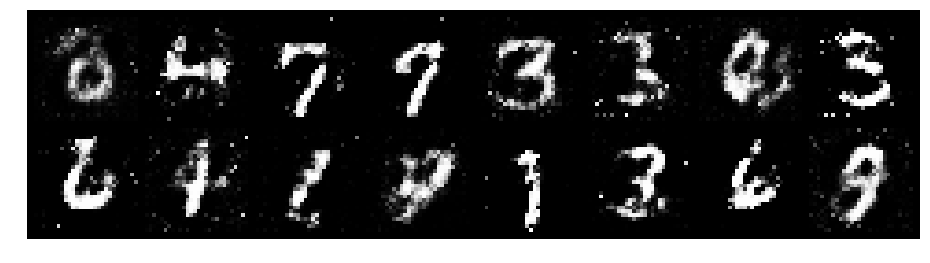

Epoch: [31/200], Batch Num: [300/600]
Discriminator Loss: 0.8706, Generator Loss: 1.3517
D(x): 0.7338, D(G(z)): 0.3655


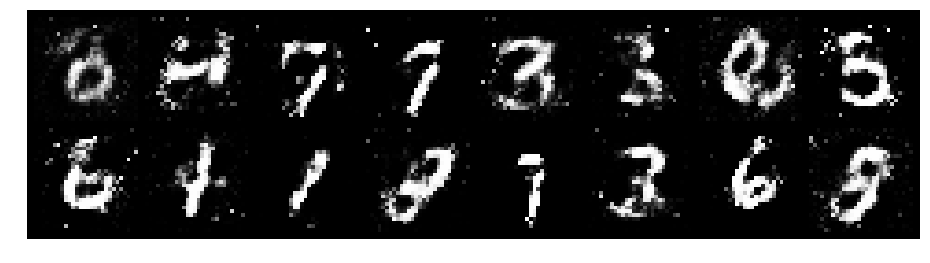

Epoch: [31/200], Batch Num: [400/600]
Discriminator Loss: 0.8405, Generator Loss: 1.6643
D(x): 0.7455, D(G(z)): 0.3220


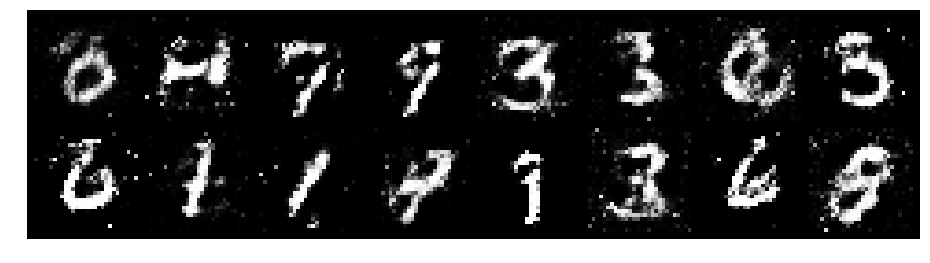

Epoch: [31/200], Batch Num: [500/600]
Discriminator Loss: 0.8663, Generator Loss: 1.4705
D(x): 0.6968, D(G(z)): 0.2843


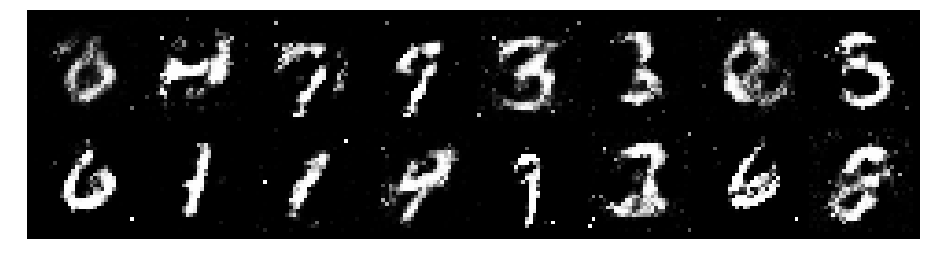

Epoch: [32/200], Batch Num: [0/600]
Discriminator Loss: 0.9533, Generator Loss: 1.6256
D(x): 0.6745, D(G(z)): 0.2954


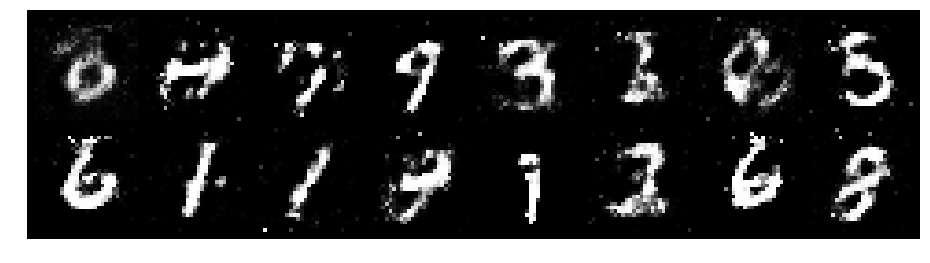

Epoch: [32/200], Batch Num: [100/600]
Discriminator Loss: 0.9042, Generator Loss: 1.2944
D(x): 0.7551, D(G(z)): 0.3745


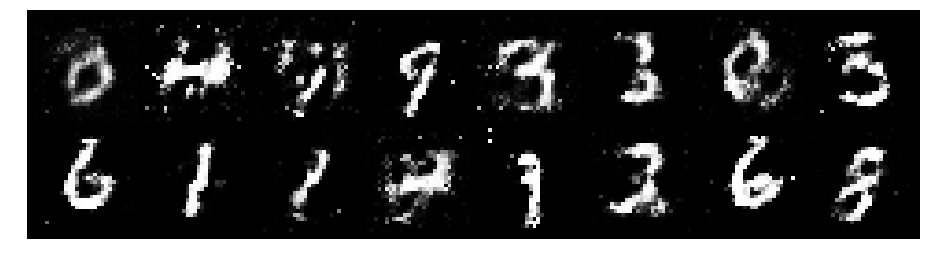

Epoch: [32/200], Batch Num: [200/600]
Discriminator Loss: 1.1109, Generator Loss: 1.1239
D(x): 0.6636, D(G(z)): 0.4030


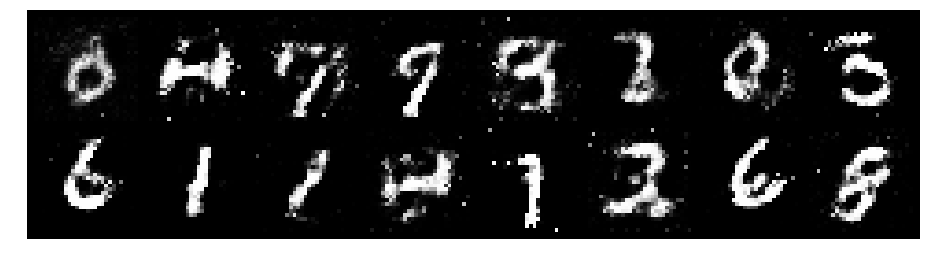

Epoch: [32/200], Batch Num: [300/600]
Discriminator Loss: 1.0786, Generator Loss: 1.4570
D(x): 0.6480, D(G(z)): 0.3787


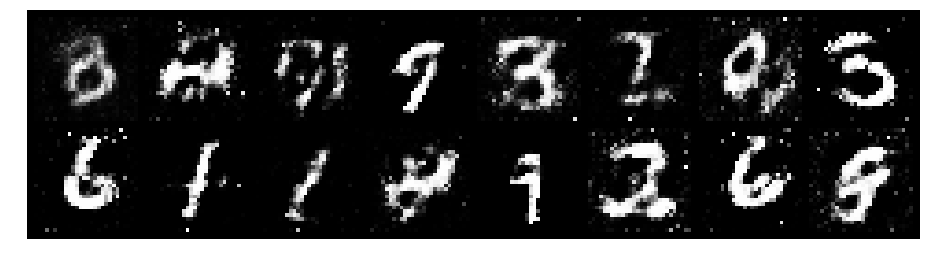

Epoch: [32/200], Batch Num: [400/600]
Discriminator Loss: 1.2927, Generator Loss: 1.2466
D(x): 0.7003, D(G(z)): 0.4133


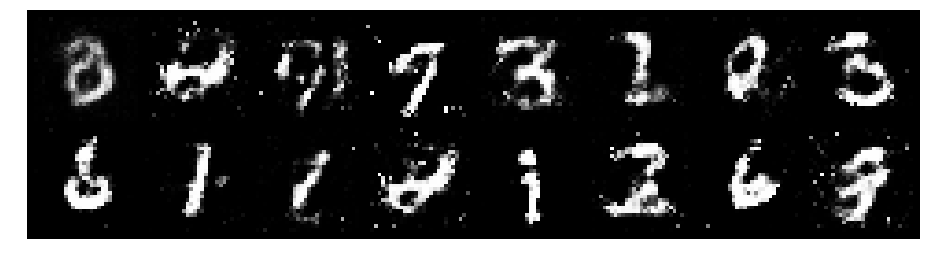

Epoch: [32/200], Batch Num: [500/600]
Discriminator Loss: 1.1431, Generator Loss: 1.1418
D(x): 0.6281, D(G(z)): 0.3986


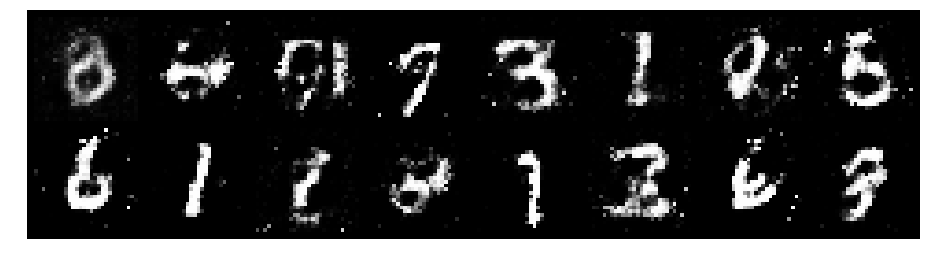

Epoch: [33/200], Batch Num: [0/600]
Discriminator Loss: 0.9461, Generator Loss: 1.1325
D(x): 0.7044, D(G(z)): 0.3704


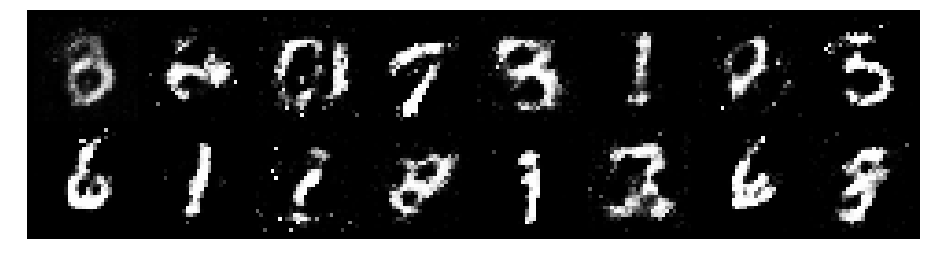

Epoch: [33/200], Batch Num: [100/600]
Discriminator Loss: 1.2089, Generator Loss: 1.1384
D(x): 0.5658, D(G(z)): 0.3225


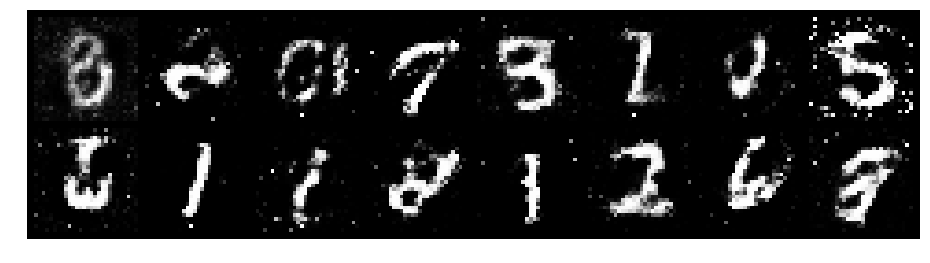

Epoch: [33/200], Batch Num: [200/600]
Discriminator Loss: 0.9947, Generator Loss: 1.1366
D(x): 0.6862, D(G(z)): 0.3684


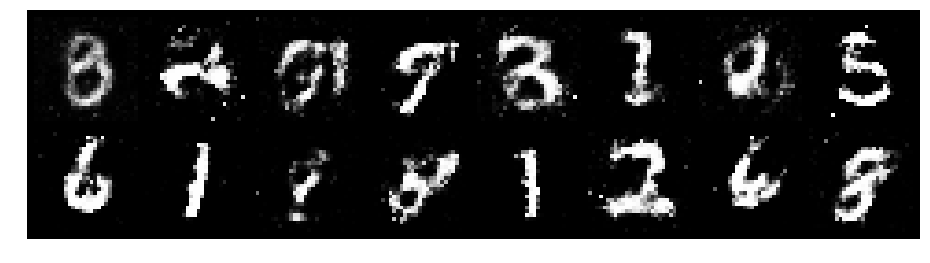

Epoch: [33/200], Batch Num: [300/600]
Discriminator Loss: 1.1539, Generator Loss: 1.2329
D(x): 0.6076, D(G(z)): 0.3783


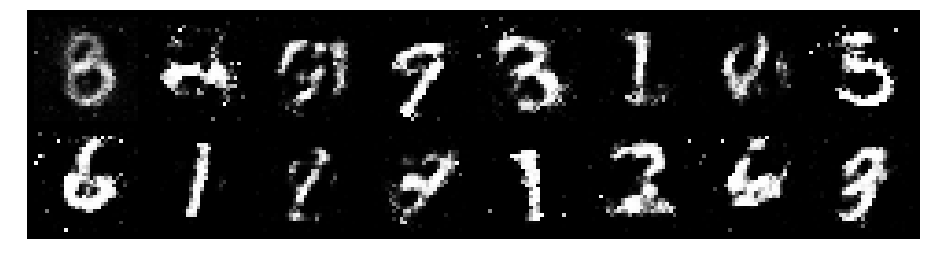

Epoch: [33/200], Batch Num: [400/600]
Discriminator Loss: 0.8891, Generator Loss: 1.2387
D(x): 0.6742, D(G(z)): 0.3089


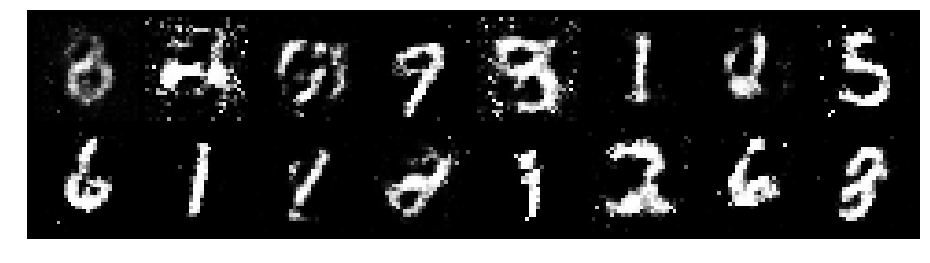

Epoch: [33/200], Batch Num: [500/600]
Discriminator Loss: 0.9317, Generator Loss: 1.8027
D(x): 0.6747, D(G(z)): 0.2904


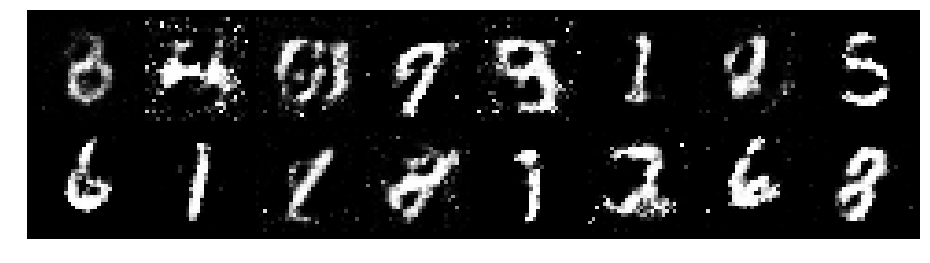

Epoch: [34/200], Batch Num: [0/600]
Discriminator Loss: 0.9333, Generator Loss: 1.6097
D(x): 0.6360, D(G(z)): 0.2702


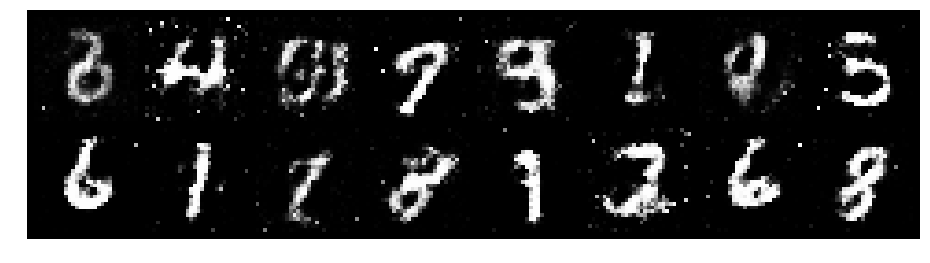

Epoch: [34/200], Batch Num: [100/600]
Discriminator Loss: 0.9880, Generator Loss: 1.5270
D(x): 0.6219, D(G(z)): 0.2981


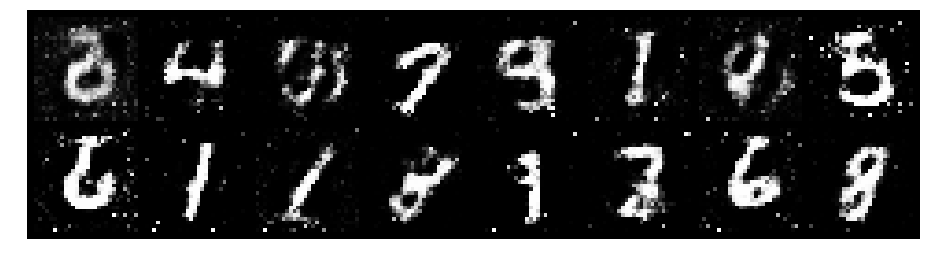

Epoch: [34/200], Batch Num: [200/600]
Discriminator Loss: 1.0055, Generator Loss: 1.4636
D(x): 0.6832, D(G(z)): 0.3468


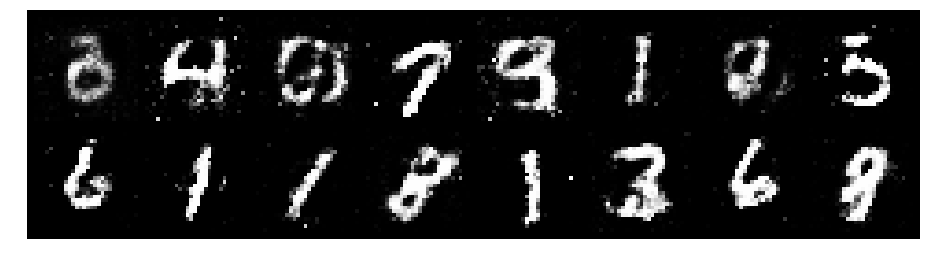

Epoch: [34/200], Batch Num: [300/600]
Discriminator Loss: 1.0375, Generator Loss: 1.2282
D(x): 0.6415, D(G(z)): 0.3617


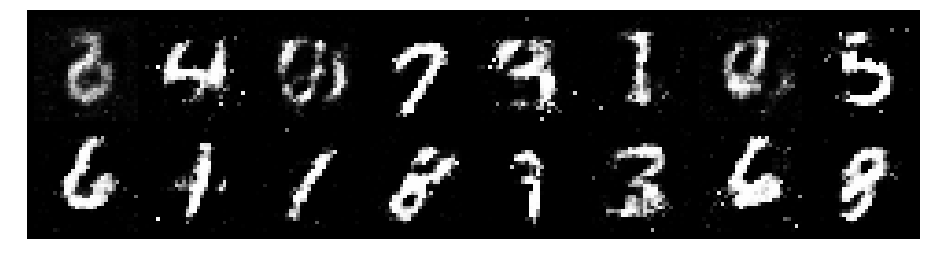

Epoch: [34/200], Batch Num: [400/600]
Discriminator Loss: 1.0380, Generator Loss: 1.2669
D(x): 0.6333, D(G(z)): 0.3408


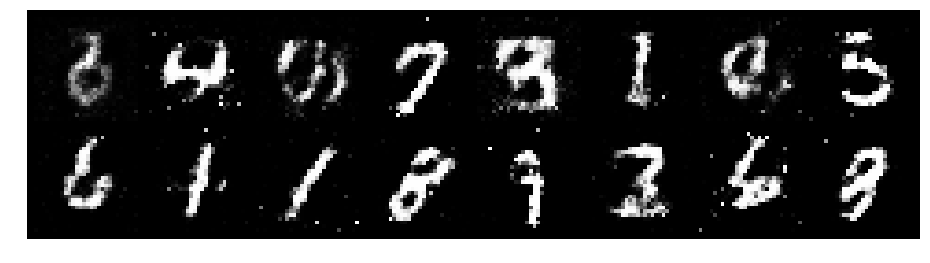

Epoch: [34/200], Batch Num: [500/600]
Discriminator Loss: 0.9173, Generator Loss: 1.3399
D(x): 0.6690, D(G(z)): 0.3021


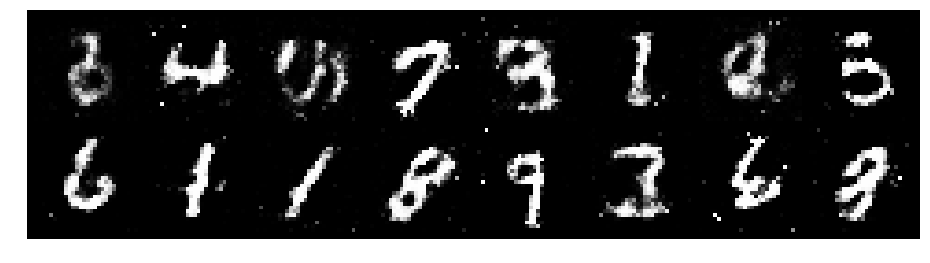

Epoch: [35/200], Batch Num: [0/600]
Discriminator Loss: 0.9446, Generator Loss: 1.4231
D(x): 0.6902, D(G(z)): 0.3394


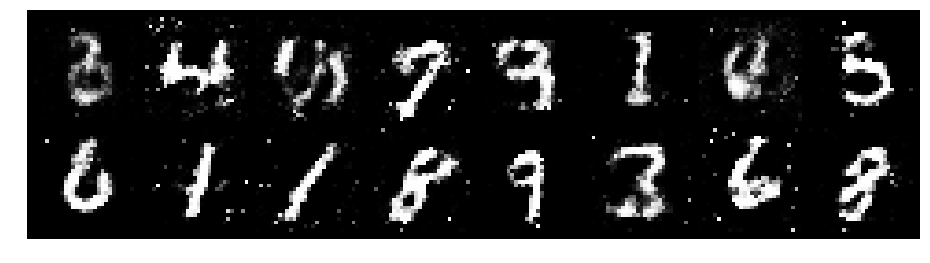

Epoch: [35/200], Batch Num: [100/600]
Discriminator Loss: 1.0141, Generator Loss: 1.4794
D(x): 0.6610, D(G(z)): 0.3201


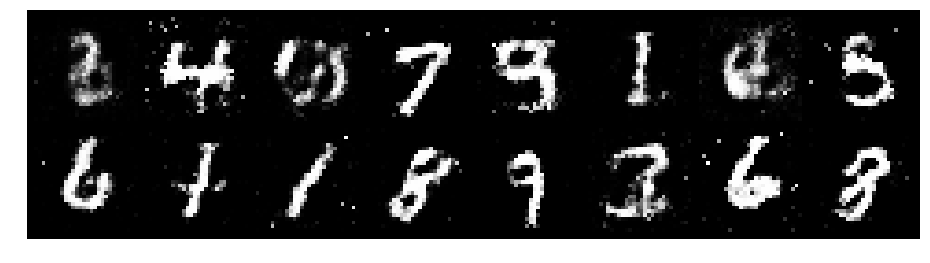

Epoch: [35/200], Batch Num: [200/600]
Discriminator Loss: 1.0139, Generator Loss: 1.3805
D(x): 0.6413, D(G(z)): 0.3194


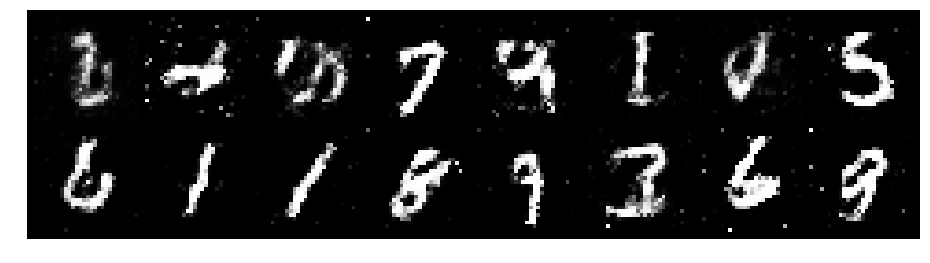

Epoch: [35/200], Batch Num: [300/600]
Discriminator Loss: 0.9857, Generator Loss: 1.2532
D(x): 0.6833, D(G(z)): 0.3666


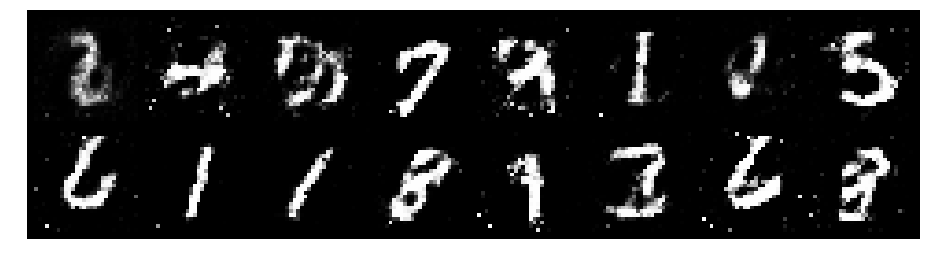

Epoch: [35/200], Batch Num: [400/600]
Discriminator Loss: 1.0734, Generator Loss: 1.0065
D(x): 0.6805, D(G(z)): 0.4283


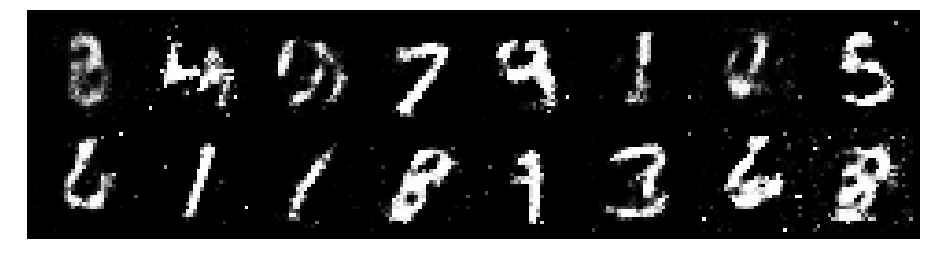

Epoch: [35/200], Batch Num: [500/600]
Discriminator Loss: 0.9060, Generator Loss: 1.4769
D(x): 0.6891, D(G(z)): 0.3348


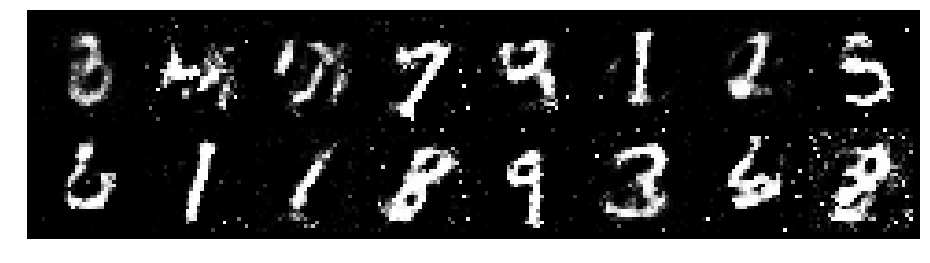

Epoch: [36/200], Batch Num: [0/600]
Discriminator Loss: 1.2589, Generator Loss: 1.2521
D(x): 0.6295, D(G(z)): 0.4098


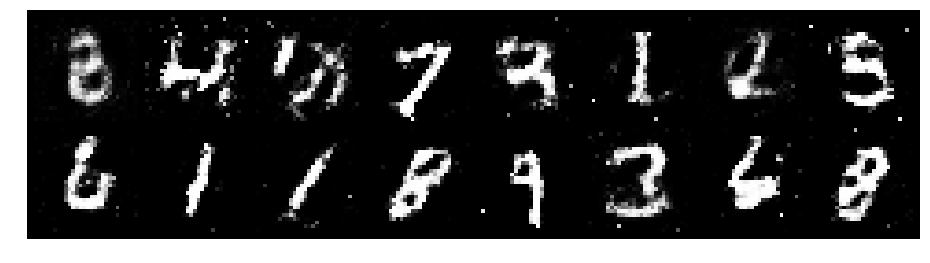

Epoch: [36/200], Batch Num: [100/600]
Discriminator Loss: 1.0917, Generator Loss: 1.2907
D(x): 0.6412, D(G(z)): 0.3657


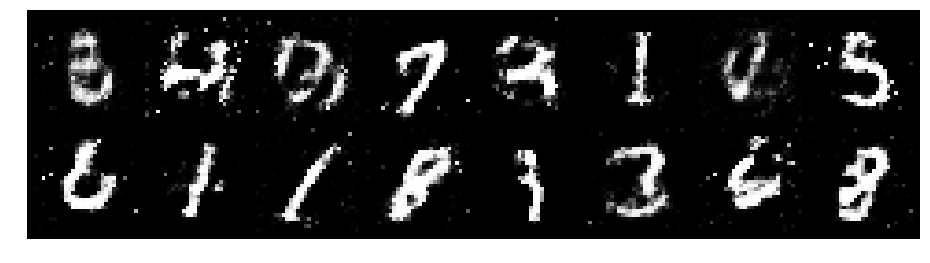

Epoch: [36/200], Batch Num: [200/600]
Discriminator Loss: 1.1539, Generator Loss: 0.9885
D(x): 0.6837, D(G(z)): 0.4285


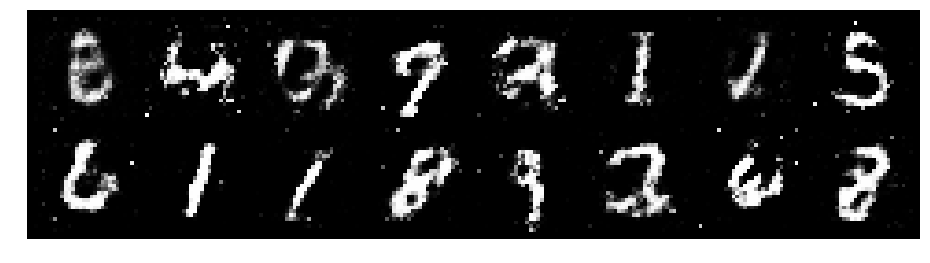

Epoch: [36/200], Batch Num: [300/600]
Discriminator Loss: 0.9715, Generator Loss: 1.3638
D(x): 0.6933, D(G(z)): 0.3312


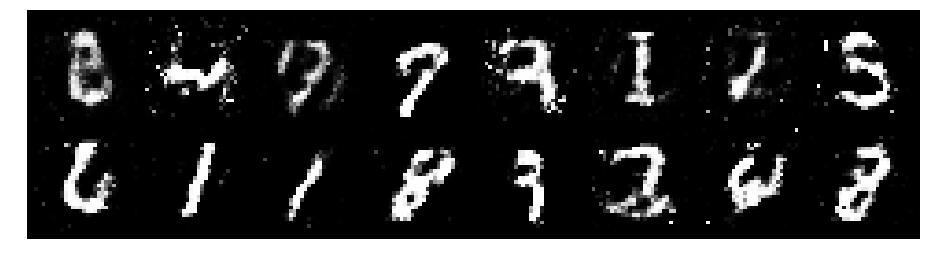

Epoch: [36/200], Batch Num: [400/600]
Discriminator Loss: 0.9321, Generator Loss: 1.3371
D(x): 0.7035, D(G(z)): 0.3155


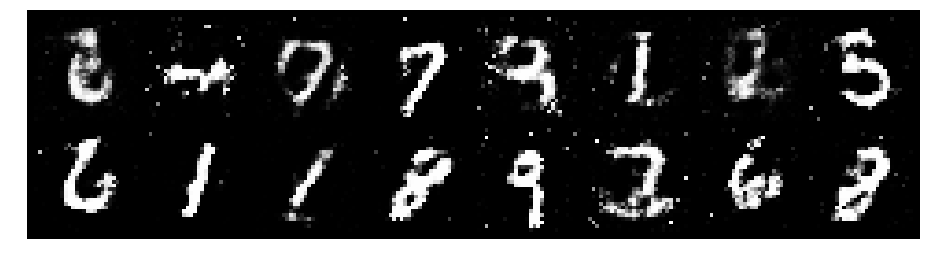

Epoch: [36/200], Batch Num: [500/600]
Discriminator Loss: 0.9817, Generator Loss: 1.2891
D(x): 0.6663, D(G(z)): 0.3601


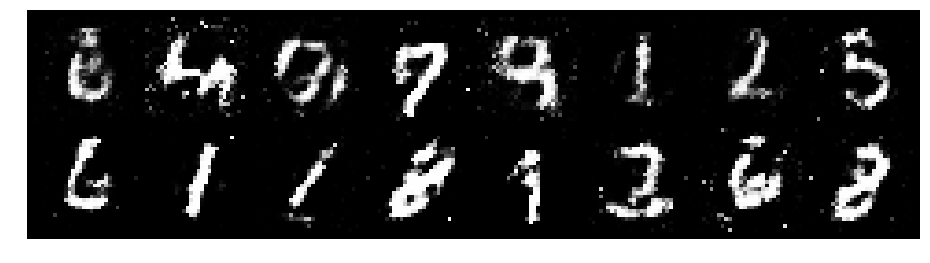

Epoch: [37/200], Batch Num: [0/600]
Discriminator Loss: 0.9538, Generator Loss: 1.3386
D(x): 0.6649, D(G(z)): 0.3243


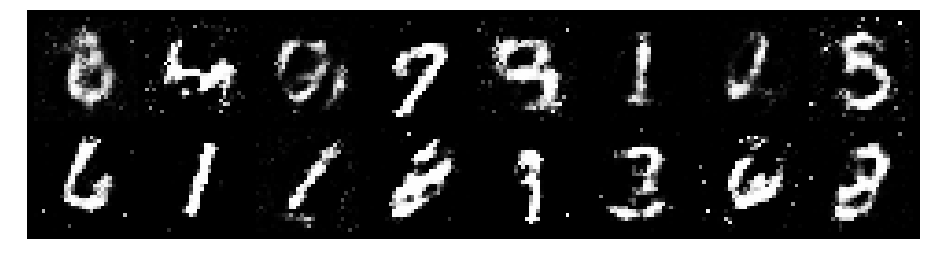

Epoch: [37/200], Batch Num: [100/600]
Discriminator Loss: 1.0559, Generator Loss: 1.3338
D(x): 0.6213, D(G(z)): 0.3342


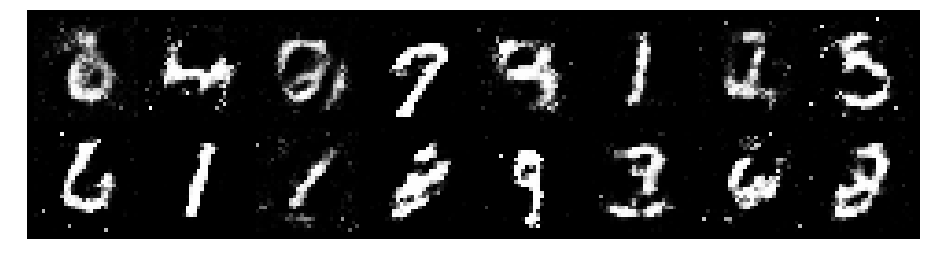

Epoch: [37/200], Batch Num: [200/600]
Discriminator Loss: 1.0727, Generator Loss: 1.2567
D(x): 0.6399, D(G(z)): 0.3721


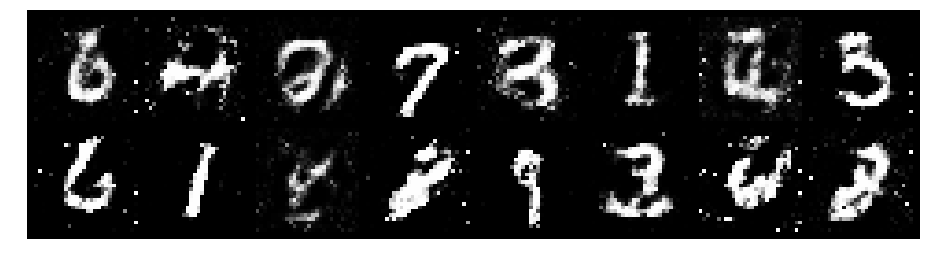

Epoch: [37/200], Batch Num: [300/600]
Discriminator Loss: 0.9768, Generator Loss: 1.2772
D(x): 0.6275, D(G(z)): 0.3281


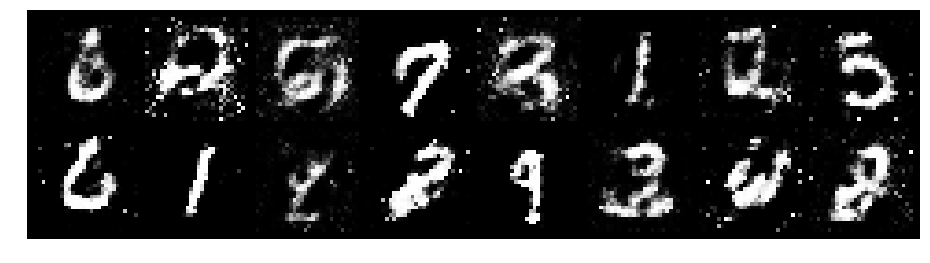

Epoch: [37/200], Batch Num: [400/600]
Discriminator Loss: 1.2706, Generator Loss: 1.2119
D(x): 0.5942, D(G(z)): 0.4135


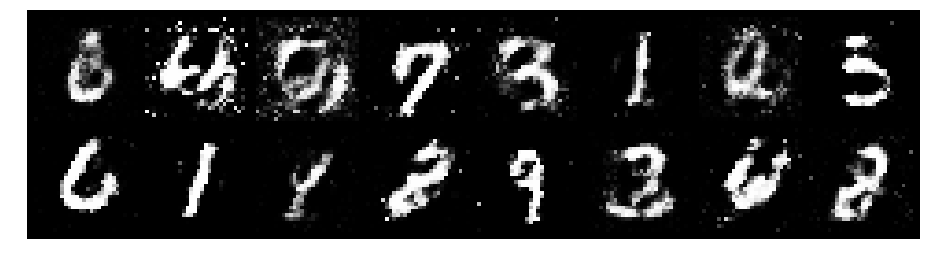

Epoch: [37/200], Batch Num: [500/600]
Discriminator Loss: 1.1409, Generator Loss: 0.9933
D(x): 0.7087, D(G(z)): 0.4520


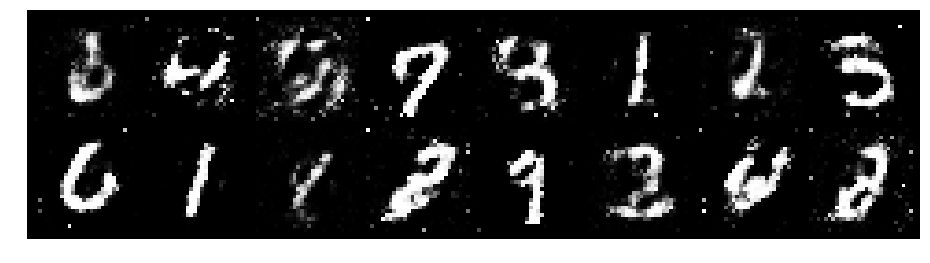

Epoch: [38/200], Batch Num: [0/600]
Discriminator Loss: 1.0354, Generator Loss: 1.1589
D(x): 0.6677, D(G(z)): 0.3837


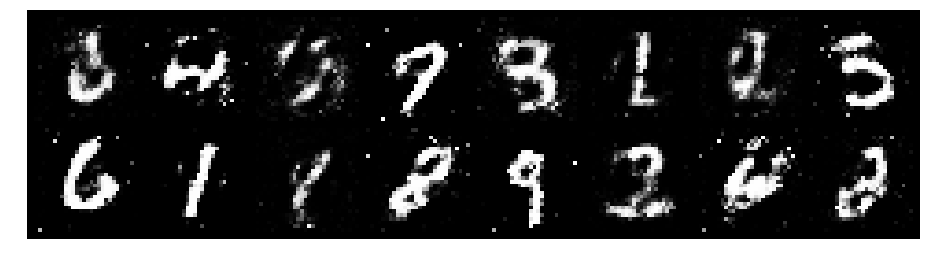

Epoch: [38/200], Batch Num: [100/600]
Discriminator Loss: 1.0152, Generator Loss: 1.2251
D(x): 0.6423, D(G(z)): 0.3386


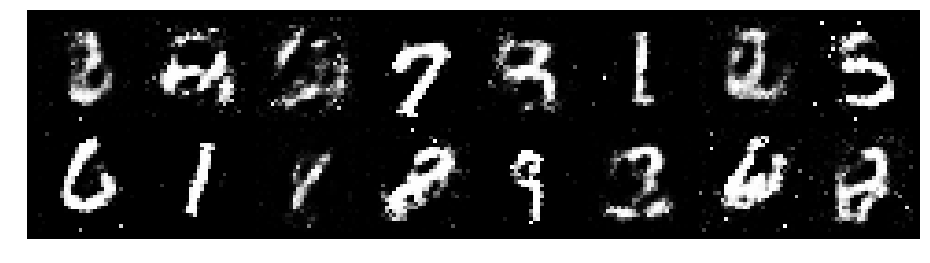

Epoch: [38/200], Batch Num: [200/600]
Discriminator Loss: 0.8872, Generator Loss: 1.2828
D(x): 0.6831, D(G(z)): 0.3160


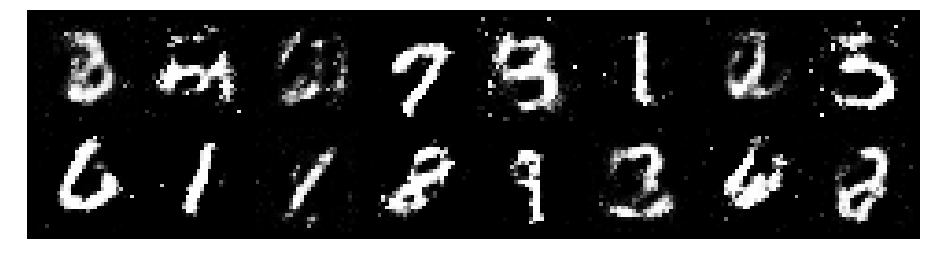

Epoch: [38/200], Batch Num: [300/600]
Discriminator Loss: 0.9754, Generator Loss: 1.3914
D(x): 0.6664, D(G(z)): 0.3509


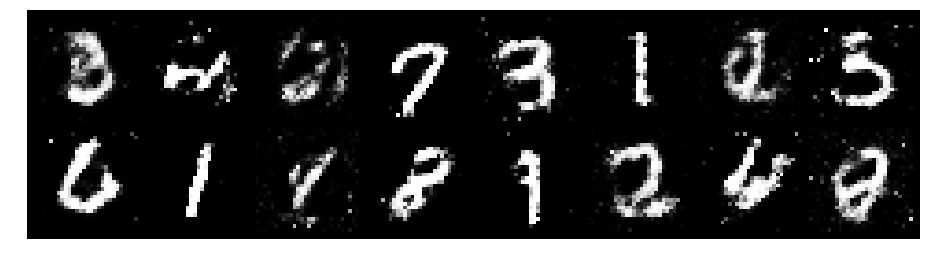

Epoch: [38/200], Batch Num: [400/600]
Discriminator Loss: 0.8957, Generator Loss: 1.5638
D(x): 0.6815, D(G(z)): 0.3018


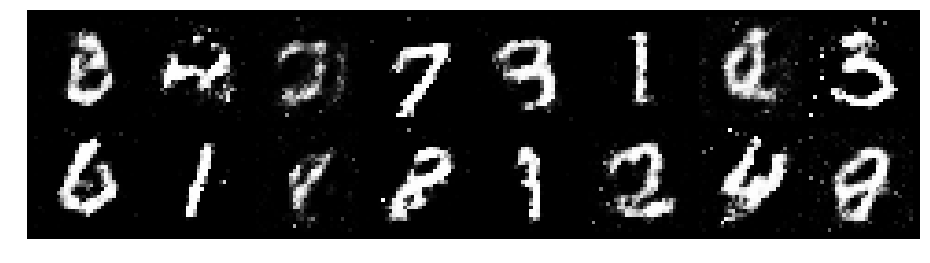

Epoch: [38/200], Batch Num: [500/600]
Discriminator Loss: 1.1366, Generator Loss: 1.3963
D(x): 0.6483, D(G(z)): 0.4065


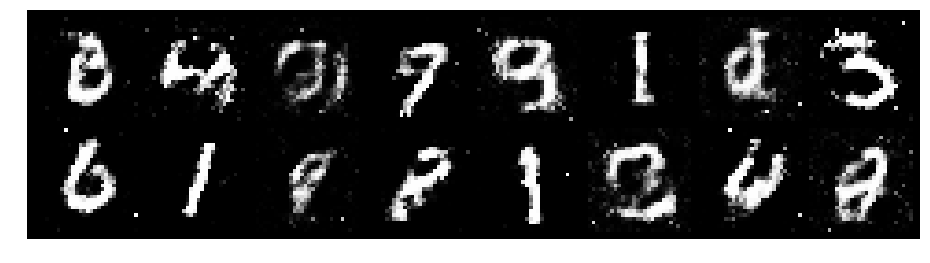

Epoch: [39/200], Batch Num: [0/600]
Discriminator Loss: 1.1515, Generator Loss: 1.3621
D(x): 0.5986, D(G(z)): 0.3454


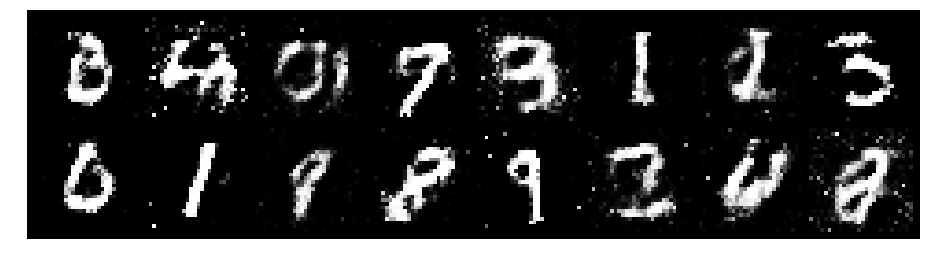

Epoch: [39/200], Batch Num: [100/600]
Discriminator Loss: 1.1728, Generator Loss: 1.1646
D(x): 0.6416, D(G(z)): 0.3978


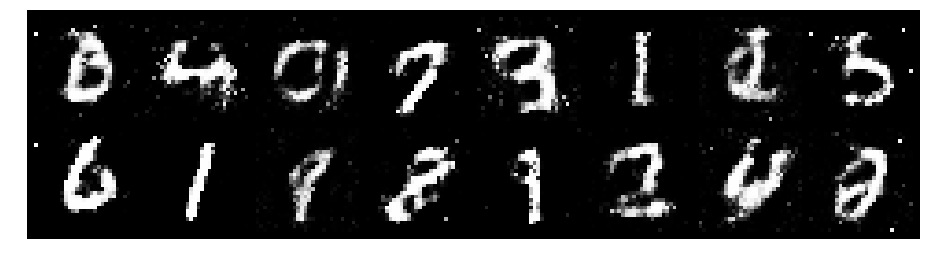

Epoch: [39/200], Batch Num: [200/600]
Discriminator Loss: 1.2634, Generator Loss: 1.3626
D(x): 0.6117, D(G(z)): 0.4363


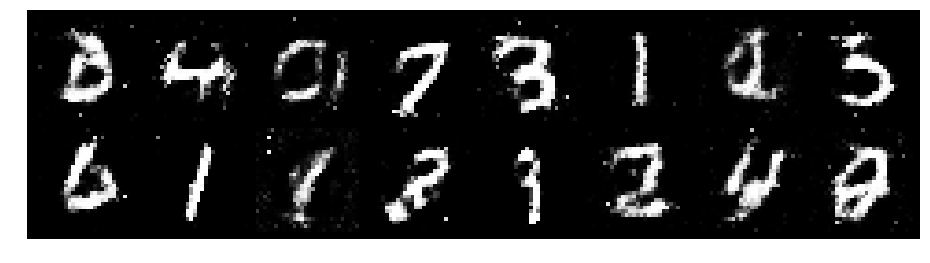

Epoch: [39/200], Batch Num: [300/600]
Discriminator Loss: 1.1048, Generator Loss: 1.0377
D(x): 0.6425, D(G(z)): 0.3956


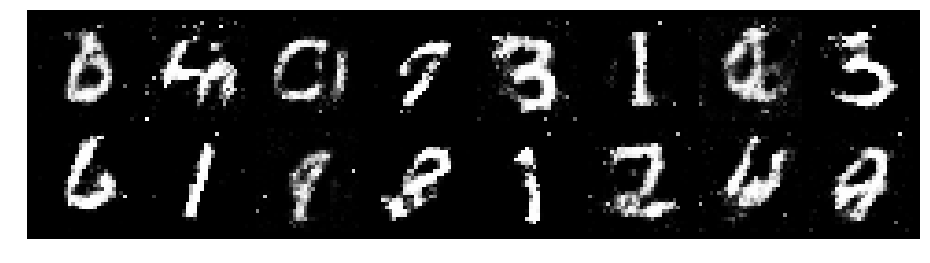

Epoch: [39/200], Batch Num: [400/600]
Discriminator Loss: 1.1453, Generator Loss: 1.0366
D(x): 0.6010, D(G(z)): 0.3506


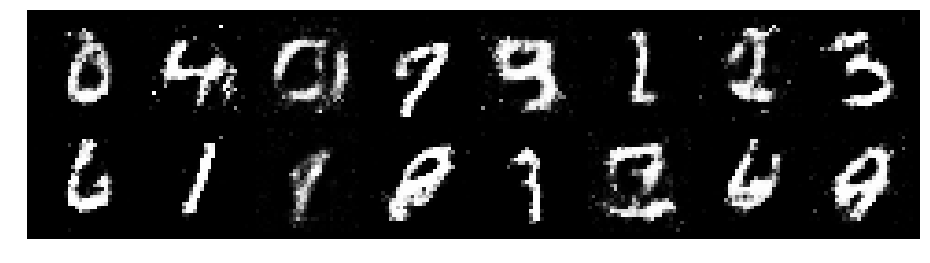

Epoch: [39/200], Batch Num: [500/600]
Discriminator Loss: 1.2534, Generator Loss: 1.0970
D(x): 0.5518, D(G(z)): 0.3879


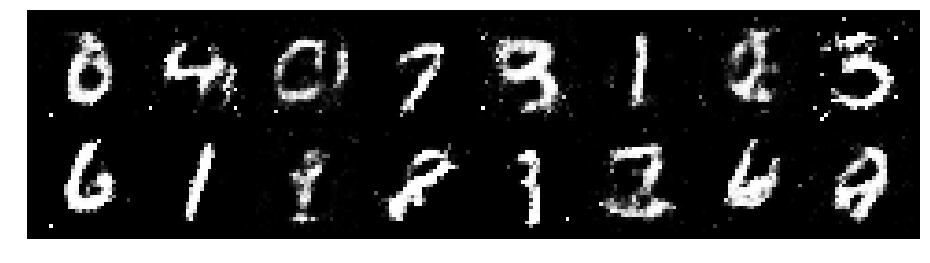

Epoch: [40/200], Batch Num: [0/600]
Discriminator Loss: 1.0805, Generator Loss: 1.0602
D(x): 0.6198, D(G(z)): 0.3789


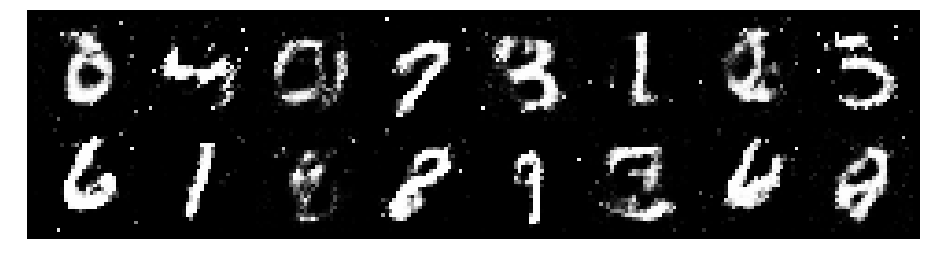

Epoch: [40/200], Batch Num: [100/600]
Discriminator Loss: 1.1350, Generator Loss: 1.0957
D(x): 0.6036, D(G(z)): 0.3905


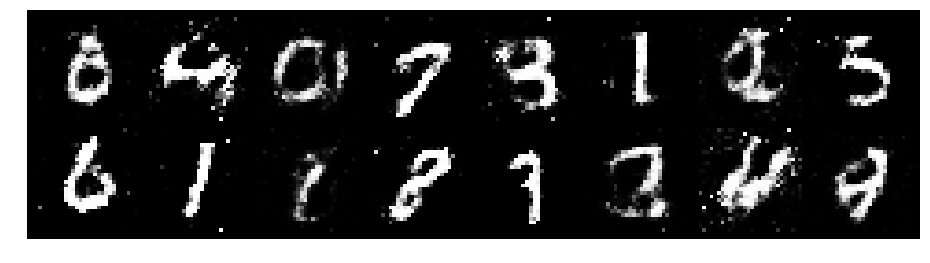

Epoch: [40/200], Batch Num: [200/600]
Discriminator Loss: 1.0672, Generator Loss: 1.2313
D(x): 0.6456, D(G(z)): 0.3744


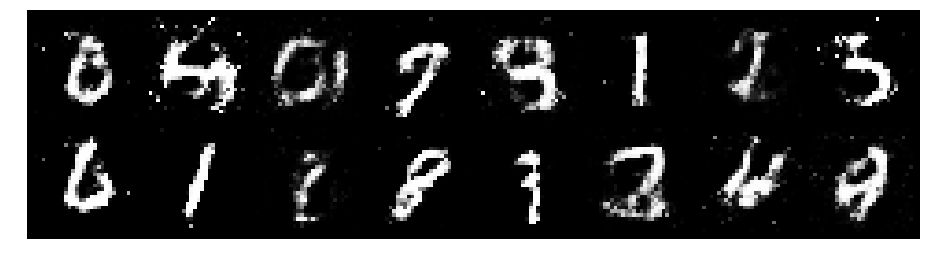

Epoch: [40/200], Batch Num: [300/600]
Discriminator Loss: 1.2113, Generator Loss: 1.1104
D(x): 0.6188, D(G(z)): 0.4233


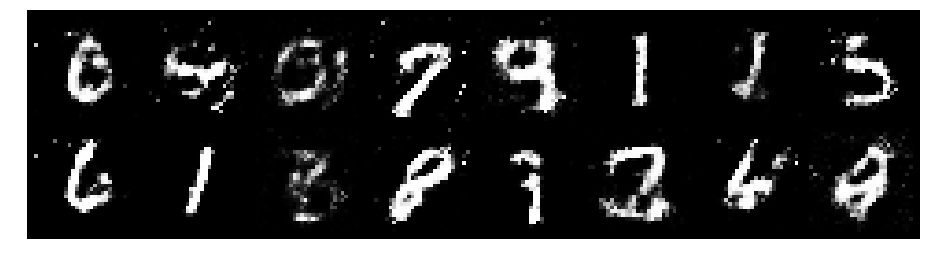

Epoch: [40/200], Batch Num: [400/600]
Discriminator Loss: 1.3619, Generator Loss: 1.2773
D(x): 0.5851, D(G(z)): 0.4103


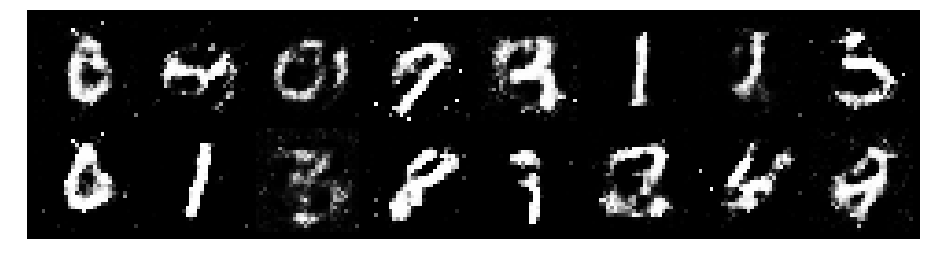

Epoch: [40/200], Batch Num: [500/600]
Discriminator Loss: 1.1569, Generator Loss: 1.2728
D(x): 0.5897, D(G(z)): 0.3380


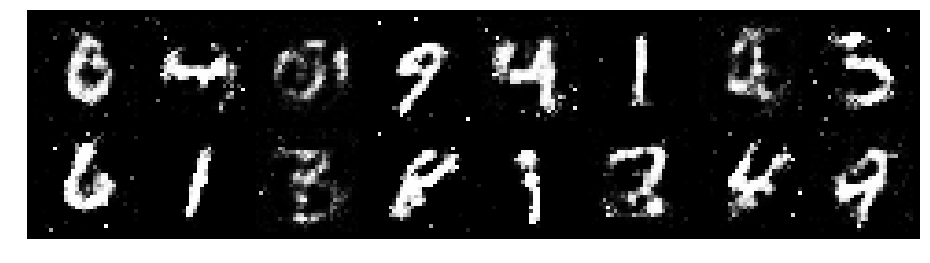

Epoch: [41/200], Batch Num: [0/600]
Discriminator Loss: 1.0493, Generator Loss: 1.2646
D(x): 0.6691, D(G(z)): 0.3774


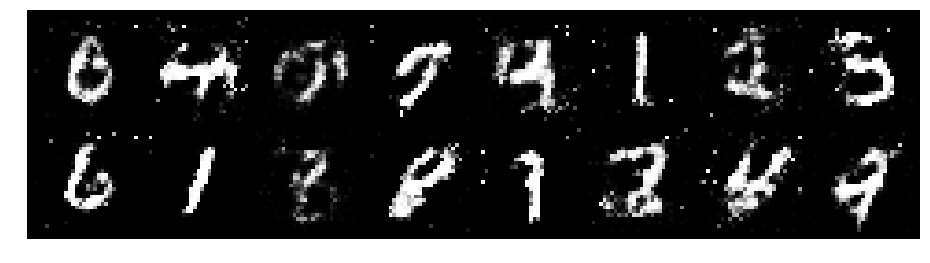

Epoch: [41/200], Batch Num: [100/600]
Discriminator Loss: 1.0234, Generator Loss: 1.2883
D(x): 0.6535, D(G(z)): 0.3400


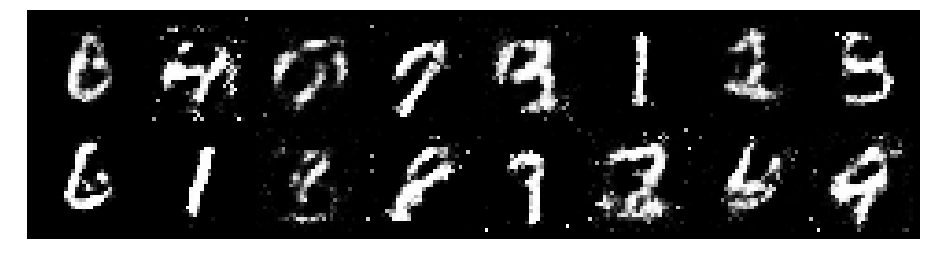

Epoch: [41/200], Batch Num: [200/600]
Discriminator Loss: 1.1248, Generator Loss: 1.2469
D(x): 0.6036, D(G(z)): 0.3545


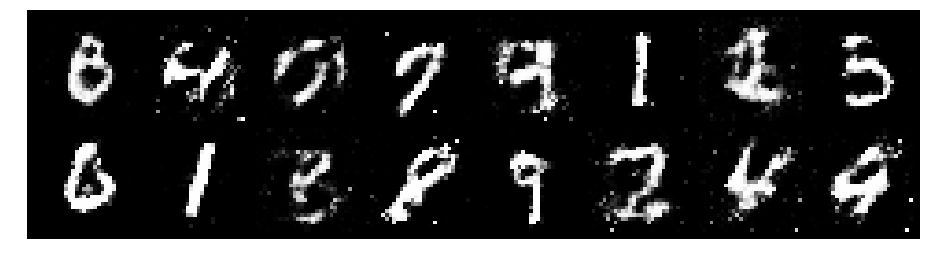

Epoch: [41/200], Batch Num: [300/600]
Discriminator Loss: 1.1351, Generator Loss: 1.0623
D(x): 0.6350, D(G(z)): 0.3911


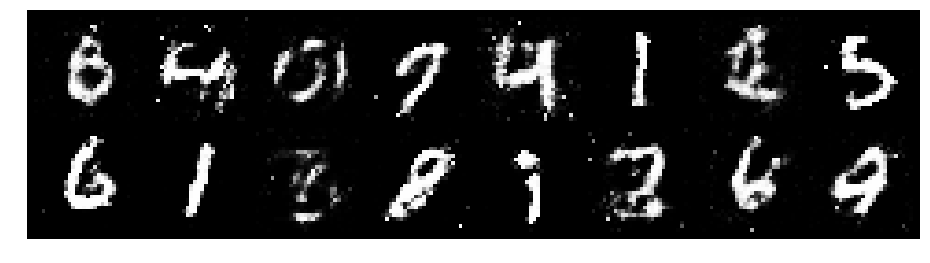

Epoch: [41/200], Batch Num: [400/600]
Discriminator Loss: 1.1386, Generator Loss: 1.2449
D(x): 0.6150, D(G(z)): 0.3628


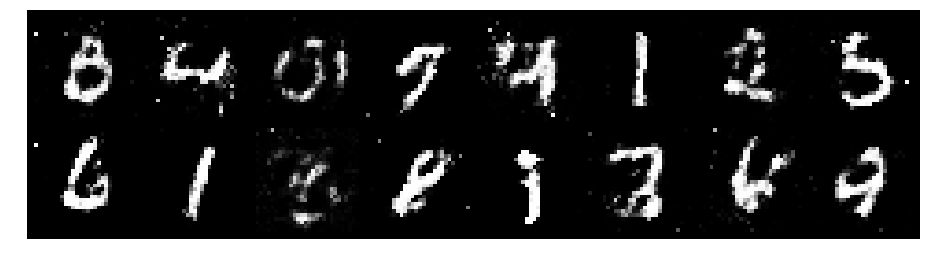

Epoch: [41/200], Batch Num: [500/600]
Discriminator Loss: 1.1526, Generator Loss: 1.0797
D(x): 0.6079, D(G(z)): 0.4042


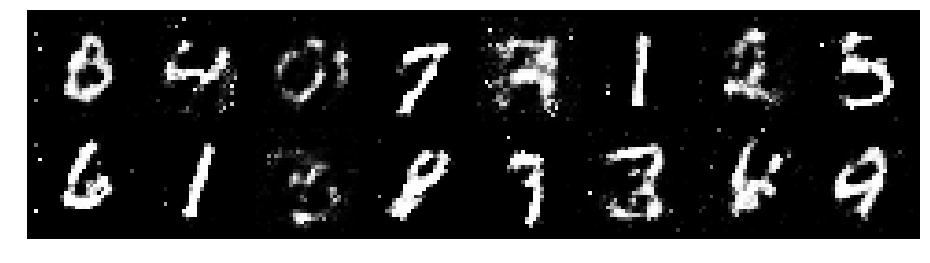

Epoch: [42/200], Batch Num: [0/600]
Discriminator Loss: 0.9840, Generator Loss: 1.1093
D(x): 0.6769, D(G(z)): 0.3818


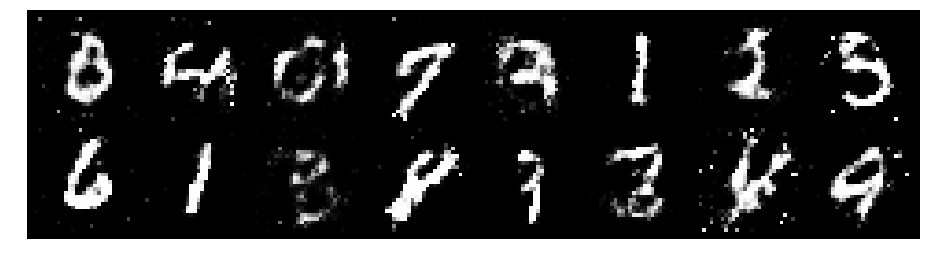

Epoch: [42/200], Batch Num: [100/600]
Discriminator Loss: 1.1496, Generator Loss: 0.9611
D(x): 0.6313, D(G(z)): 0.4264


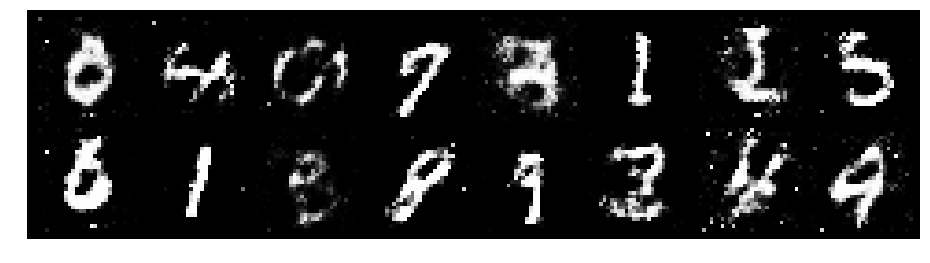

Epoch: [42/200], Batch Num: [200/600]
Discriminator Loss: 1.2418, Generator Loss: 0.9206
D(x): 0.6131, D(G(z)): 0.4392


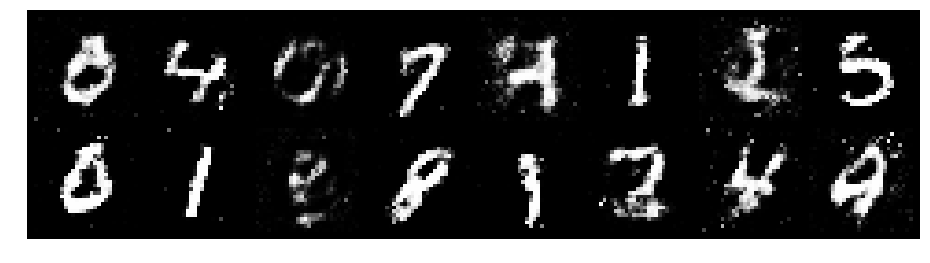

Epoch: [42/200], Batch Num: [300/600]
Discriminator Loss: 1.1343, Generator Loss: 1.2297
D(x): 0.6180, D(G(z)): 0.3939


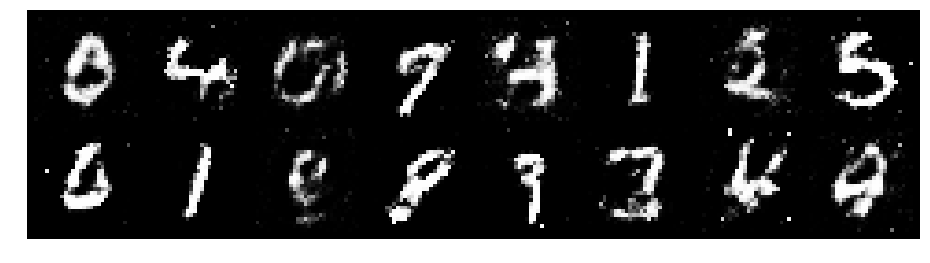

Epoch: [42/200], Batch Num: [400/600]
Discriminator Loss: 1.1035, Generator Loss: 1.0539
D(x): 0.6433, D(G(z)): 0.4148


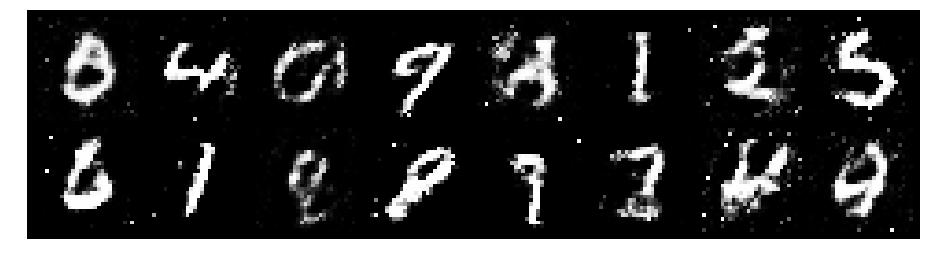

Epoch: [42/200], Batch Num: [500/600]
Discriminator Loss: 1.1463, Generator Loss: 1.2518
D(x): 0.5872, D(G(z)): 0.3512


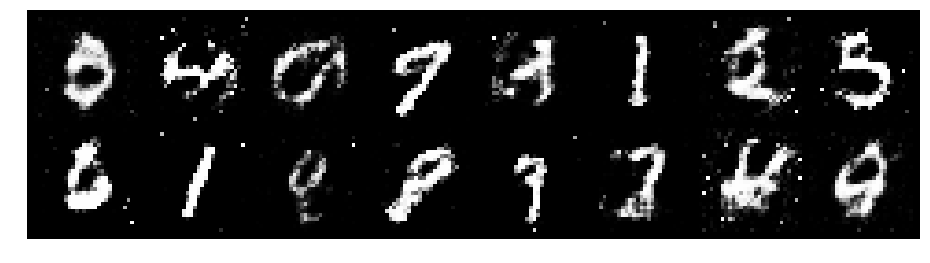

Epoch: [43/200], Batch Num: [0/600]
Discriminator Loss: 1.2016, Generator Loss: 1.0687
D(x): 0.5914, D(G(z)): 0.3841


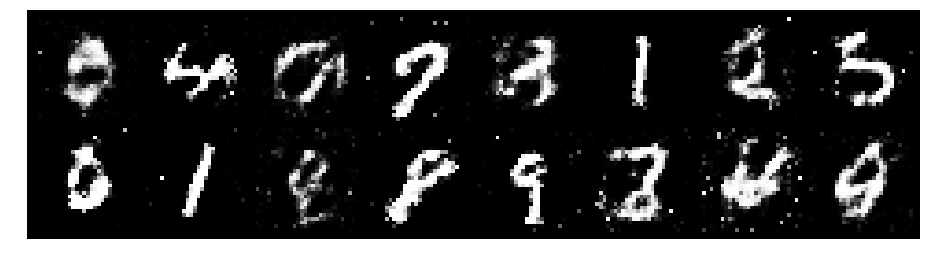

Epoch: [43/200], Batch Num: [100/600]
Discriminator Loss: 1.3056, Generator Loss: 1.0909
D(x): 0.5427, D(G(z)): 0.4041


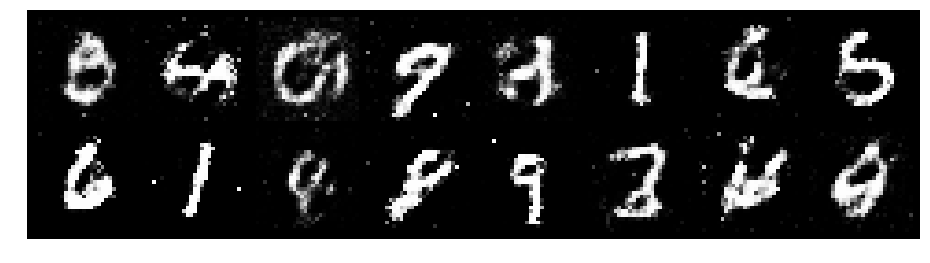

Epoch: [43/200], Batch Num: [200/600]
Discriminator Loss: 1.0559, Generator Loss: 1.0835
D(x): 0.6543, D(G(z)): 0.3868


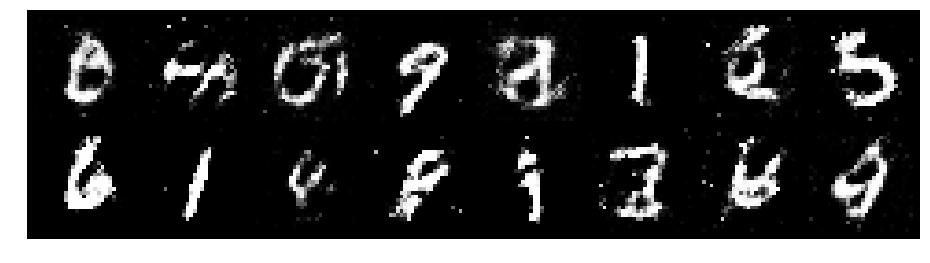

Epoch: [43/200], Batch Num: [300/600]
Discriminator Loss: 1.2188, Generator Loss: 1.0979
D(x): 0.5710, D(G(z)): 0.3987


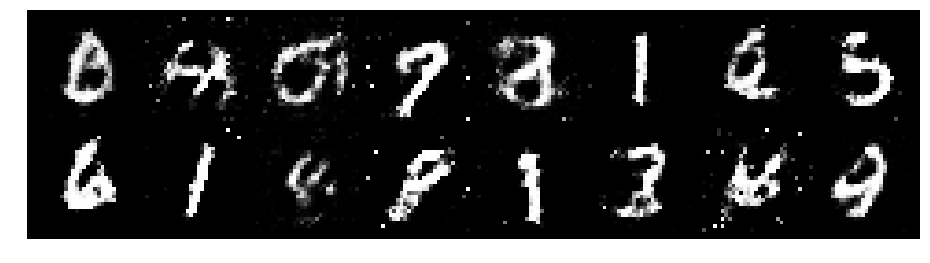

Epoch: [43/200], Batch Num: [400/600]
Discriminator Loss: 1.2048, Generator Loss: 1.2341
D(x): 0.5644, D(G(z)): 0.3841


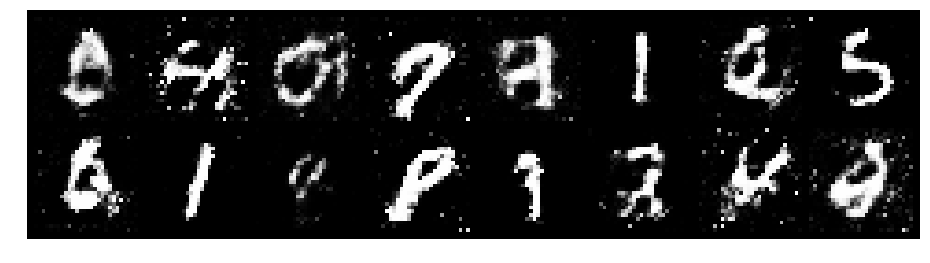

Epoch: [43/200], Batch Num: [500/600]
Discriminator Loss: 0.9770, Generator Loss: 1.2661
D(x): 0.6343, D(G(z)): 0.3336


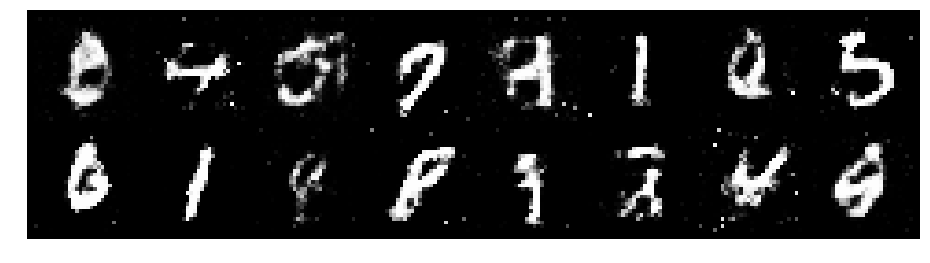

Epoch: [44/200], Batch Num: [0/600]
Discriminator Loss: 1.1428, Generator Loss: 1.1690
D(x): 0.6150, D(G(z)): 0.3771


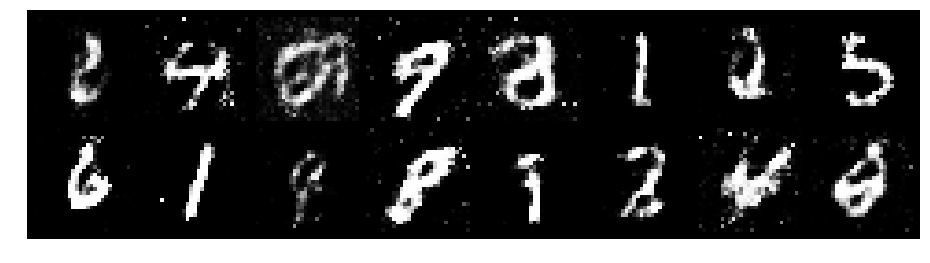

Epoch: [44/200], Batch Num: [100/600]
Discriminator Loss: 1.4370, Generator Loss: 1.0593
D(x): 0.5842, D(G(z)): 0.4799


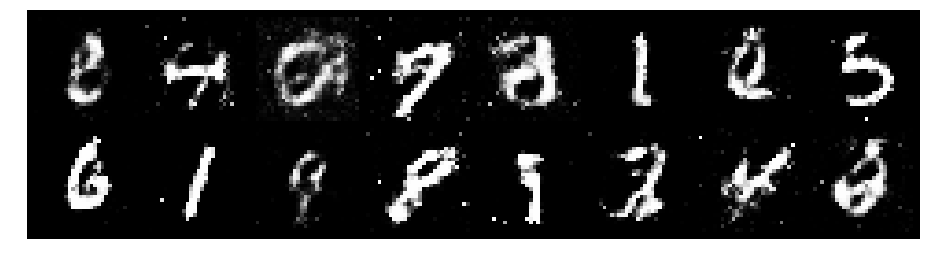

Epoch: [44/200], Batch Num: [200/600]
Discriminator Loss: 1.0867, Generator Loss: 0.8898
D(x): 0.6063, D(G(z)): 0.3937


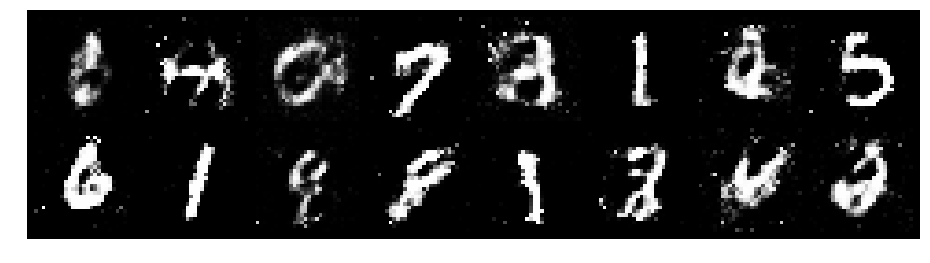

Epoch: [44/200], Batch Num: [300/600]
Discriminator Loss: 1.1234, Generator Loss: 0.9538
D(x): 0.6715, D(G(z)): 0.4495


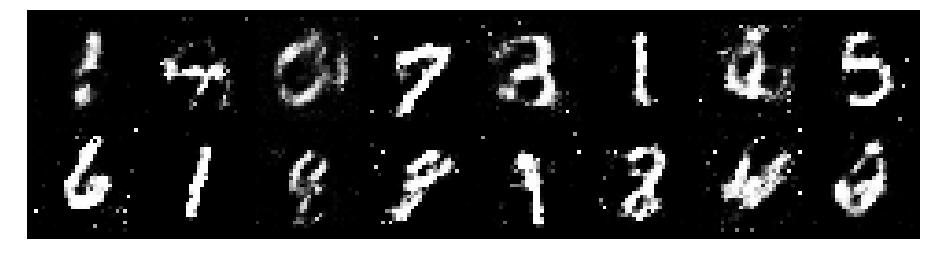

Epoch: [44/200], Batch Num: [400/600]
Discriminator Loss: 1.1742, Generator Loss: 1.1324
D(x): 0.5981, D(G(z)): 0.3984


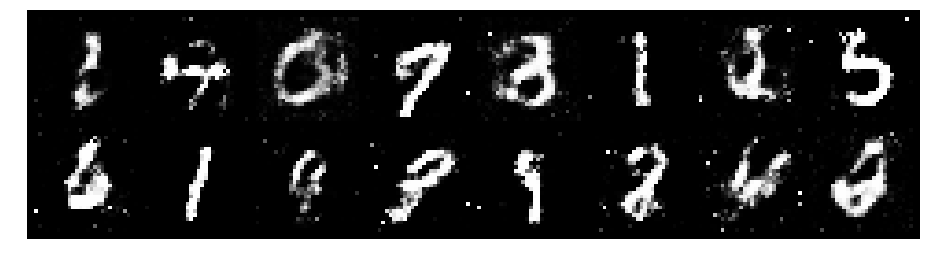

Epoch: [44/200], Batch Num: [500/600]
Discriminator Loss: 1.2324, Generator Loss: 1.2434
D(x): 0.6065, D(G(z)): 0.4044


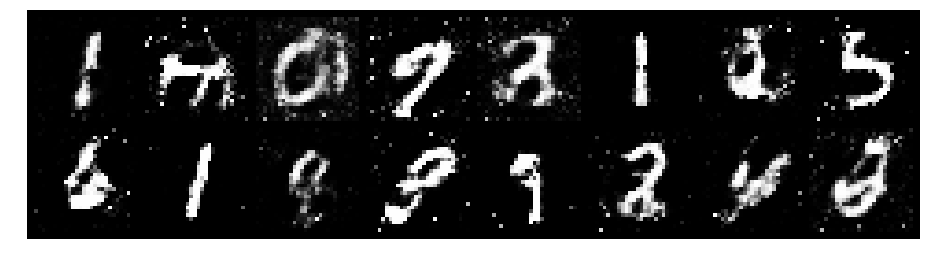

Epoch: [45/200], Batch Num: [0/600]
Discriminator Loss: 1.1267, Generator Loss: 1.1110
D(x): 0.5234, D(G(z)): 0.3200


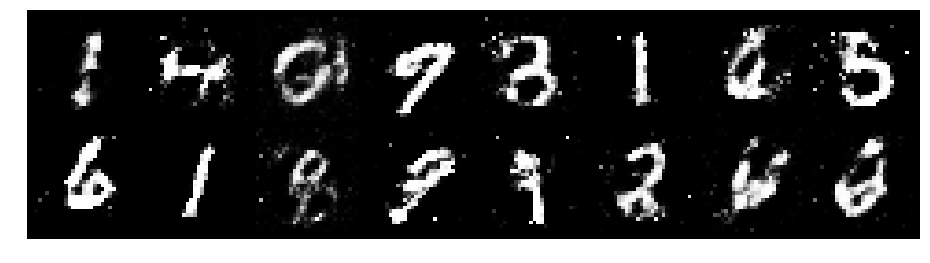

Epoch: [45/200], Batch Num: [100/600]
Discriminator Loss: 1.1345, Generator Loss: 1.2926
D(x): 0.6075, D(G(z)): 0.3993


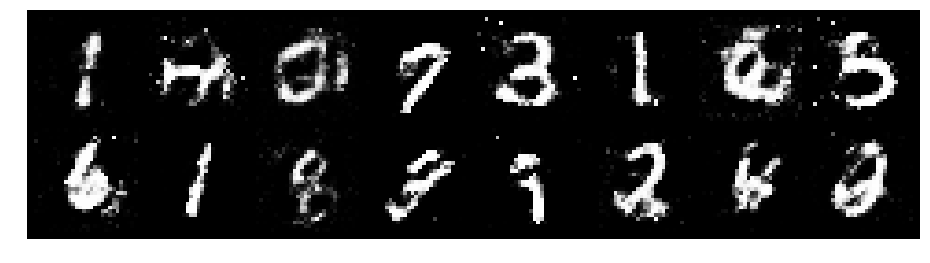

Epoch: [45/200], Batch Num: [200/600]
Discriminator Loss: 0.9984, Generator Loss: 1.0966
D(x): 0.6733, D(G(z)): 0.3899


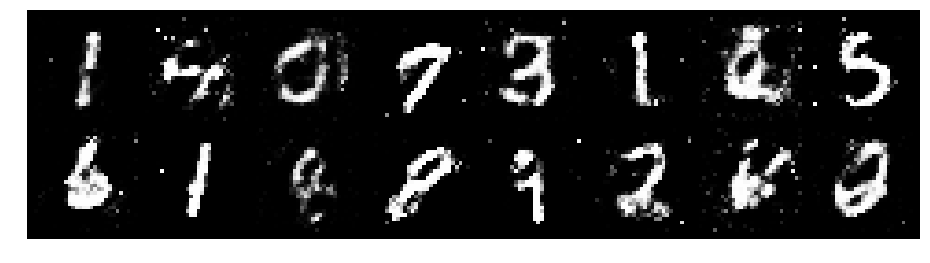

Epoch: [45/200], Batch Num: [300/600]
Discriminator Loss: 1.1700, Generator Loss: 1.1667
D(x): 0.5621, D(G(z)): 0.3747


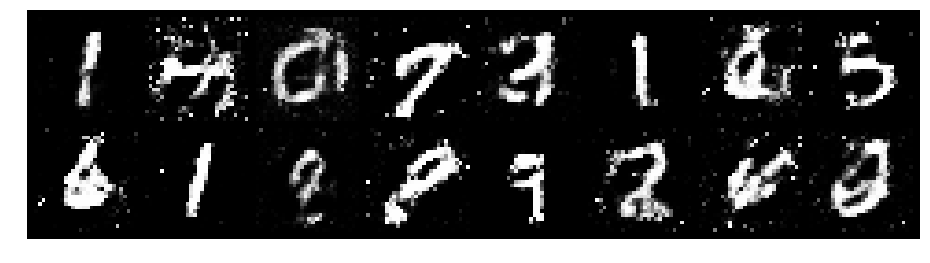

Epoch: [45/200], Batch Num: [400/600]
Discriminator Loss: 1.1414, Generator Loss: 1.0863
D(x): 0.6448, D(G(z)): 0.4069


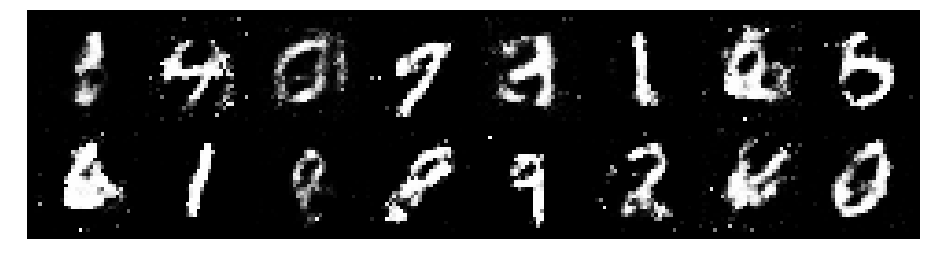

Epoch: [45/200], Batch Num: [500/600]
Discriminator Loss: 1.1923, Generator Loss: 0.9257
D(x): 0.6111, D(G(z)): 0.4531


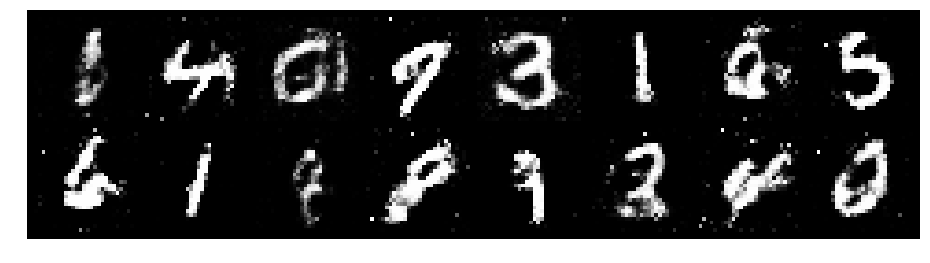

Epoch: [46/200], Batch Num: [0/600]
Discriminator Loss: 1.2883, Generator Loss: 1.2476
D(x): 0.5316, D(G(z)): 0.3820


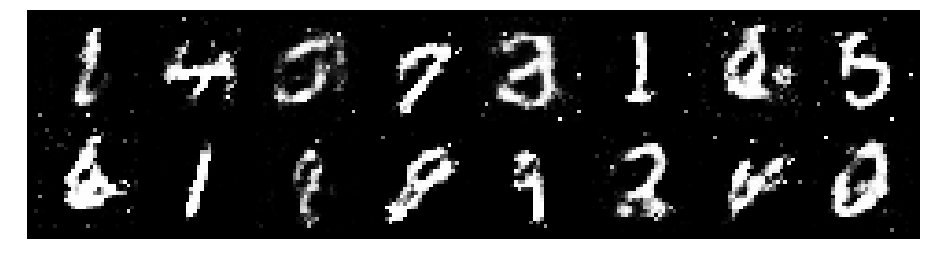

Epoch: [46/200], Batch Num: [100/600]
Discriminator Loss: 1.1666, Generator Loss: 0.9990
D(x): 0.6254, D(G(z)): 0.4175


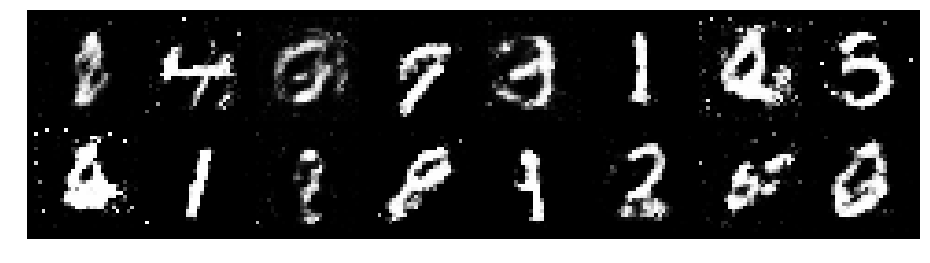

Epoch: [46/200], Batch Num: [200/600]
Discriminator Loss: 1.2805, Generator Loss: 0.9877
D(x): 0.6109, D(G(z)): 0.4581


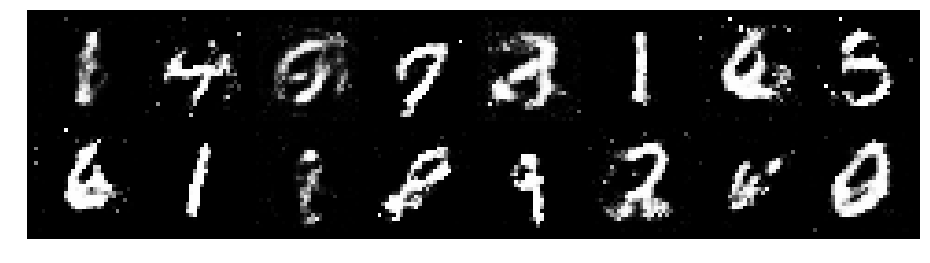

Epoch: [46/200], Batch Num: [300/600]
Discriminator Loss: 1.1495, Generator Loss: 1.0533
D(x): 0.6419, D(G(z)): 0.4121


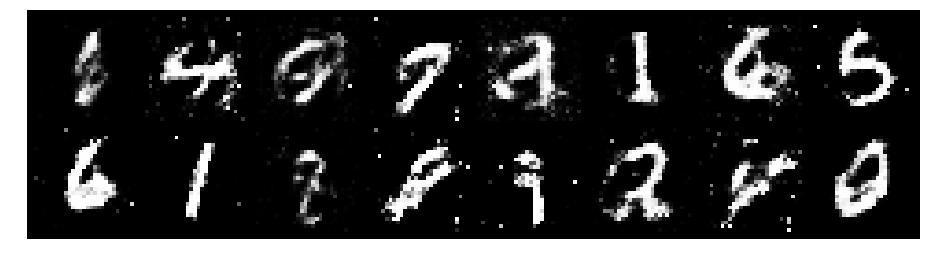

Epoch: [46/200], Batch Num: [400/600]
Discriminator Loss: 0.9800, Generator Loss: 1.3188
D(x): 0.6613, D(G(z)): 0.3495


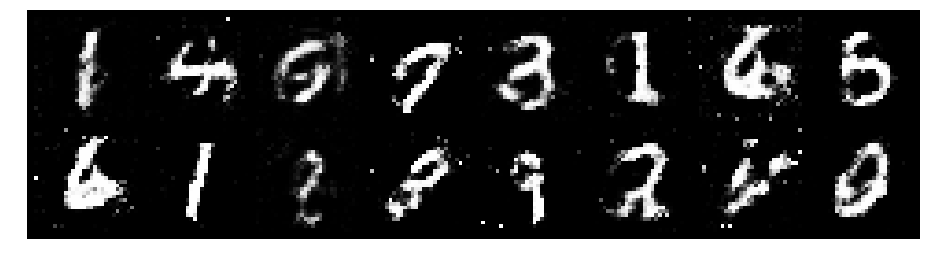

Epoch: [46/200], Batch Num: [500/600]
Discriminator Loss: 1.1800, Generator Loss: 1.1140
D(x): 0.5560, D(G(z)): 0.3672


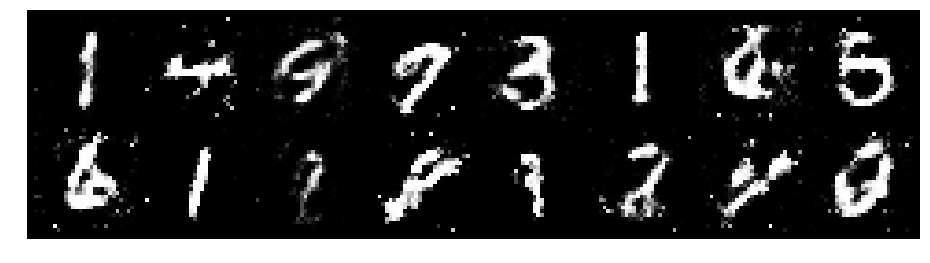

Epoch: [47/200], Batch Num: [0/600]
Discriminator Loss: 1.0442, Generator Loss: 1.2171
D(x): 0.6038, D(G(z)): 0.3397


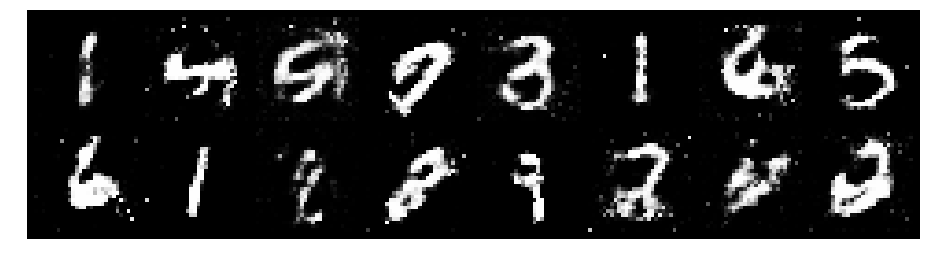

Epoch: [47/200], Batch Num: [100/600]
Discriminator Loss: 1.2085, Generator Loss: 0.9109
D(x): 0.5711, D(G(z)): 0.4255


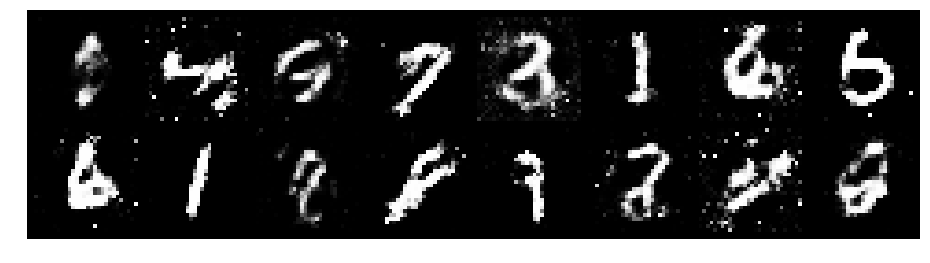

Epoch: [47/200], Batch Num: [200/600]
Discriminator Loss: 1.2132, Generator Loss: 0.9422
D(x): 0.5353, D(G(z)): 0.3922


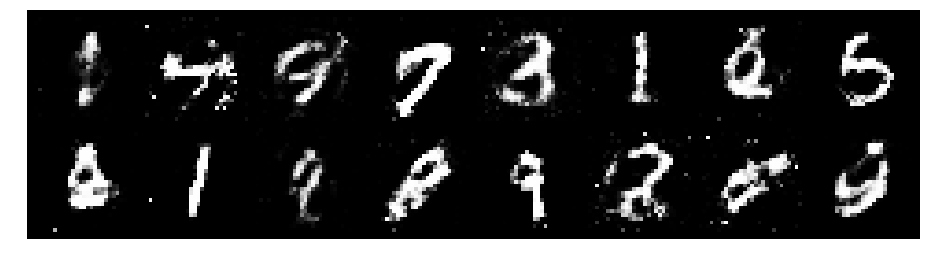

Epoch: [47/200], Batch Num: [300/600]
Discriminator Loss: 1.2432, Generator Loss: 1.0025
D(x): 0.5328, D(G(z)): 0.4047


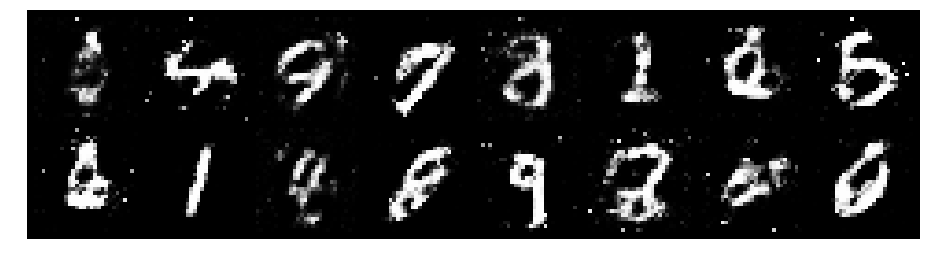

Epoch: [47/200], Batch Num: [400/600]
Discriminator Loss: 1.1804, Generator Loss: 1.0146
D(x): 0.5819, D(G(z)): 0.4191


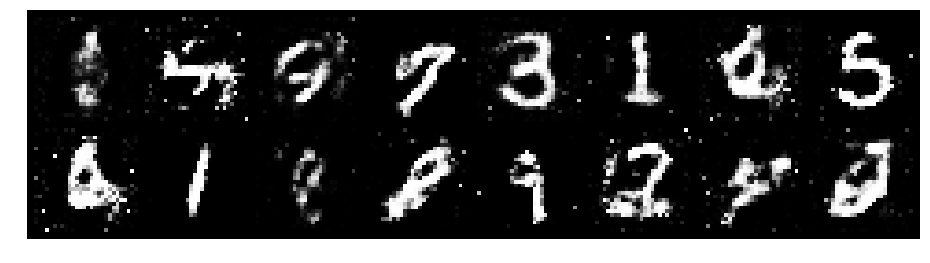

Epoch: [47/200], Batch Num: [500/600]
Discriminator Loss: 0.9859, Generator Loss: 1.2525
D(x): 0.6431, D(G(z)): 0.3496


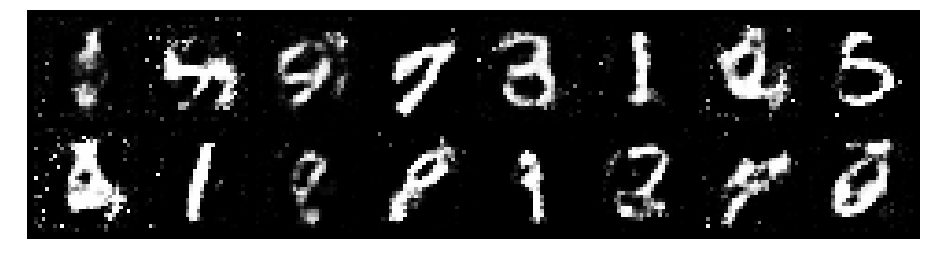

Epoch: [48/200], Batch Num: [0/600]
Discriminator Loss: 1.0769, Generator Loss: 1.0244
D(x): 0.6429, D(G(z)): 0.3879


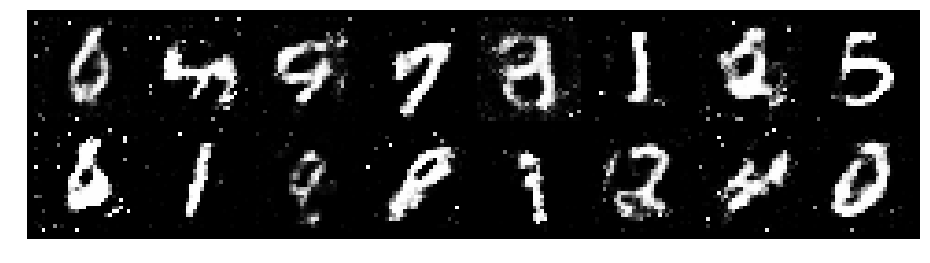

Epoch: [48/200], Batch Num: [100/600]
Discriminator Loss: 1.2174, Generator Loss: 1.2401
D(x): 0.5859, D(G(z)): 0.3917


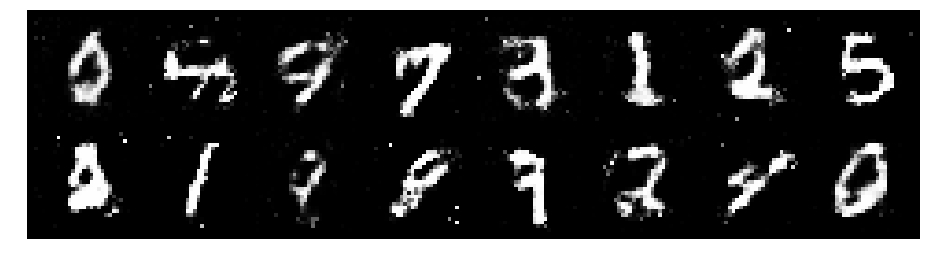

Epoch: [48/200], Batch Num: [200/600]
Discriminator Loss: 1.1107, Generator Loss: 1.0658
D(x): 0.6110, D(G(z)): 0.3587


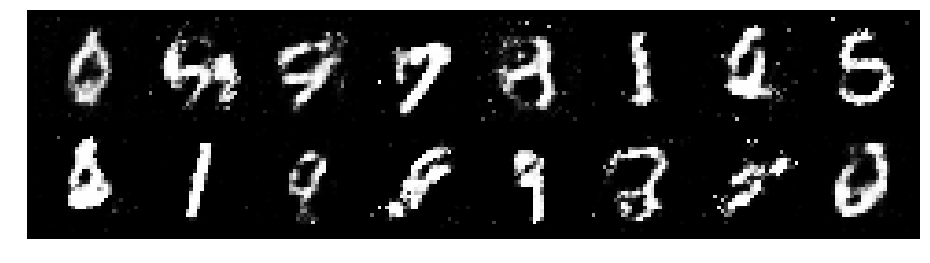

Epoch: [48/200], Batch Num: [300/600]
Discriminator Loss: 1.3086, Generator Loss: 1.0258
D(x): 0.5372, D(G(z)): 0.4167


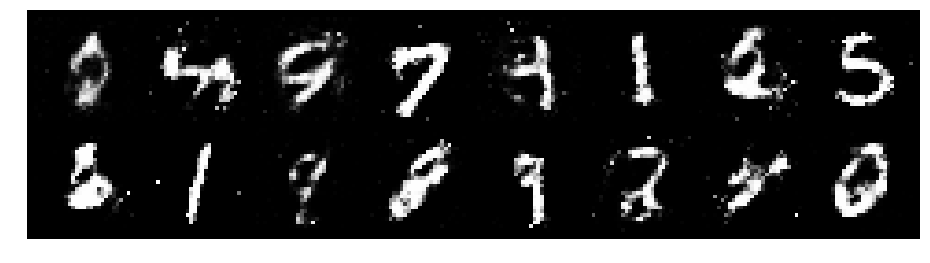

Epoch: [48/200], Batch Num: [400/600]
Discriminator Loss: 1.2564, Generator Loss: 0.9654
D(x): 0.5585, D(G(z)): 0.4239


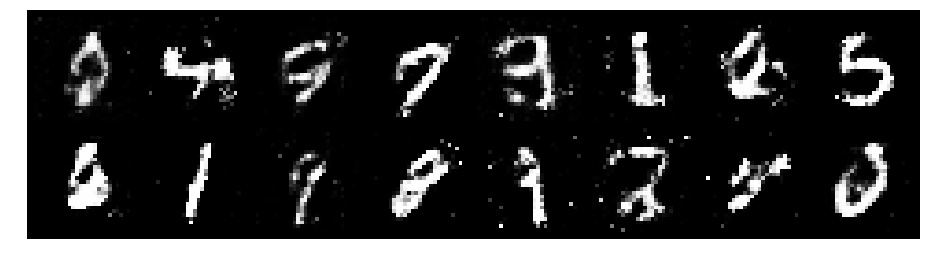

Epoch: [48/200], Batch Num: [500/600]
Discriminator Loss: 1.1724, Generator Loss: 0.8916
D(x): 0.5863, D(G(z)): 0.4139


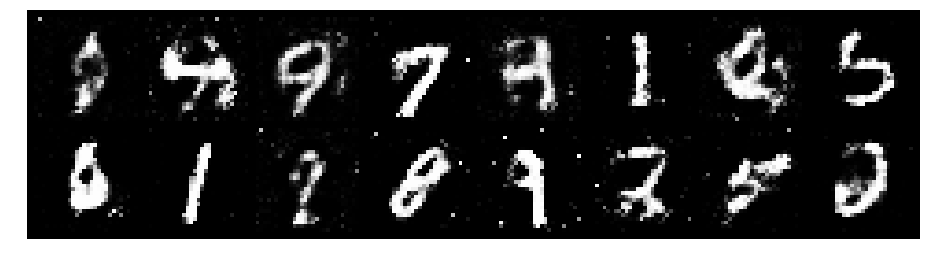

Epoch: [49/200], Batch Num: [0/600]
Discriminator Loss: 1.1459, Generator Loss: 1.1083
D(x): 0.5985, D(G(z)): 0.3972


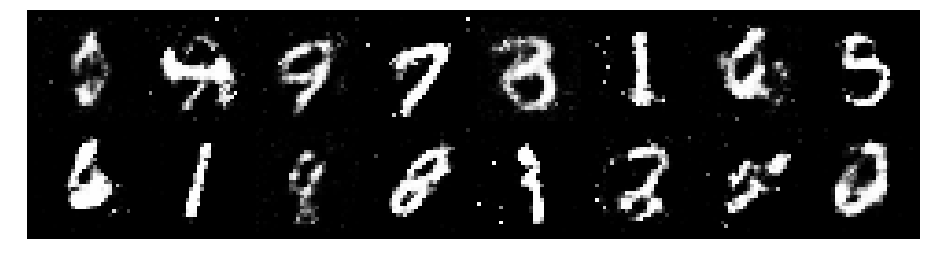

Epoch: [49/200], Batch Num: [100/600]
Discriminator Loss: 1.1582, Generator Loss: 0.8598
D(x): 0.5930, D(G(z)): 0.4263


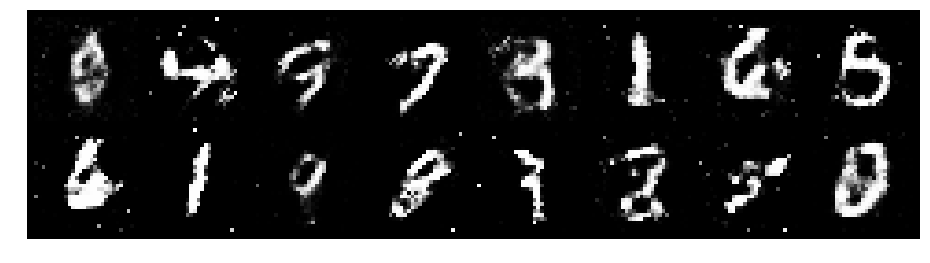

Epoch: [49/200], Batch Num: [200/600]
Discriminator Loss: 1.1331, Generator Loss: 1.0507
D(x): 0.5723, D(G(z)): 0.3677


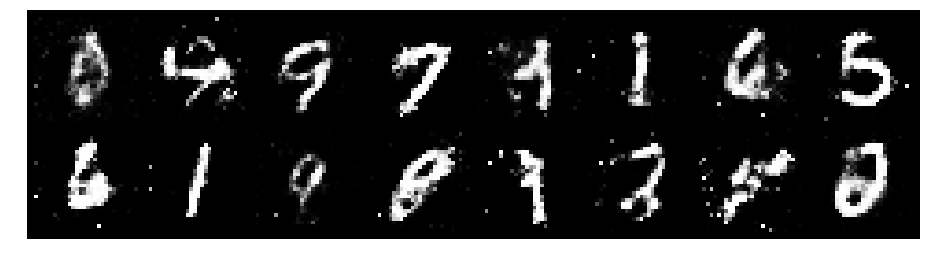

Epoch: [49/200], Batch Num: [300/600]
Discriminator Loss: 1.0752, Generator Loss: 1.1234
D(x): 0.6049, D(G(z)): 0.3615


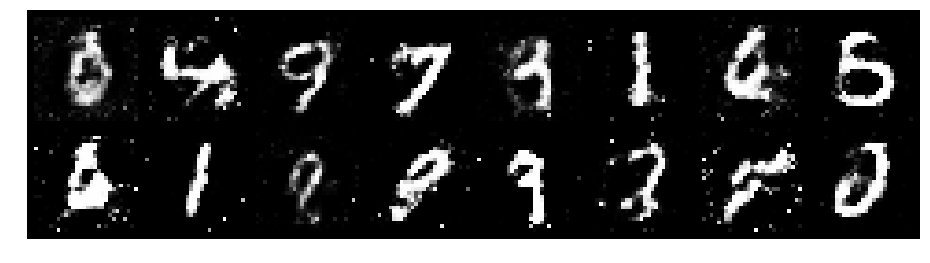

Epoch: [49/200], Batch Num: [400/600]
Discriminator Loss: 1.2307, Generator Loss: 1.0341
D(x): 0.5627, D(G(z)): 0.3782


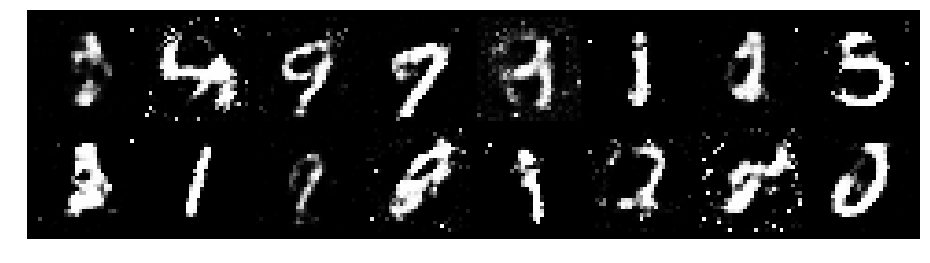

Epoch: [49/200], Batch Num: [500/600]
Discriminator Loss: 1.2625, Generator Loss: 1.0236
D(x): 0.5912, D(G(z)): 0.4181


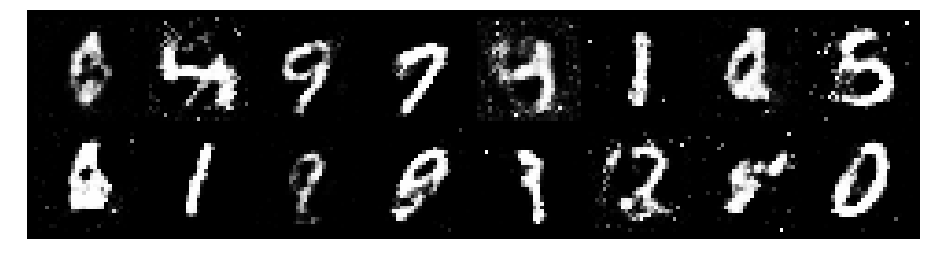

Epoch: [50/200], Batch Num: [0/600]
Discriminator Loss: 1.2778, Generator Loss: 0.9454
D(x): 0.5646, D(G(z)): 0.3790


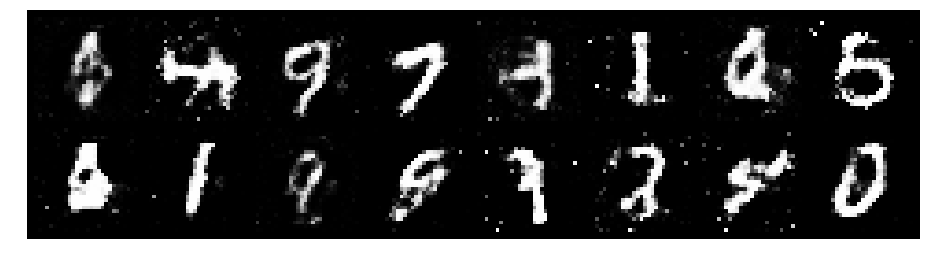

Epoch: [50/200], Batch Num: [100/600]
Discriminator Loss: 1.0780, Generator Loss: 1.0824
D(x): 0.6588, D(G(z)): 0.3878


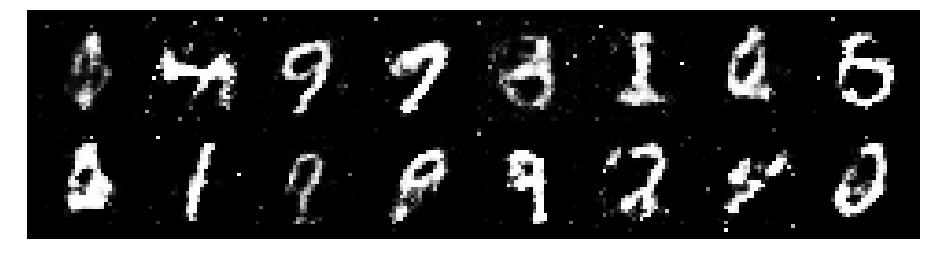

Epoch: [50/200], Batch Num: [200/600]
Discriminator Loss: 1.3512, Generator Loss: 0.9837
D(x): 0.5700, D(G(z)): 0.4640


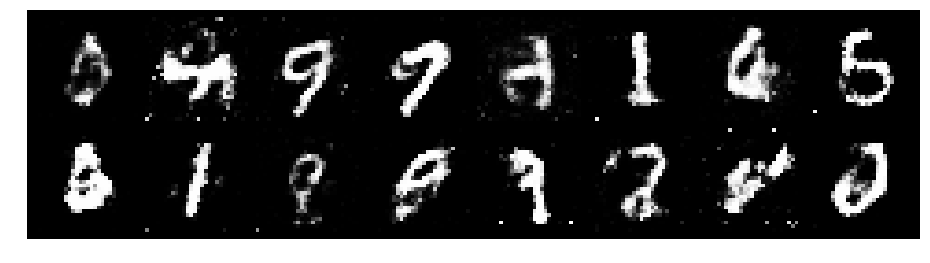

Epoch: [50/200], Batch Num: [300/600]
Discriminator Loss: 1.1938, Generator Loss: 1.0532
D(x): 0.6156, D(G(z)): 0.4404


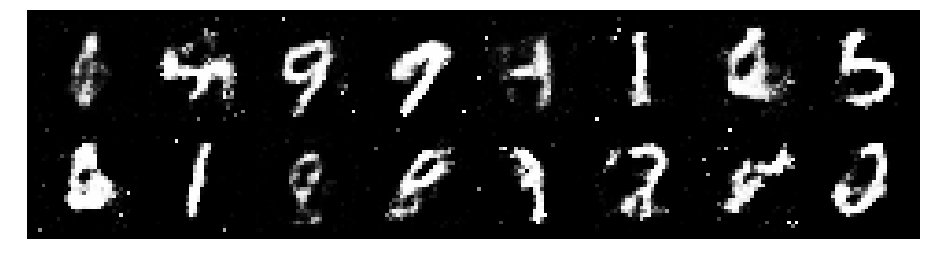

Epoch: [50/200], Batch Num: [400/600]
Discriminator Loss: 1.1091, Generator Loss: 1.0636
D(x): 0.6443, D(G(z)): 0.4007


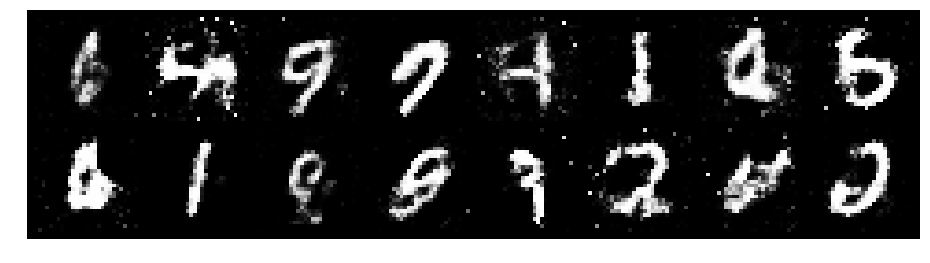

Epoch: [50/200], Batch Num: [500/600]
Discriminator Loss: 1.1521, Generator Loss: 0.8587
D(x): 0.6198, D(G(z)): 0.4354


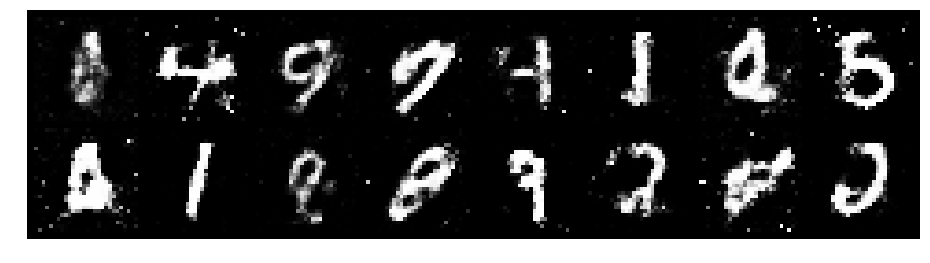

Epoch: [51/200], Batch Num: [0/600]
Discriminator Loss: 1.3695, Generator Loss: 0.7843
D(x): 0.5752, D(G(z)): 0.4854


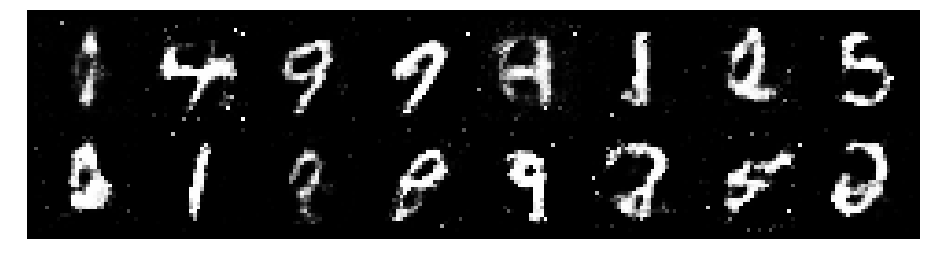

Epoch: [51/200], Batch Num: [100/600]
Discriminator Loss: 1.2980, Generator Loss: 0.9923
D(x): 0.5321, D(G(z)): 0.4333


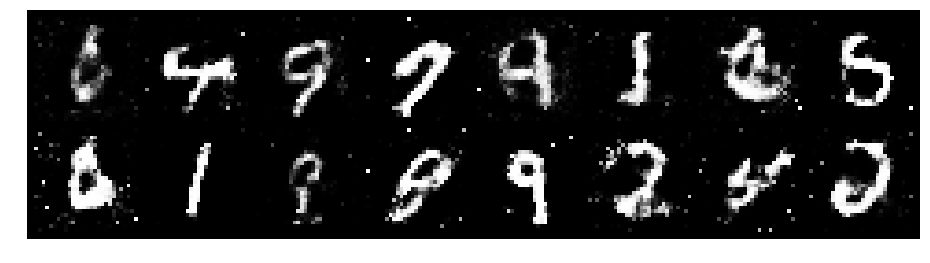

Epoch: [51/200], Batch Num: [200/600]
Discriminator Loss: 1.1695, Generator Loss: 0.9633
D(x): 0.5824, D(G(z)): 0.3694


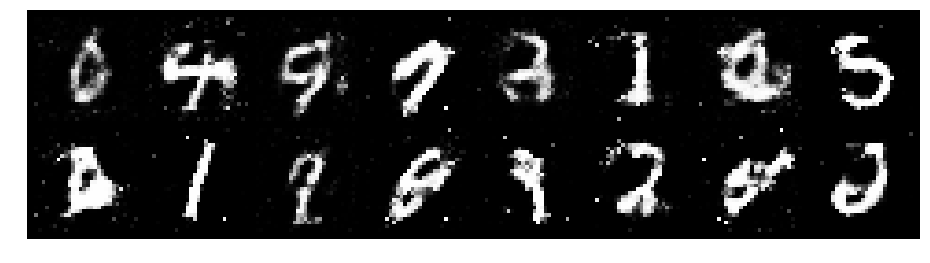

Epoch: [51/200], Batch Num: [300/600]
Discriminator Loss: 1.1736, Generator Loss: 1.0436
D(x): 0.6596, D(G(z)): 0.4393


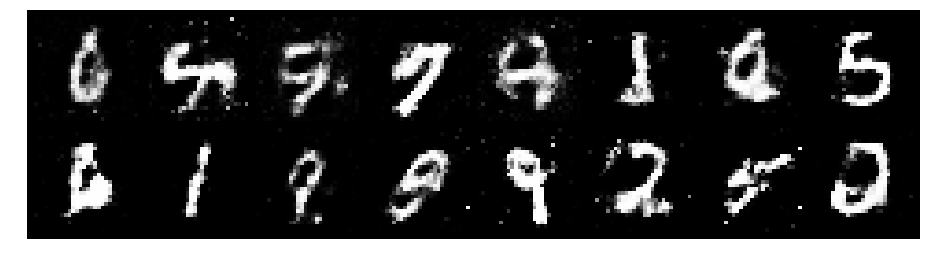

Epoch: [51/200], Batch Num: [400/600]
Discriminator Loss: 1.1024, Generator Loss: 1.0232
D(x): 0.6052, D(G(z)): 0.4059


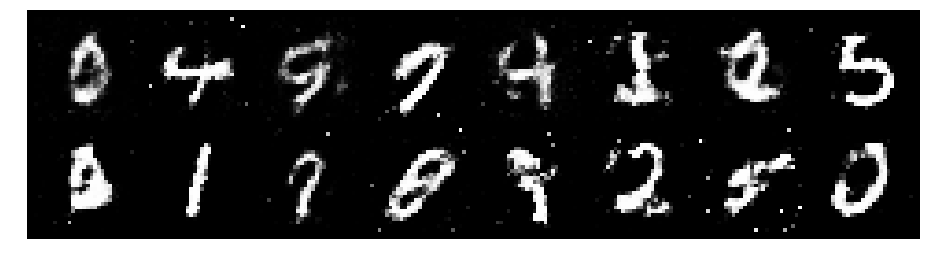

Epoch: [51/200], Batch Num: [500/600]
Discriminator Loss: 1.2165, Generator Loss: 0.8974
D(x): 0.5858, D(G(z)): 0.4585


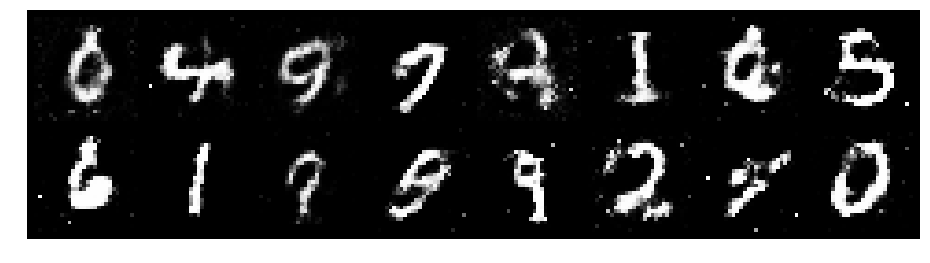

Epoch: [52/200], Batch Num: [0/600]
Discriminator Loss: 1.1792, Generator Loss: 1.0331
D(x): 0.5716, D(G(z)): 0.3988


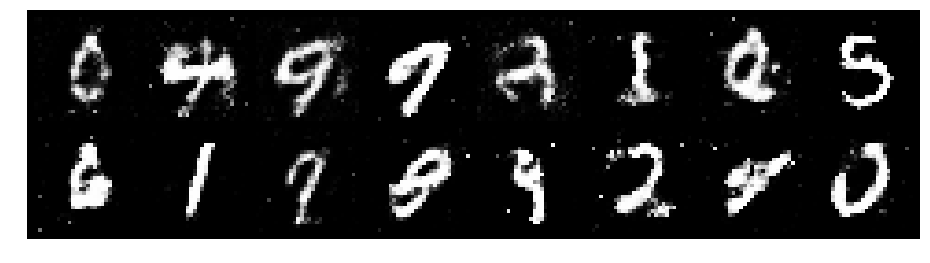

Epoch: [52/200], Batch Num: [100/600]
Discriminator Loss: 1.1522, Generator Loss: 1.0038
D(x): 0.5807, D(G(z)): 0.3840


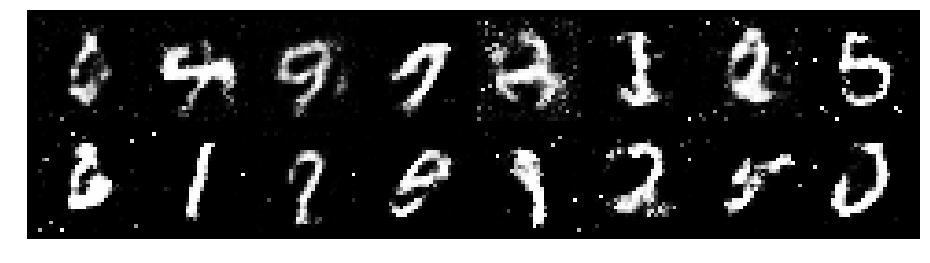

Epoch: [52/200], Batch Num: [200/600]
Discriminator Loss: 1.0816, Generator Loss: 1.1079
D(x): 0.5940, D(G(z)): 0.3564


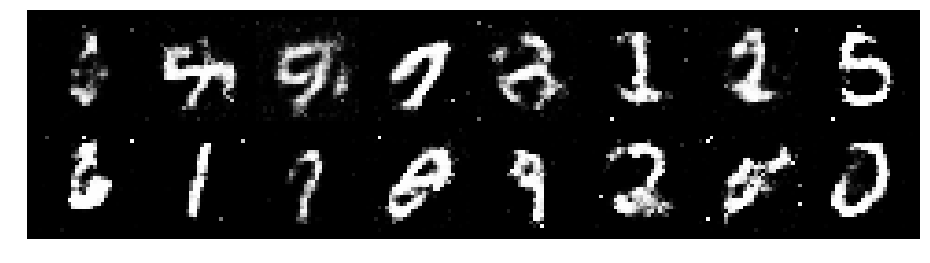

Epoch: [52/200], Batch Num: [300/600]
Discriminator Loss: 1.1137, Generator Loss: 0.9961
D(x): 0.5991, D(G(z)): 0.3701


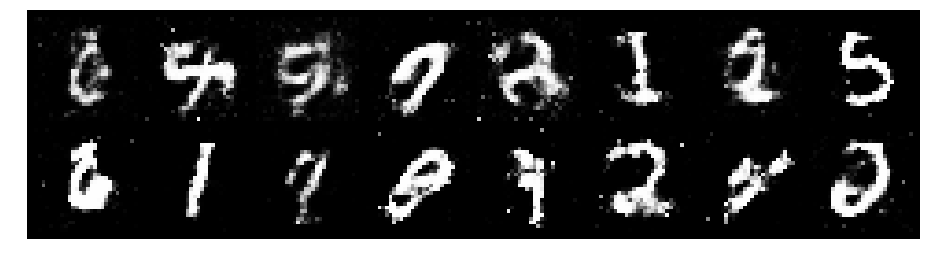

Epoch: [52/200], Batch Num: [400/600]
Discriminator Loss: 1.1015, Generator Loss: 1.0282
D(x): 0.5923, D(G(z)): 0.3897


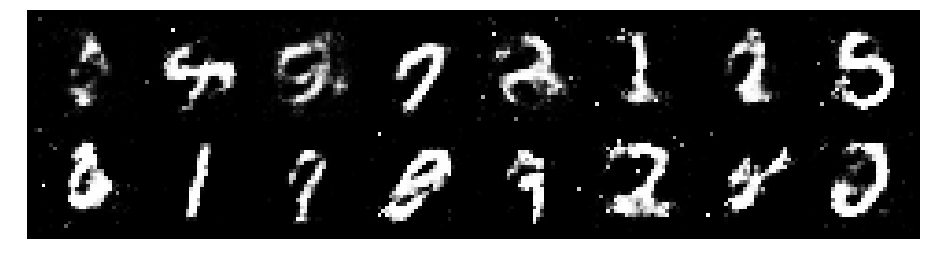

Epoch: [52/200], Batch Num: [500/600]
Discriminator Loss: 1.1381, Generator Loss: 1.2009
D(x): 0.6745, D(G(z)): 0.4296


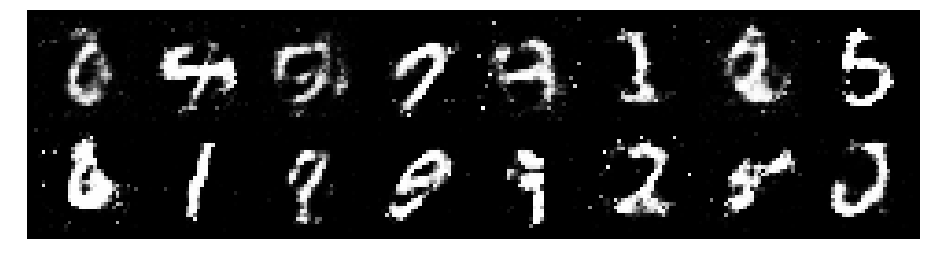

Epoch: [53/200], Batch Num: [0/600]
Discriminator Loss: 1.2785, Generator Loss: 1.1301
D(x): 0.5689, D(G(z)): 0.4076


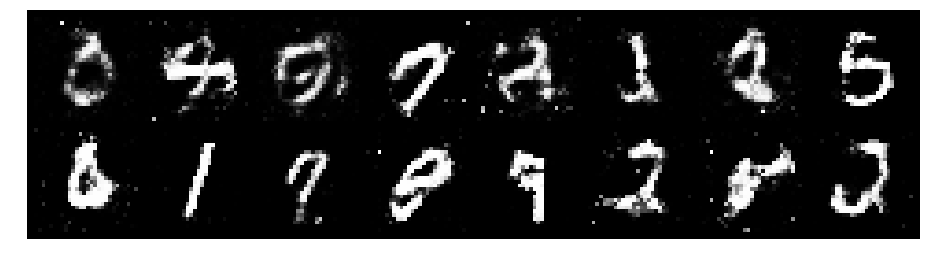

Epoch: [53/200], Batch Num: [100/600]
Discriminator Loss: 1.0352, Generator Loss: 1.1433
D(x): 0.5721, D(G(z)): 0.3119


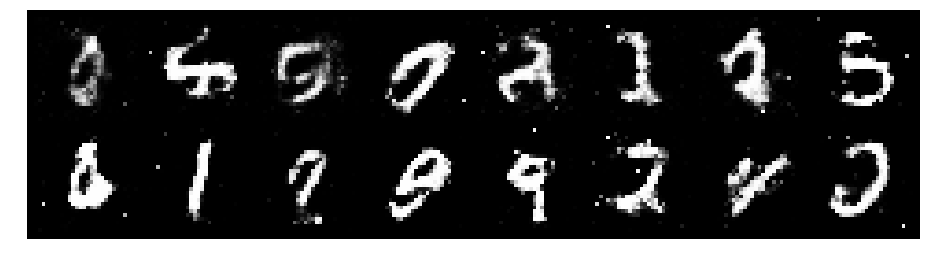

Epoch: [53/200], Batch Num: [200/600]
Discriminator Loss: 1.0347, Generator Loss: 1.0880
D(x): 0.6120, D(G(z)): 0.3574


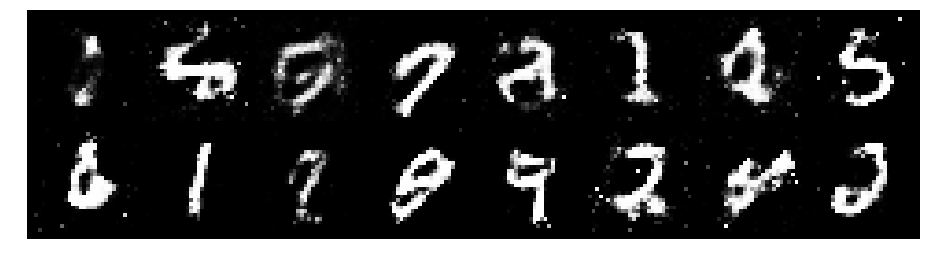

Epoch: [53/200], Batch Num: [300/600]
Discriminator Loss: 1.1866, Generator Loss: 0.9778
D(x): 0.6239, D(G(z)): 0.4468


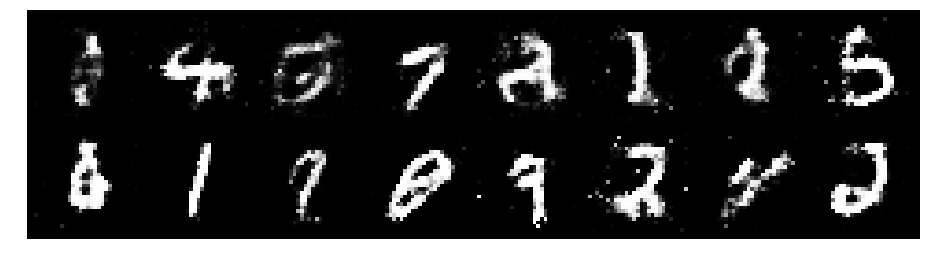

Epoch: [53/200], Batch Num: [400/600]
Discriminator Loss: 1.1073, Generator Loss: 1.1243
D(x): 0.6050, D(G(z)): 0.3808


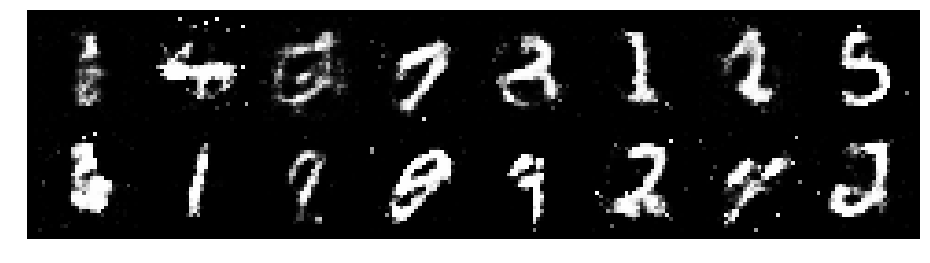

Epoch: [53/200], Batch Num: [500/600]
Discriminator Loss: 1.1200, Generator Loss: 1.0572
D(x): 0.5915, D(G(z)): 0.3885


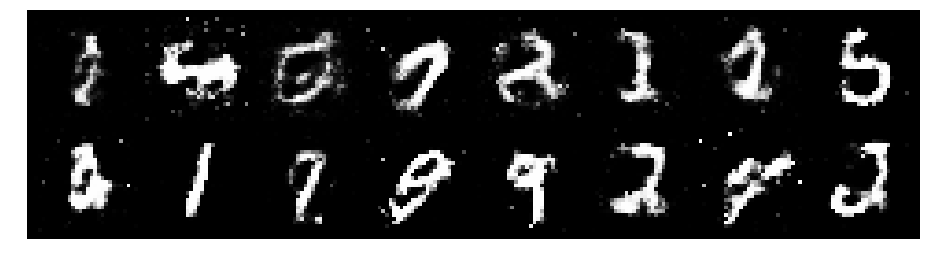

Epoch: [54/200], Batch Num: [0/600]
Discriminator Loss: 1.1640, Generator Loss: 1.0638
D(x): 0.5538, D(G(z)): 0.3573


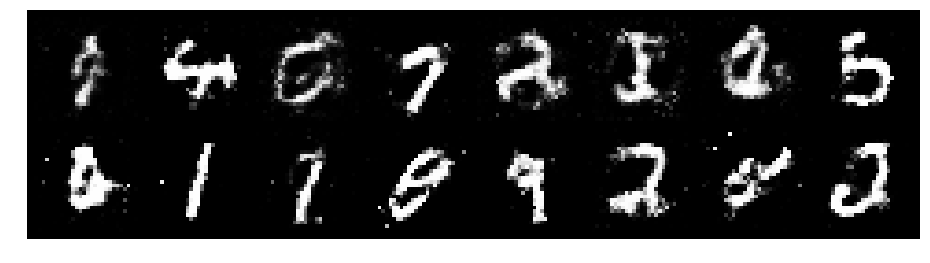

Epoch: [54/200], Batch Num: [100/600]
Discriminator Loss: 1.1427, Generator Loss: 1.2346
D(x): 0.6035, D(G(z)): 0.3887


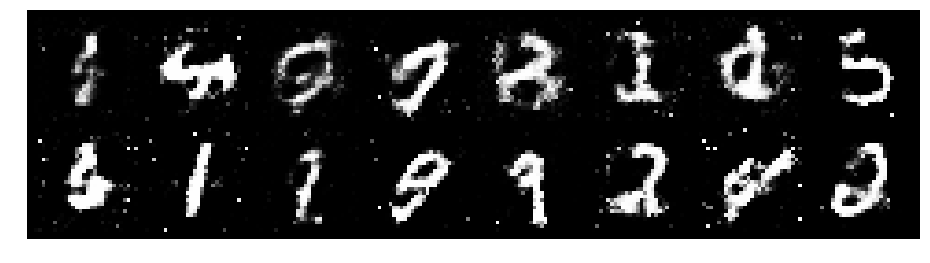

Epoch: [54/200], Batch Num: [200/600]
Discriminator Loss: 0.9464, Generator Loss: 1.3439
D(x): 0.6338, D(G(z)): 0.3138


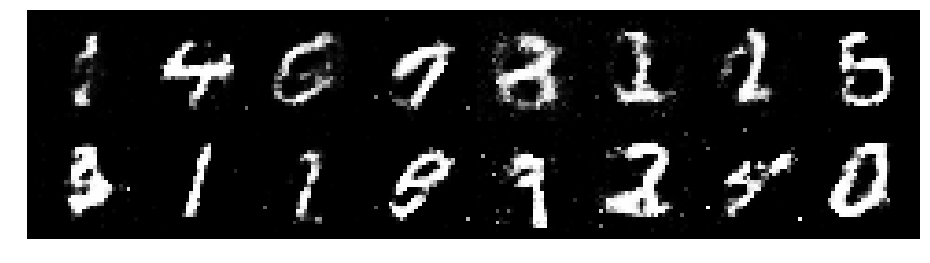

Epoch: [54/200], Batch Num: [300/600]
Discriminator Loss: 1.0319, Generator Loss: 1.4131
D(x): 0.6645, D(G(z)): 0.3731


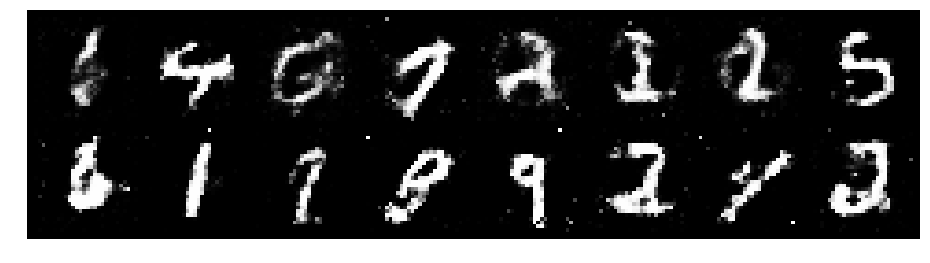

Epoch: [54/200], Batch Num: [400/600]
Discriminator Loss: 1.1163, Generator Loss: 1.3573
D(x): 0.6215, D(G(z)): 0.3808


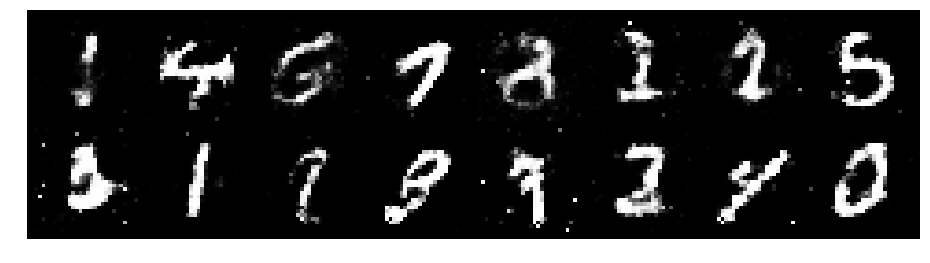

Epoch: [54/200], Batch Num: [500/600]
Discriminator Loss: 1.2449, Generator Loss: 1.0772
D(x): 0.5966, D(G(z)): 0.4206


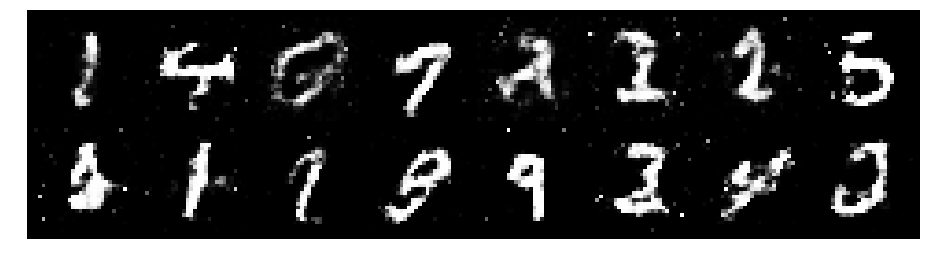

Epoch: [55/200], Batch Num: [0/600]
Discriminator Loss: 1.2753, Generator Loss: 1.0812
D(x): 0.5517, D(G(z)): 0.3947


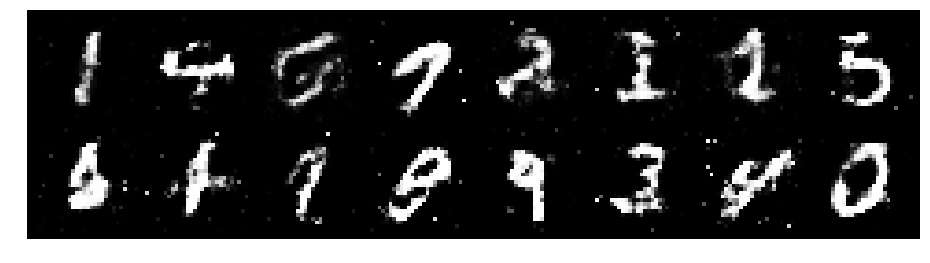

Epoch: [55/200], Batch Num: [100/600]
Discriminator Loss: 1.0797, Generator Loss: 1.1293
D(x): 0.5502, D(G(z)): 0.3095


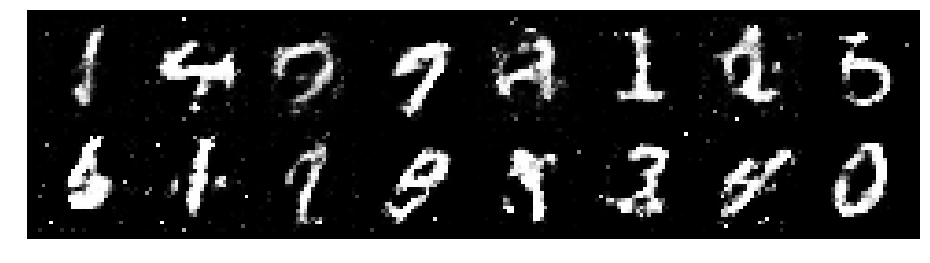

Epoch: [55/200], Batch Num: [200/600]
Discriminator Loss: 1.1331, Generator Loss: 0.9086
D(x): 0.5814, D(G(z)): 0.4036


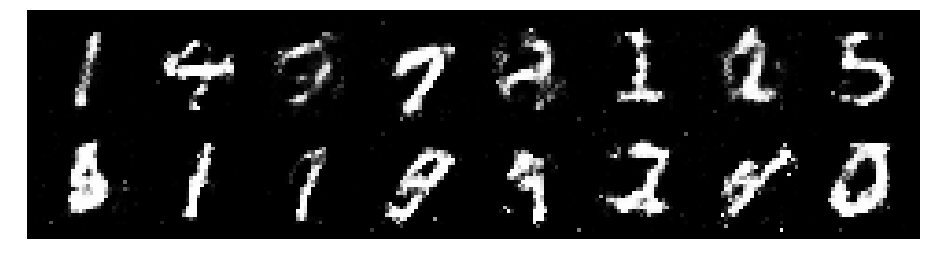

Epoch: [55/200], Batch Num: [300/600]
Discriminator Loss: 1.0944, Generator Loss: 1.1469
D(x): 0.5731, D(G(z)): 0.3410


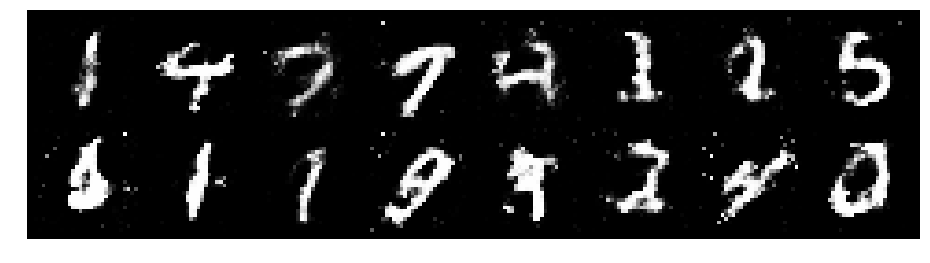

Epoch: [55/200], Batch Num: [400/600]
Discriminator Loss: 1.0543, Generator Loss: 1.2205
D(x): 0.5993, D(G(z)): 0.3509


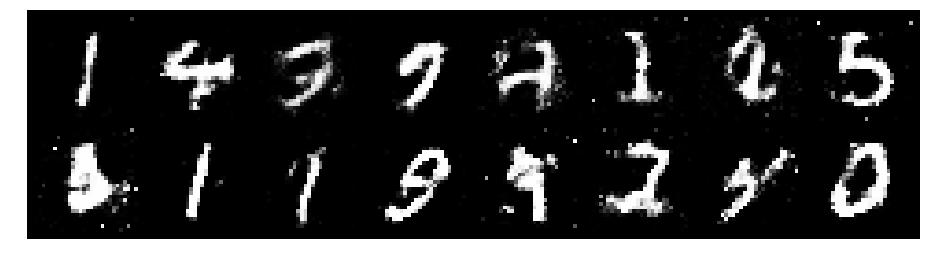

Epoch: [55/200], Batch Num: [500/600]
Discriminator Loss: 1.2104, Generator Loss: 1.0278
D(x): 0.5915, D(G(z)): 0.4345


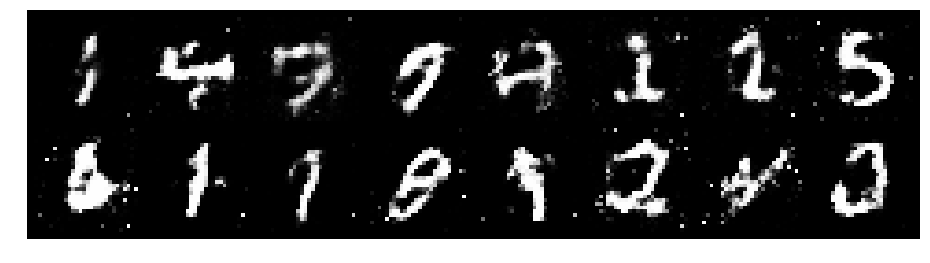

Epoch: [56/200], Batch Num: [0/600]
Discriminator Loss: 1.0053, Generator Loss: 1.1807
D(x): 0.6146, D(G(z)): 0.3468


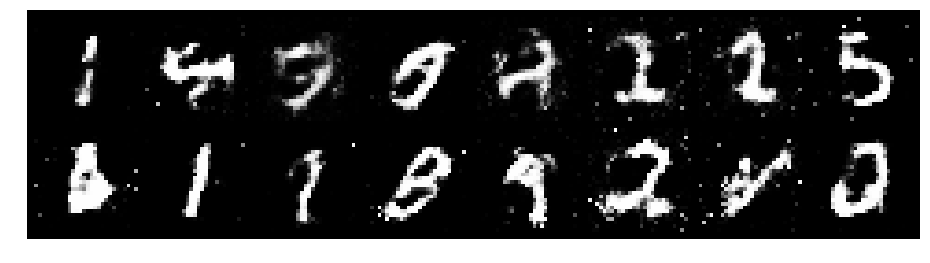

Epoch: [56/200], Batch Num: [100/600]
Discriminator Loss: 1.0990, Generator Loss: 0.9701
D(x): 0.6175, D(G(z)): 0.3997


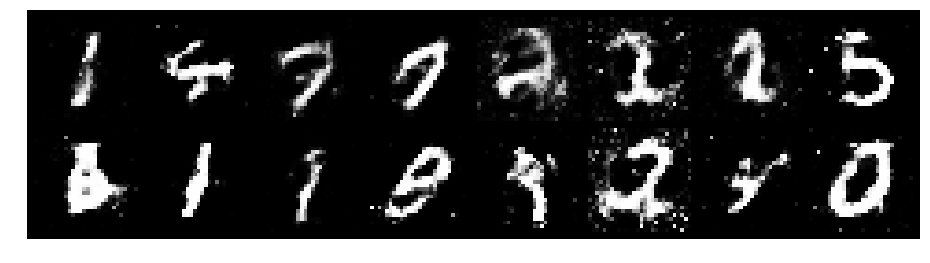

Epoch: [56/200], Batch Num: [200/600]
Discriminator Loss: 1.0931, Generator Loss: 1.1742
D(x): 0.6511, D(G(z)): 0.3687


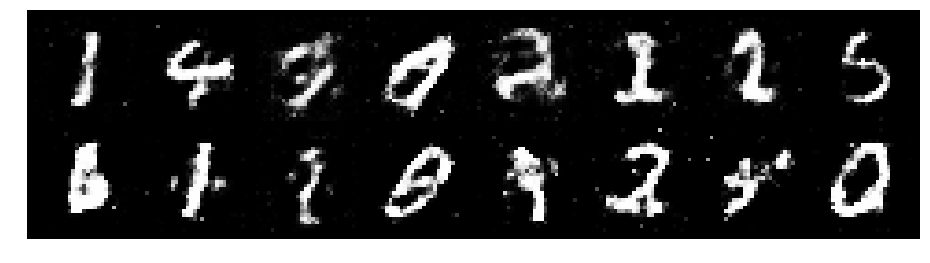

Epoch: [56/200], Batch Num: [300/600]
Discriminator Loss: 1.1667, Generator Loss: 1.0219
D(x): 0.6042, D(G(z)): 0.4154


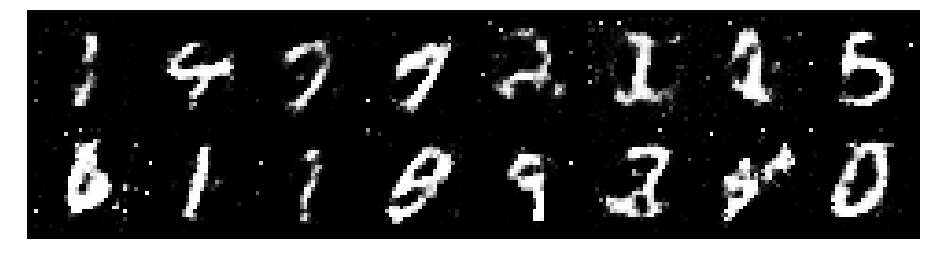

Epoch: [56/200], Batch Num: [400/600]
Discriminator Loss: 1.1116, Generator Loss: 1.1415
D(x): 0.6349, D(G(z)): 0.3923


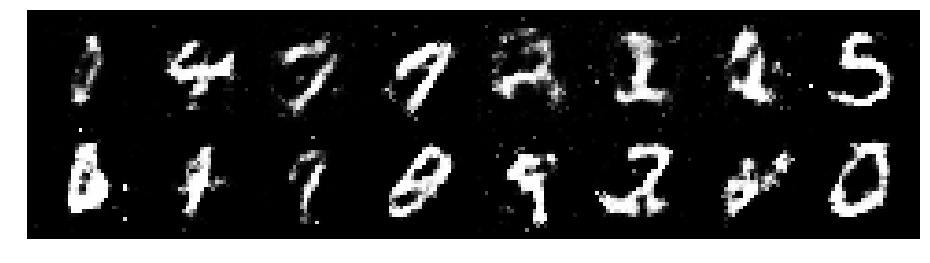

Epoch: [56/200], Batch Num: [500/600]
Discriminator Loss: 1.3031, Generator Loss: 0.9136
D(x): 0.6080, D(G(z)): 0.4668


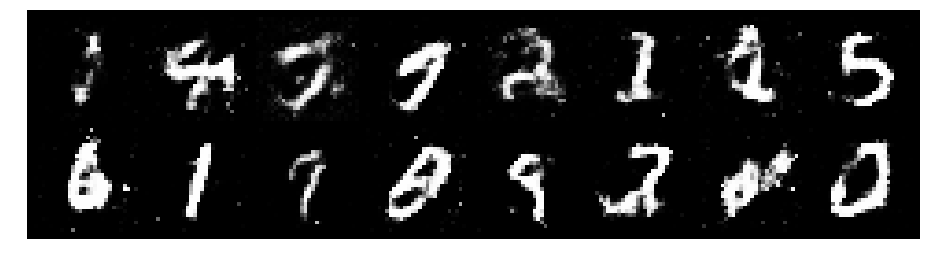

Epoch: [57/200], Batch Num: [0/600]
Discriminator Loss: 1.3801, Generator Loss: 0.8904
D(x): 0.5085, D(G(z)): 0.4253


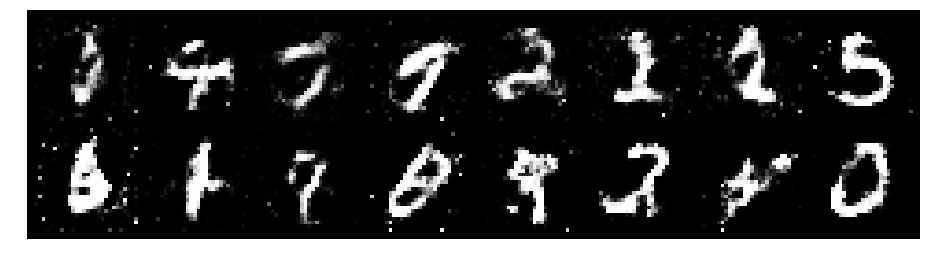

Epoch: [57/200], Batch Num: [100/600]
Discriminator Loss: 1.5026, Generator Loss: 0.8609
D(x): 0.5482, D(G(z)): 0.4836


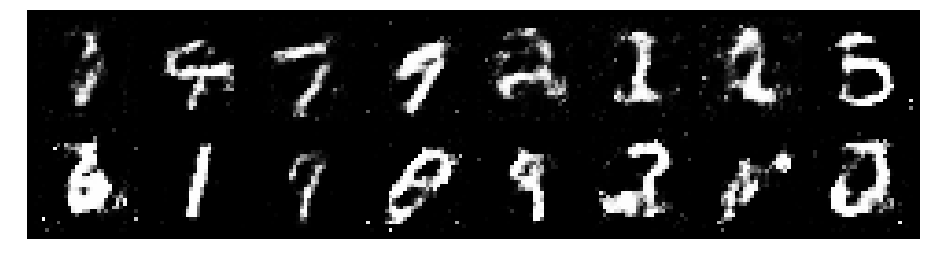

Epoch: [57/200], Batch Num: [200/600]
Discriminator Loss: 1.1945, Generator Loss: 1.1512
D(x): 0.6234, D(G(z)): 0.4159


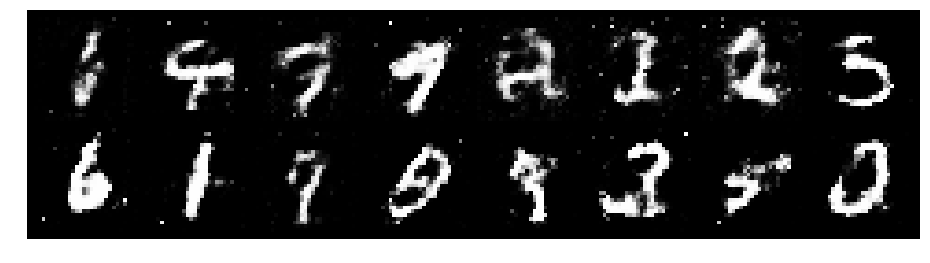

Epoch: [57/200], Batch Num: [300/600]
Discriminator Loss: 1.1615, Generator Loss: 0.8910
D(x): 0.5879, D(G(z)): 0.3984


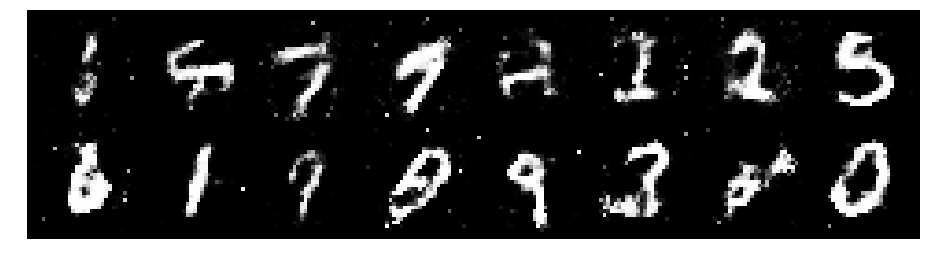

Epoch: [57/200], Batch Num: [400/600]
Discriminator Loss: 1.0560, Generator Loss: 1.1264
D(x): 0.6173, D(G(z)): 0.3447


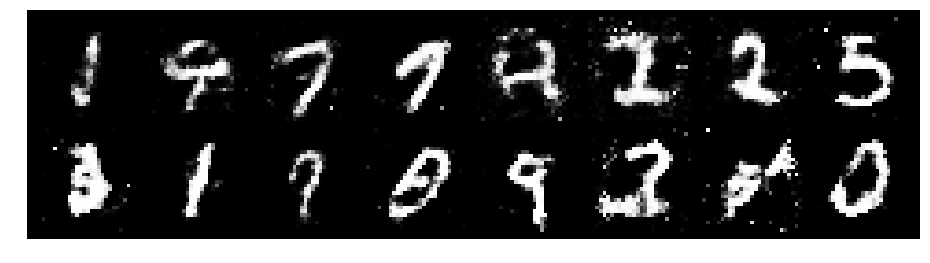

Epoch: [57/200], Batch Num: [500/600]
Discriminator Loss: 1.2934, Generator Loss: 0.9476
D(x): 0.5858, D(G(z)): 0.4268


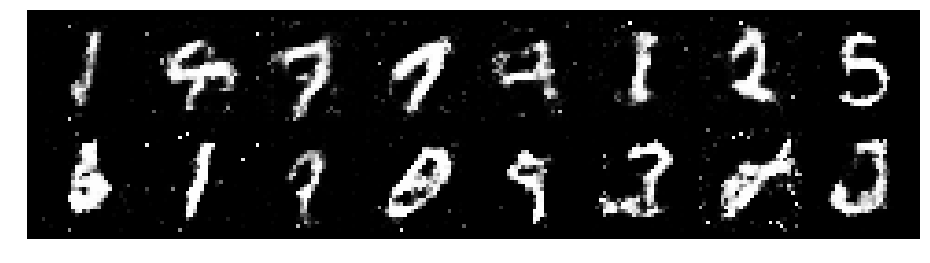

Epoch: [58/200], Batch Num: [0/600]
Discriminator Loss: 1.4210, Generator Loss: 1.0110
D(x): 0.5269, D(G(z)): 0.4335


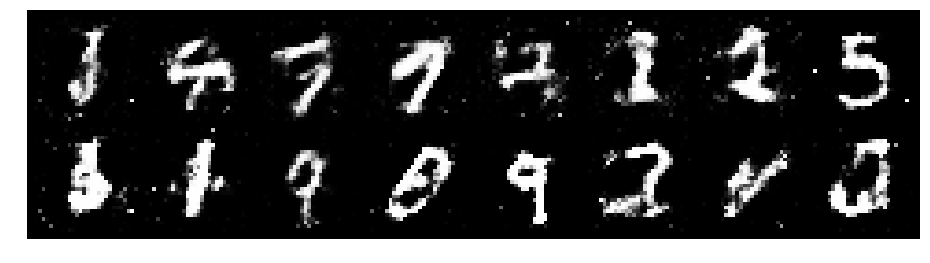

Epoch: [58/200], Batch Num: [100/600]
Discriminator Loss: 1.3219, Generator Loss: 0.9139
D(x): 0.5775, D(G(z)): 0.4578


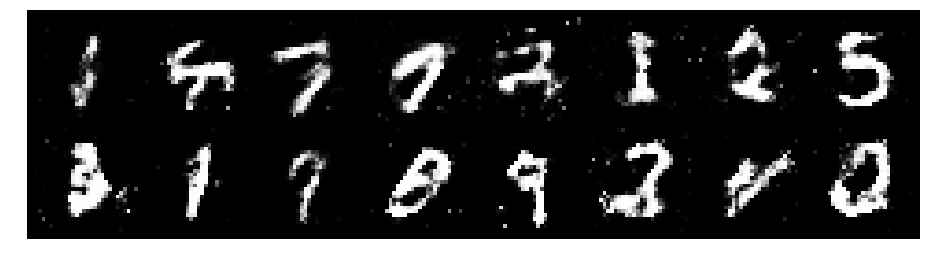

Epoch: [58/200], Batch Num: [200/600]
Discriminator Loss: 1.2609, Generator Loss: 0.8807
D(x): 0.6507, D(G(z)): 0.4837


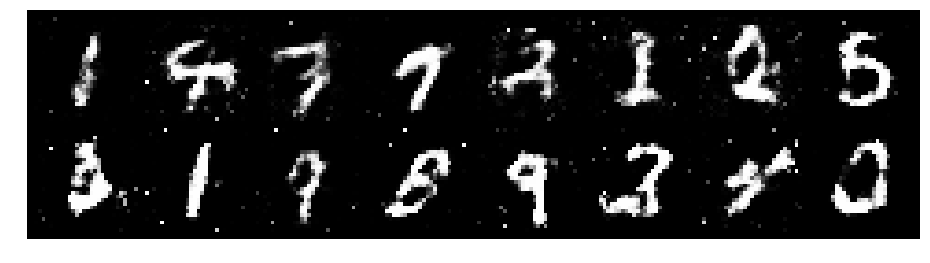

Epoch: [58/200], Batch Num: [300/600]
Discriminator Loss: 1.2615, Generator Loss: 0.8891
D(x): 0.5873, D(G(z)): 0.4447


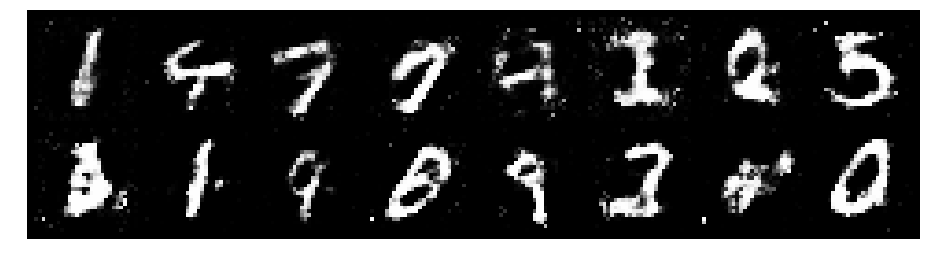

Epoch: [58/200], Batch Num: [400/600]
Discriminator Loss: 1.2959, Generator Loss: 0.9608
D(x): 0.5287, D(G(z)): 0.3918


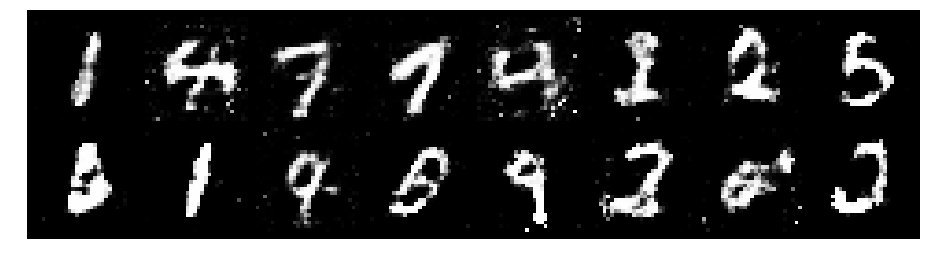

Epoch: [58/200], Batch Num: [500/600]
Discriminator Loss: 1.3802, Generator Loss: 1.0389
D(x): 0.5686, D(G(z)): 0.4540


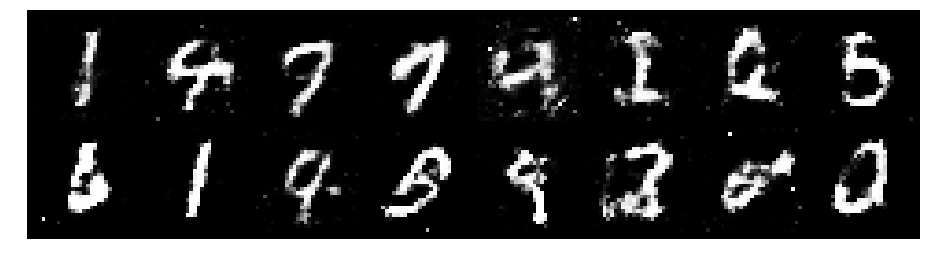

Epoch: [59/200], Batch Num: [0/600]
Discriminator Loss: 1.3245, Generator Loss: 0.8356
D(x): 0.5791, D(G(z)): 0.4741


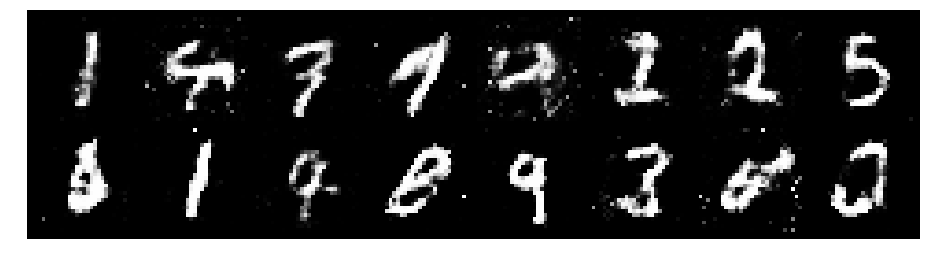

Epoch: [59/200], Batch Num: [100/600]
Discriminator Loss: 1.1982, Generator Loss: 1.0783
D(x): 0.6088, D(G(z)): 0.4327


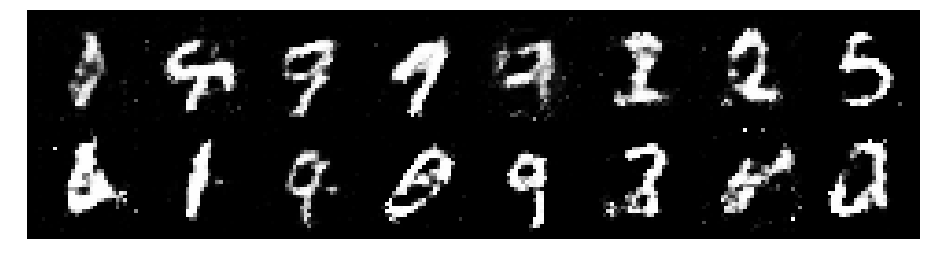

Epoch: [59/200], Batch Num: [200/600]
Discriminator Loss: 1.2337, Generator Loss: 0.9436
D(x): 0.5819, D(G(z)): 0.4388


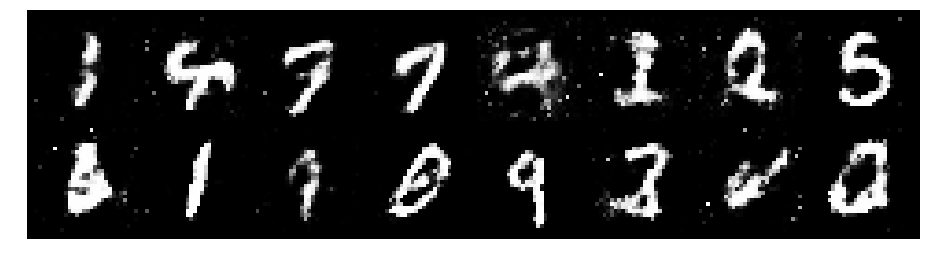

Epoch: [59/200], Batch Num: [300/600]
Discriminator Loss: 1.1985, Generator Loss: 1.0024
D(x): 0.5892, D(G(z)): 0.3995


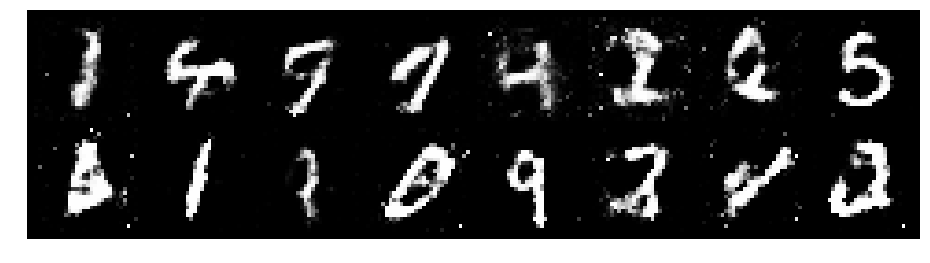

Epoch: [59/200], Batch Num: [400/600]
Discriminator Loss: 1.1299, Generator Loss: 0.9970
D(x): 0.6084, D(G(z)): 0.3927


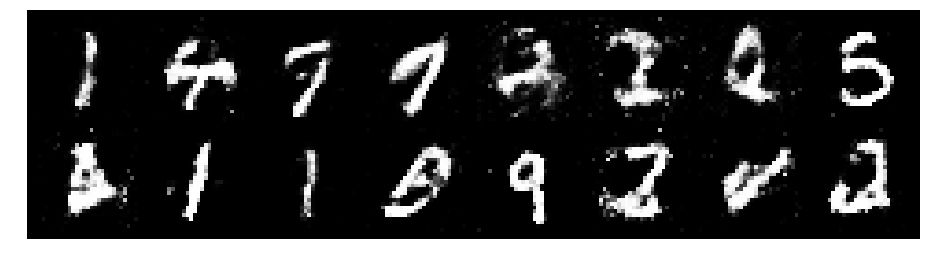

Epoch: [59/200], Batch Num: [500/600]
Discriminator Loss: 1.3083, Generator Loss: 0.8930
D(x): 0.6357, D(G(z)): 0.4875


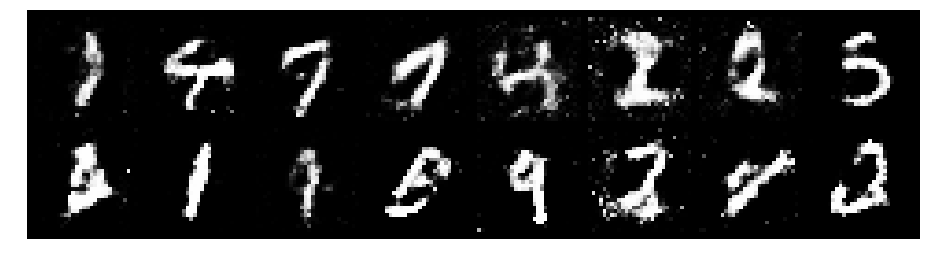

Epoch: [60/200], Batch Num: [0/600]
Discriminator Loss: 1.0492, Generator Loss: 1.0757
D(x): 0.6111, D(G(z)): 0.3495


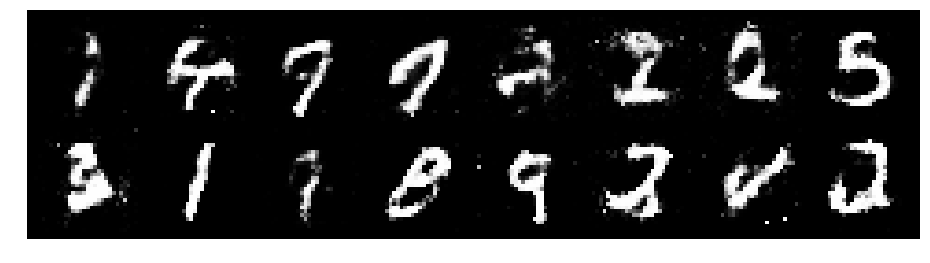

Epoch: [60/200], Batch Num: [100/600]
Discriminator Loss: 1.2646, Generator Loss: 1.1450
D(x): 0.5660, D(G(z)): 0.4037


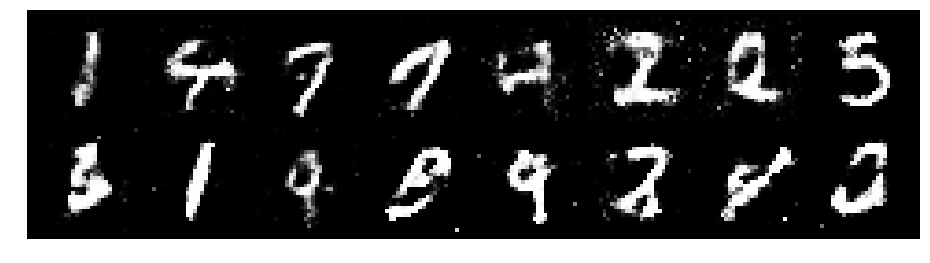

Epoch: [60/200], Batch Num: [200/600]
Discriminator Loss: 1.1128, Generator Loss: 1.0950
D(x): 0.6298, D(G(z)): 0.3775


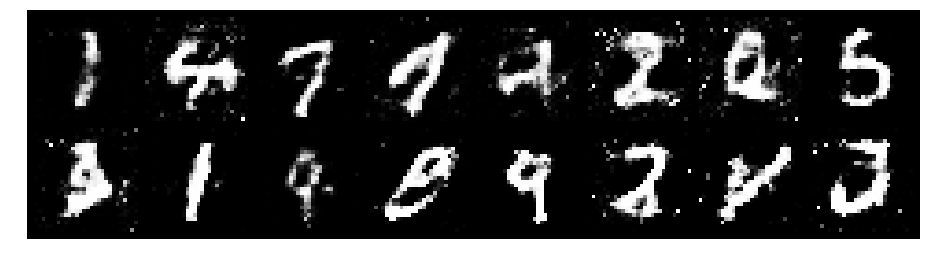

Epoch: [60/200], Batch Num: [300/600]
Discriminator Loss: 1.1618, Generator Loss: 1.0455
D(x): 0.6334, D(G(z)): 0.4033


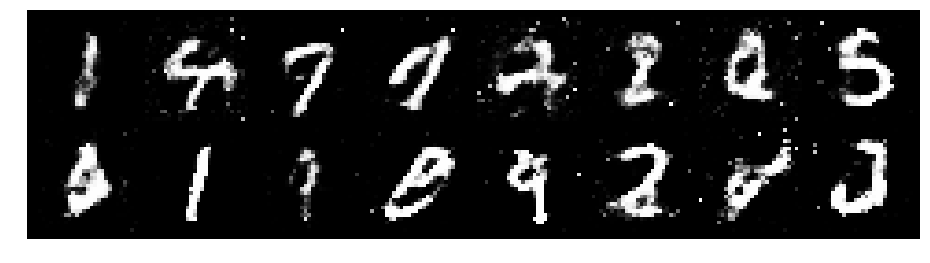

Epoch: [60/200], Batch Num: [400/600]
Discriminator Loss: 1.0253, Generator Loss: 1.2659
D(x): 0.6230, D(G(z)): 0.3361


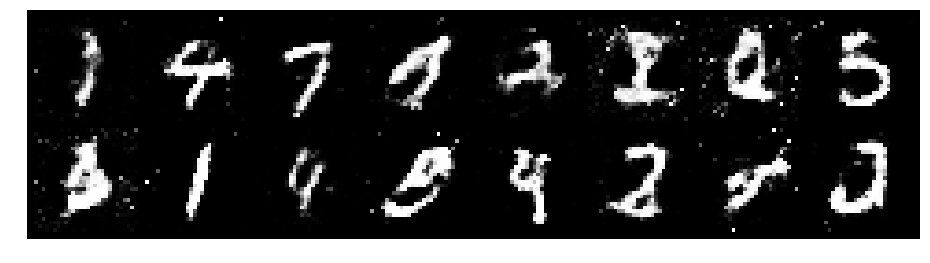

Epoch: [60/200], Batch Num: [500/600]
Discriminator Loss: 1.2194, Generator Loss: 1.1134
D(x): 0.5942, D(G(z)): 0.4185


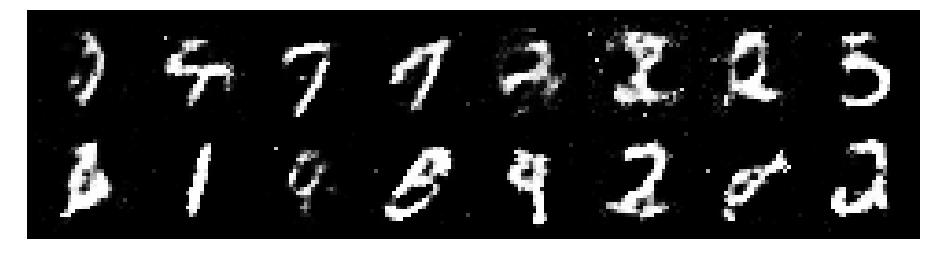

Epoch: [61/200], Batch Num: [0/600]
Discriminator Loss: 1.4330, Generator Loss: 1.0253
D(x): 0.4791, D(G(z)): 0.3877


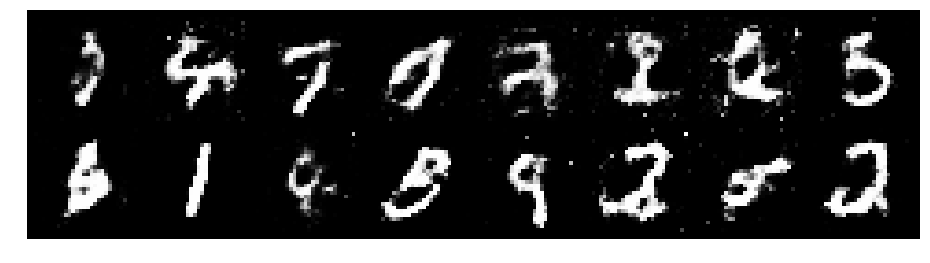

Epoch: [61/200], Batch Num: [100/600]
Discriminator Loss: 1.2069, Generator Loss: 0.8884
D(x): 0.6010, D(G(z)): 0.4283


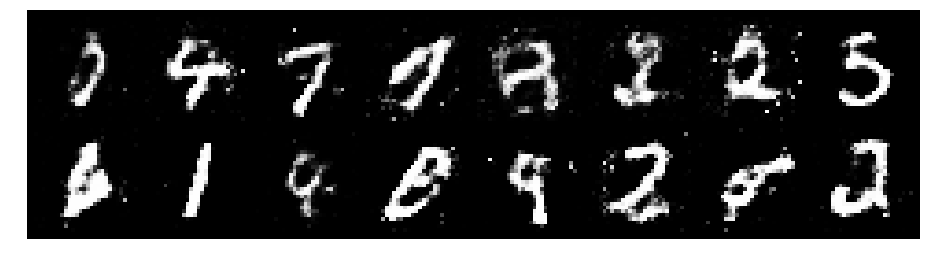

Epoch: [61/200], Batch Num: [200/600]
Discriminator Loss: 1.2825, Generator Loss: 0.9378
D(x): 0.5794, D(G(z)): 0.4580


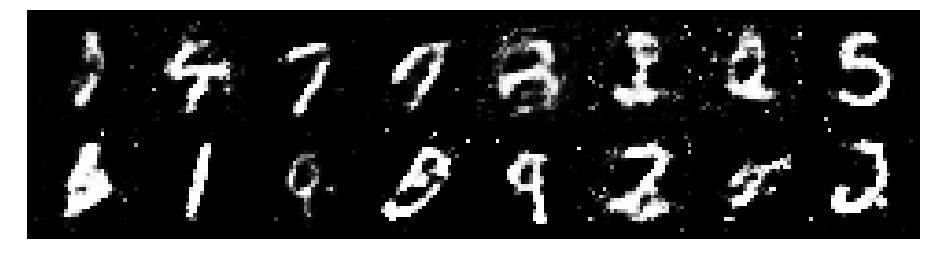

Epoch: [61/200], Batch Num: [300/600]
Discriminator Loss: 1.2337, Generator Loss: 1.0372
D(x): 0.5924, D(G(z)): 0.4321


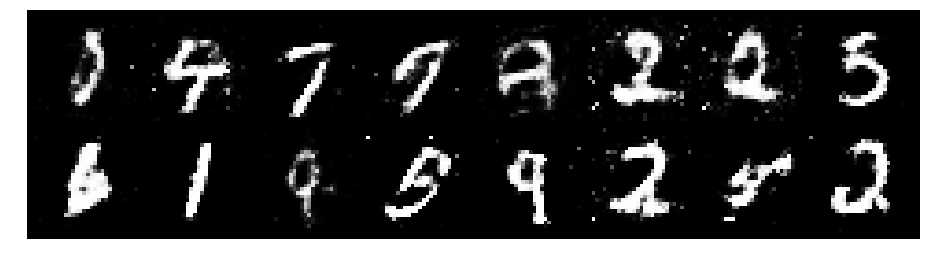

Epoch: [61/200], Batch Num: [400/600]
Discriminator Loss: 1.2617, Generator Loss: 0.9981
D(x): 0.5546, D(G(z)): 0.4119


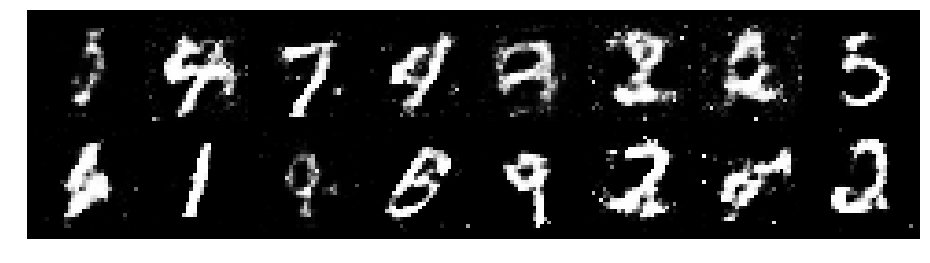

Epoch: [61/200], Batch Num: [500/600]
Discriminator Loss: 1.3339, Generator Loss: 0.8663
D(x): 0.5605, D(G(z)): 0.4620


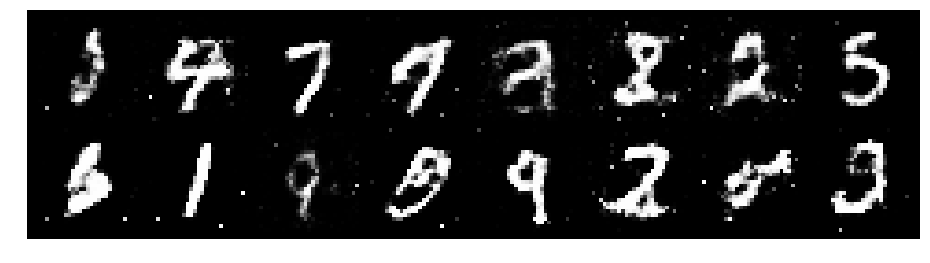

Epoch: [62/200], Batch Num: [0/600]
Discriminator Loss: 1.3020, Generator Loss: 0.8544
D(x): 0.6181, D(G(z)): 0.4960


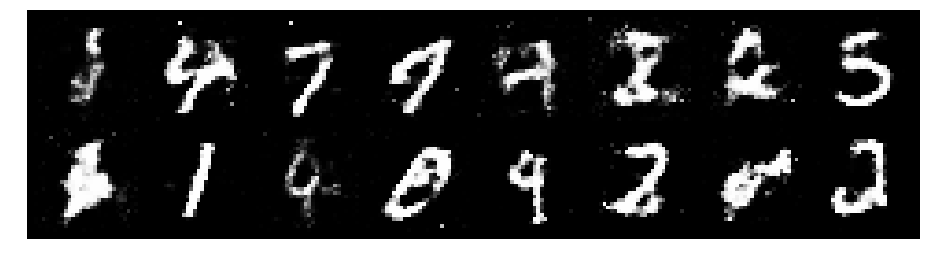

Epoch: [62/200], Batch Num: [100/600]
Discriminator Loss: 1.2610, Generator Loss: 0.8776
D(x): 0.6017, D(G(z)): 0.4632


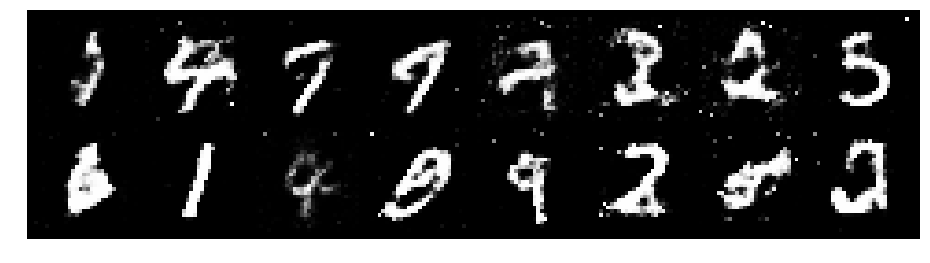

Epoch: [62/200], Batch Num: [200/600]
Discriminator Loss: 1.2285, Generator Loss: 1.0000
D(x): 0.5685, D(G(z)): 0.3940


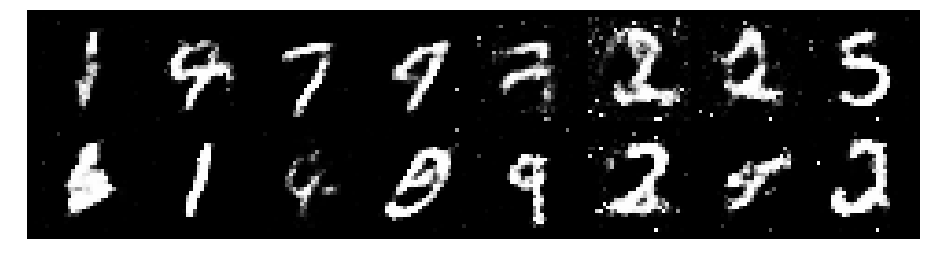

Epoch: [62/200], Batch Num: [300/600]
Discriminator Loss: 1.2811, Generator Loss: 0.8700
D(x): 0.5832, D(G(z)): 0.4633


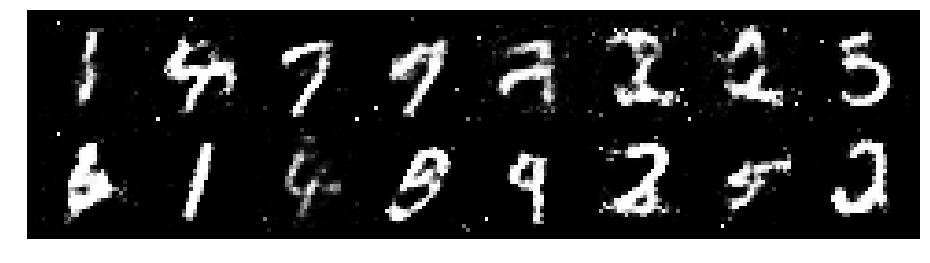

Epoch: [62/200], Batch Num: [400/600]
Discriminator Loss: 1.2309, Generator Loss: 0.8806
D(x): 0.5658, D(G(z)): 0.4219


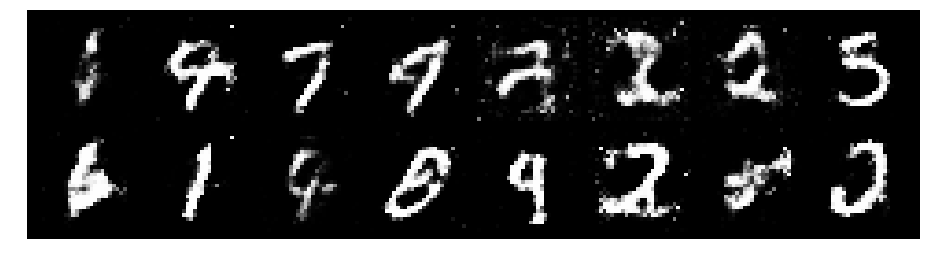

Epoch: [62/200], Batch Num: [500/600]
Discriminator Loss: 1.1068, Generator Loss: 1.0171
D(x): 0.5827, D(G(z)): 0.3902


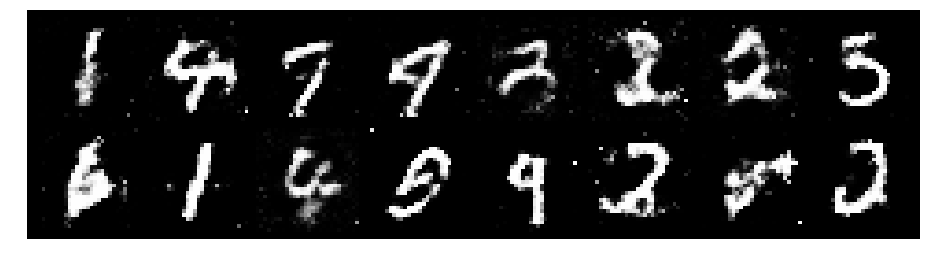

Epoch: [63/200], Batch Num: [0/600]
Discriminator Loss: 1.3500, Generator Loss: 0.9474
D(x): 0.5454, D(G(z)): 0.4243


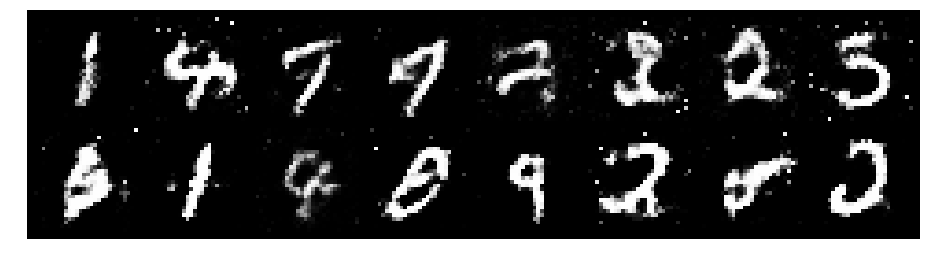

Epoch: [63/200], Batch Num: [100/600]
Discriminator Loss: 1.2296, Generator Loss: 1.0348
D(x): 0.5796, D(G(z)): 0.4096


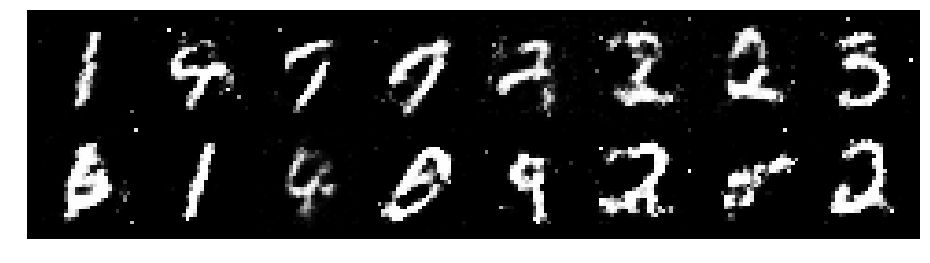

Epoch: [63/200], Batch Num: [200/600]
Discriminator Loss: 1.0942, Generator Loss: 1.1146
D(x): 0.6215, D(G(z)): 0.3702


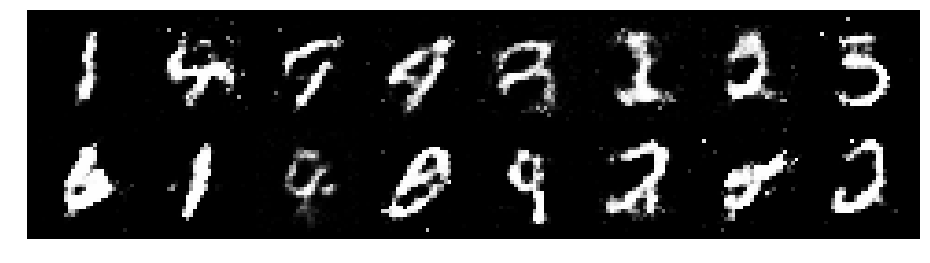

Epoch: [63/200], Batch Num: [300/600]
Discriminator Loss: 1.1981, Generator Loss: 0.8353
D(x): 0.6485, D(G(z)): 0.4620


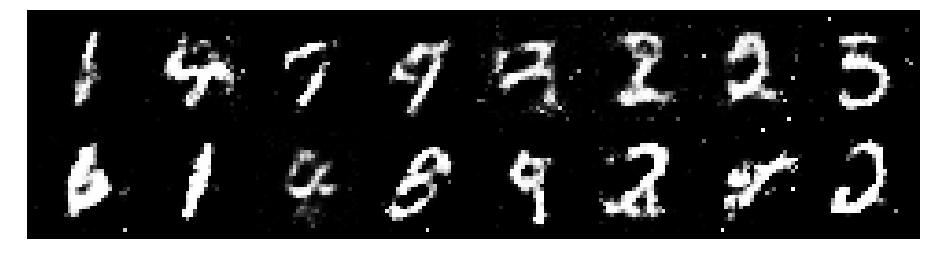

Epoch: [63/200], Batch Num: [400/600]
Discriminator Loss: 1.3927, Generator Loss: 1.0545
D(x): 0.5769, D(G(z)): 0.4700


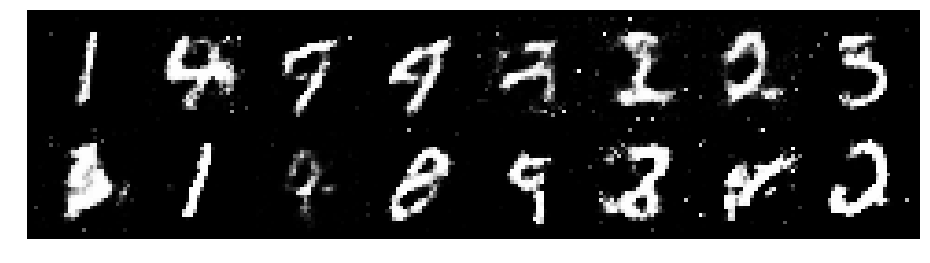

Epoch: [63/200], Batch Num: [500/600]
Discriminator Loss: 1.3181, Generator Loss: 0.9219
D(x): 0.5620, D(G(z)): 0.4624


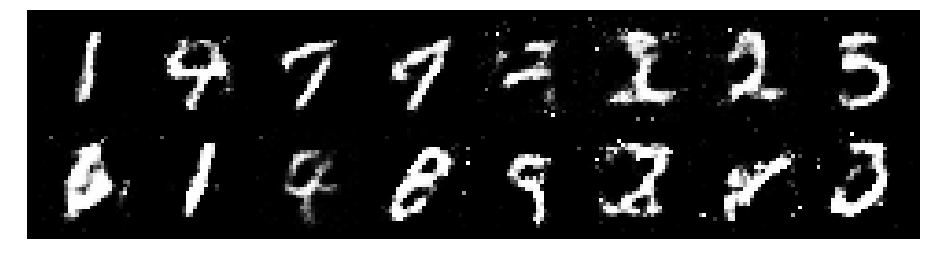

Epoch: [64/200], Batch Num: [0/600]
Discriminator Loss: 1.2229, Generator Loss: 1.0068
D(x): 0.5634, D(G(z)): 0.4224


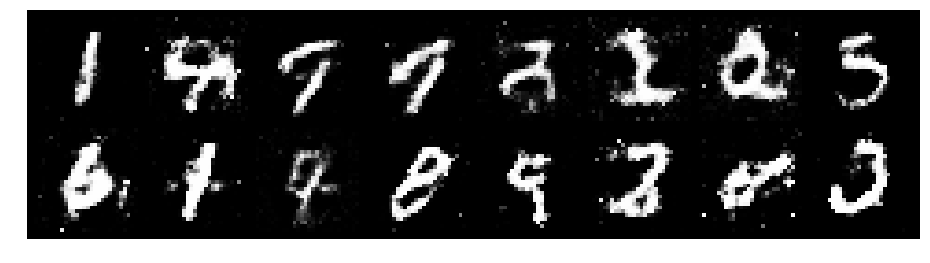

Epoch: [64/200], Batch Num: [100/600]
Discriminator Loss: 1.1546, Generator Loss: 1.0050
D(x): 0.6133, D(G(z)): 0.4091


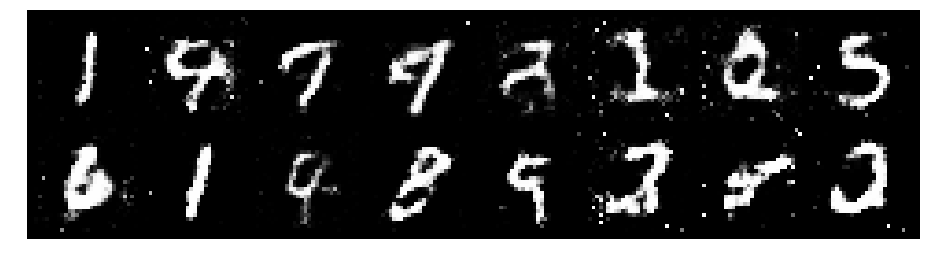

Epoch: [64/200], Batch Num: [200/600]
Discriminator Loss: 1.2159, Generator Loss: 1.1232
D(x): 0.5232, D(G(z)): 0.3589


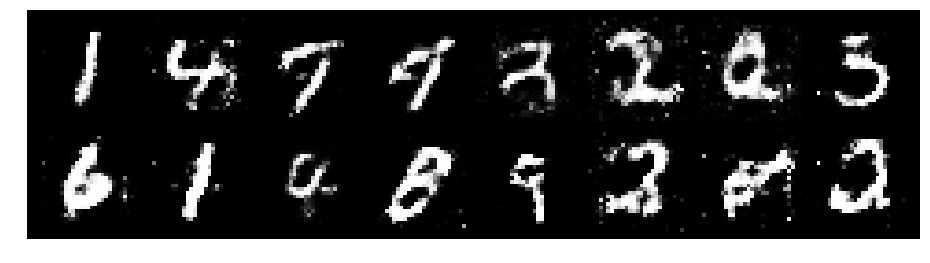

Epoch: [64/200], Batch Num: [300/600]
Discriminator Loss: 1.2169, Generator Loss: 1.0180
D(x): 0.6037, D(G(z)): 0.4448


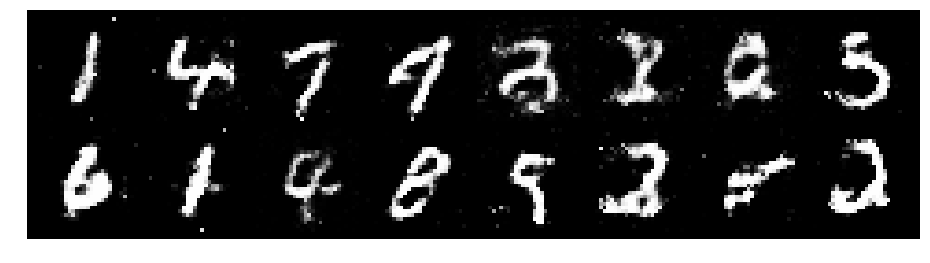

Epoch: [64/200], Batch Num: [400/600]
Discriminator Loss: 1.1688, Generator Loss: 1.1069
D(x): 0.5755, D(G(z)): 0.3876


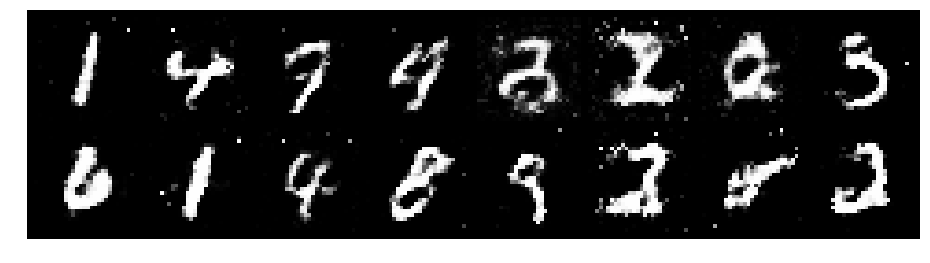

Epoch: [64/200], Batch Num: [500/600]
Discriminator Loss: 1.0572, Generator Loss: 1.2755
D(x): 0.5775, D(G(z)): 0.3367


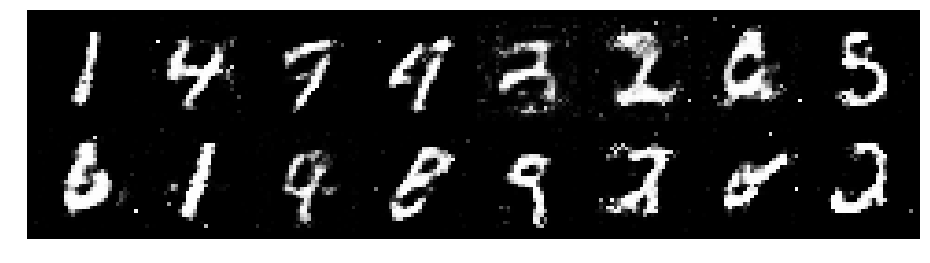

Epoch: [65/200], Batch Num: [0/600]
Discriminator Loss: 1.2301, Generator Loss: 1.0185
D(x): 0.5941, D(G(z)): 0.4258


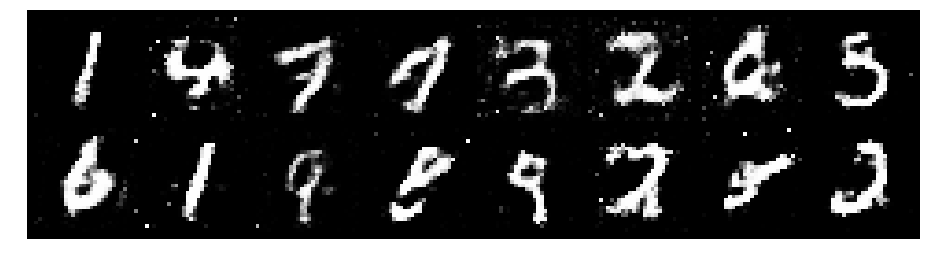

Epoch: [65/200], Batch Num: [100/600]
Discriminator Loss: 1.1554, Generator Loss: 0.9613
D(x): 0.6226, D(G(z)): 0.4231


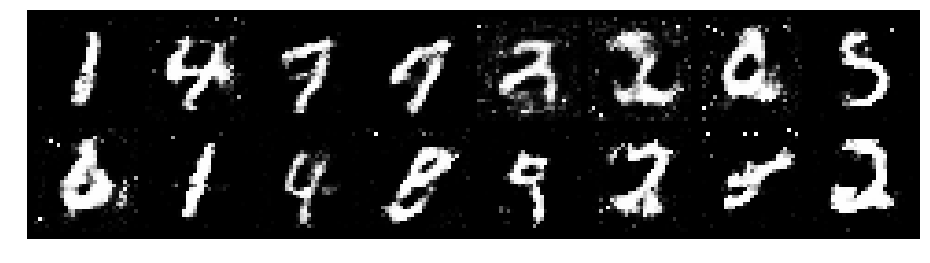

Epoch: [65/200], Batch Num: [200/600]
Discriminator Loss: 1.1679, Generator Loss: 0.9642
D(x): 0.6263, D(G(z)): 0.4426


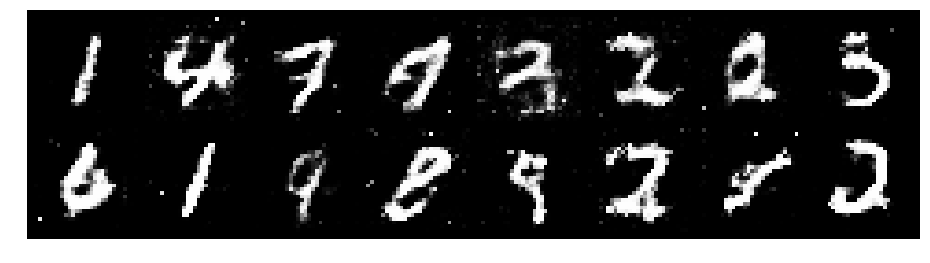

Epoch: [65/200], Batch Num: [300/600]
Discriminator Loss: 1.1416, Generator Loss: 1.0162
D(x): 0.5771, D(G(z)): 0.3960


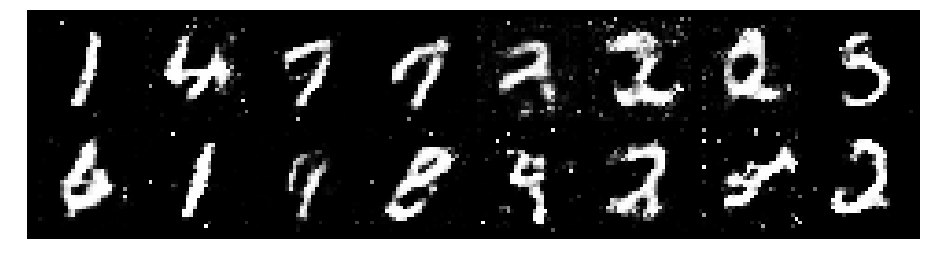

Epoch: [65/200], Batch Num: [400/600]
Discriminator Loss: 1.1690, Generator Loss: 1.0916
D(x): 0.5333, D(G(z)): 0.3542


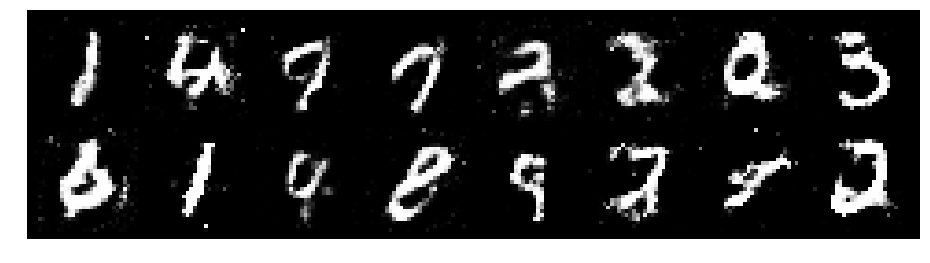

Epoch: [65/200], Batch Num: [500/600]
Discriminator Loss: 1.2335, Generator Loss: 0.9770
D(x): 0.5951, D(G(z)): 0.4365


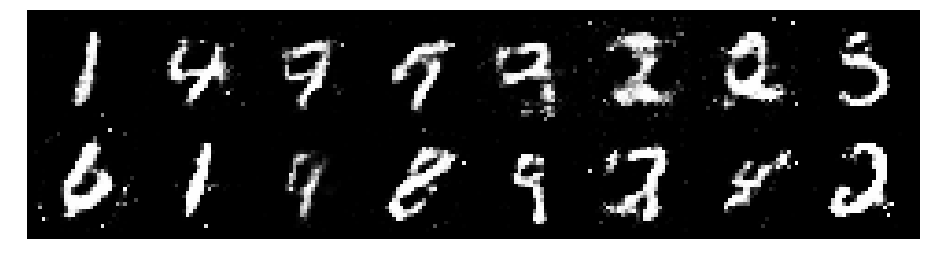

Epoch: [66/200], Batch Num: [0/600]
Discriminator Loss: 1.3005, Generator Loss: 0.9754
D(x): 0.5489, D(G(z)): 0.4078


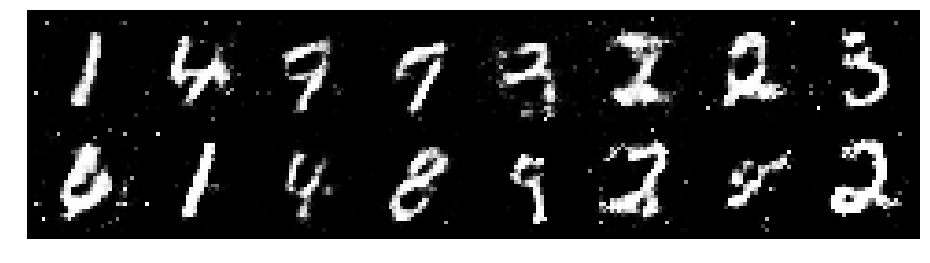

Epoch: [66/200], Batch Num: [100/600]
Discriminator Loss: 1.3077, Generator Loss: 0.8276
D(x): 0.5985, D(G(z)): 0.4886


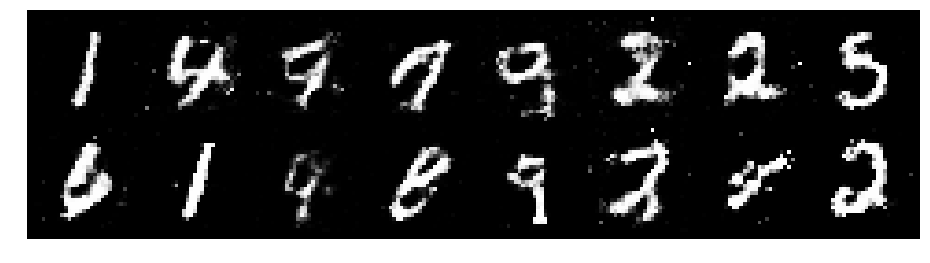

Epoch: [66/200], Batch Num: [200/600]
Discriminator Loss: 1.2095, Generator Loss: 0.8681
D(x): 0.5691, D(G(z)): 0.4363


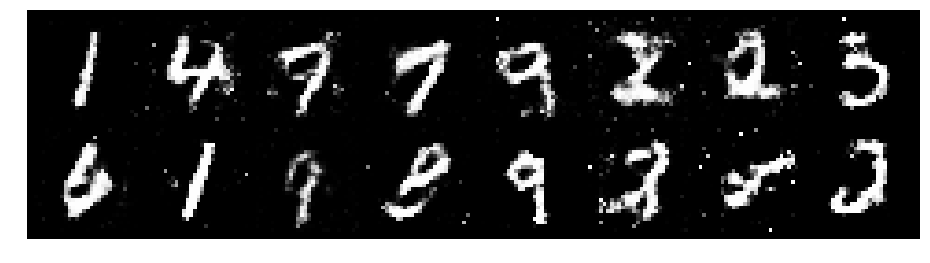

Epoch: [66/200], Batch Num: [300/600]
Discriminator Loss: 1.3171, Generator Loss: 0.9265
D(x): 0.5118, D(G(z)): 0.4209


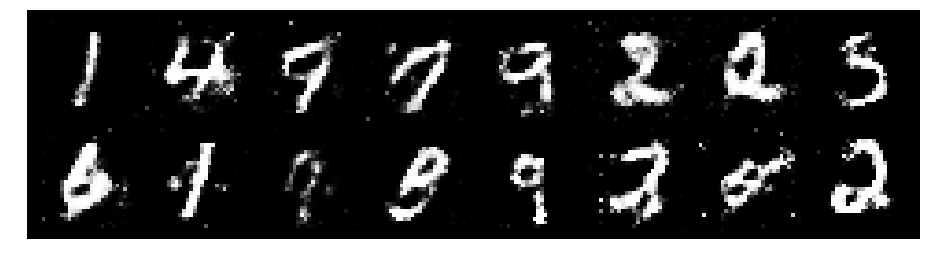

Epoch: [66/200], Batch Num: [400/600]
Discriminator Loss: 1.2797, Generator Loss: 0.7847
D(x): 0.5482, D(G(z)): 0.4408


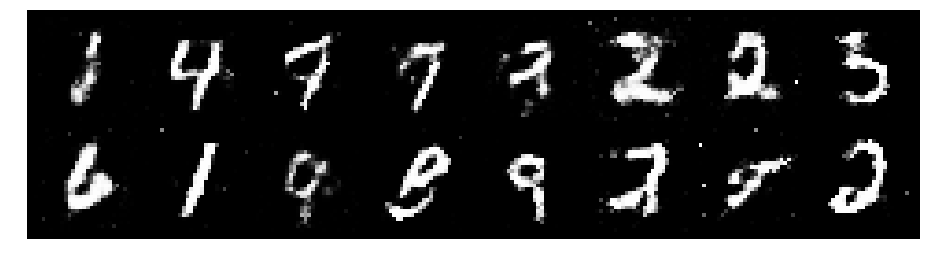

Epoch: [66/200], Batch Num: [500/600]
Discriminator Loss: 1.1959, Generator Loss: 0.8709
D(x): 0.5734, D(G(z)): 0.4243


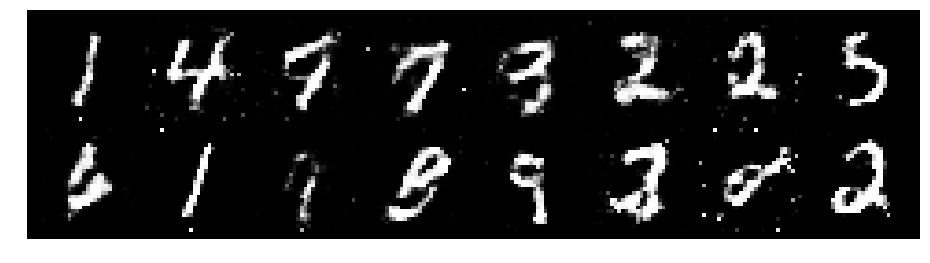

Epoch: [67/200], Batch Num: [0/600]
Discriminator Loss: 1.2958, Generator Loss: 0.8591
D(x): 0.5690, D(G(z)): 0.4612


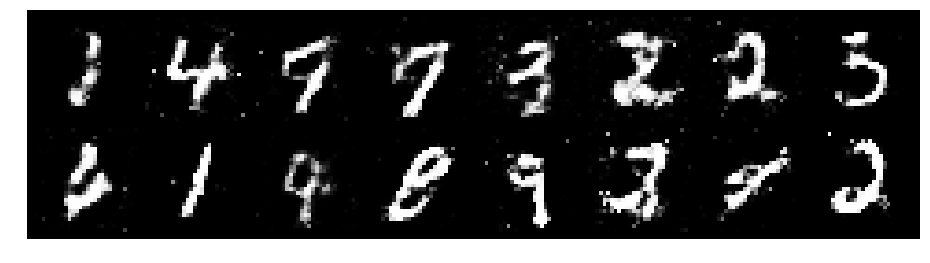

Epoch: [67/200], Batch Num: [100/600]
Discriminator Loss: 1.2063, Generator Loss: 0.8908
D(x): 0.5556, D(G(z)): 0.4156


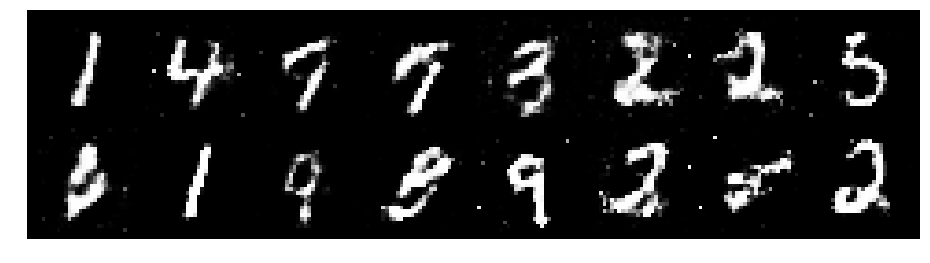

Epoch: [67/200], Batch Num: [200/600]
Discriminator Loss: 1.2288, Generator Loss: 0.9079
D(x): 0.5756, D(G(z)): 0.4358


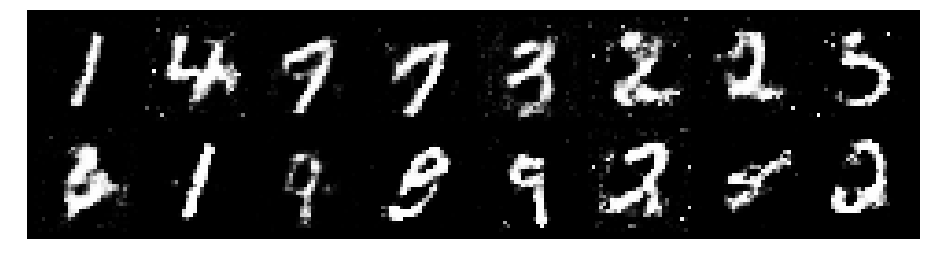

Epoch: [67/200], Batch Num: [300/600]
Discriminator Loss: 1.3226, Generator Loss: 0.9882
D(x): 0.5318, D(G(z)): 0.4440


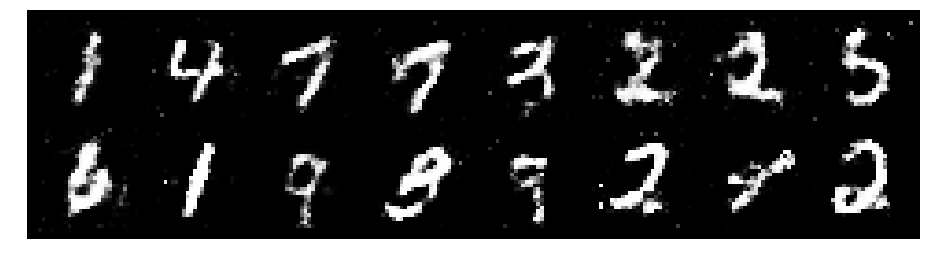

Epoch: [67/200], Batch Num: [400/600]
Discriminator Loss: 1.1479, Generator Loss: 0.9965
D(x): 0.5976, D(G(z)): 0.4182


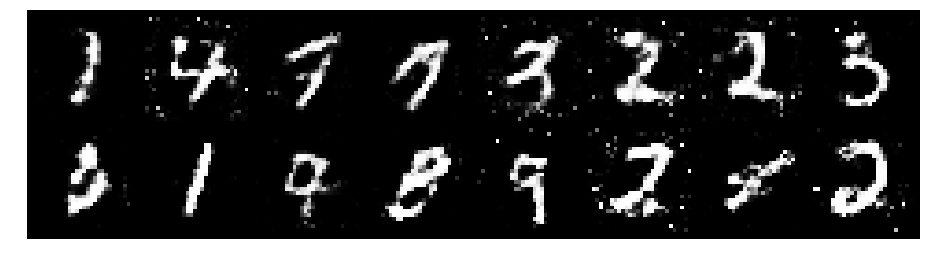

Epoch: [67/200], Batch Num: [500/600]
Discriminator Loss: 1.2512, Generator Loss: 0.9610
D(x): 0.5344, D(G(z)): 0.3994


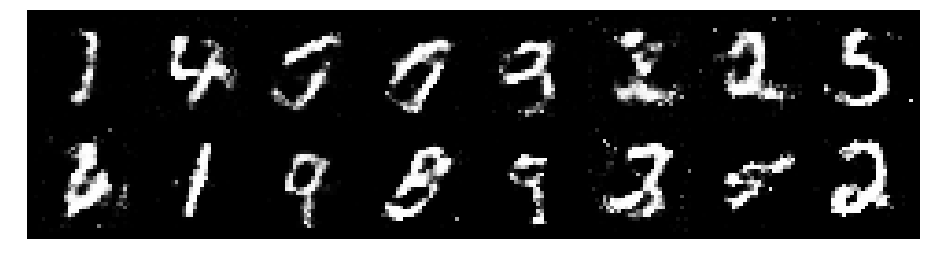

Epoch: [68/200], Batch Num: [0/600]
Discriminator Loss: 1.2380, Generator Loss: 0.8746
D(x): 0.5916, D(G(z)): 0.4507


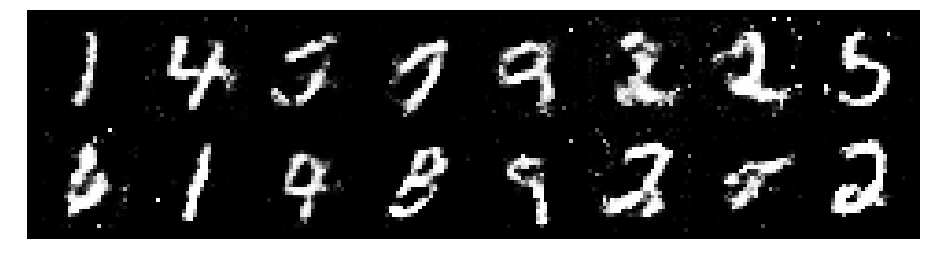

Epoch: [68/200], Batch Num: [100/600]
Discriminator Loss: 1.3218, Generator Loss: 1.0485
D(x): 0.5806, D(G(z)): 0.4683


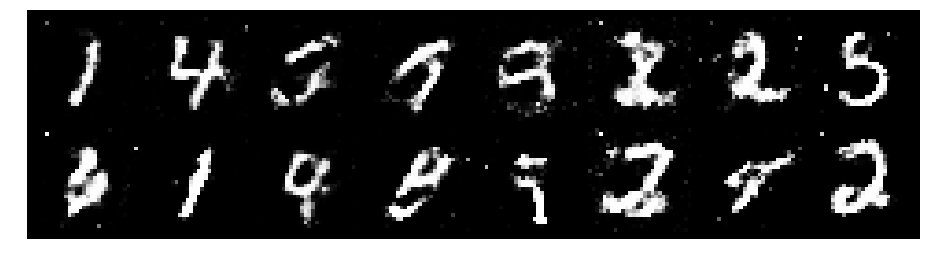

Epoch: [68/200], Batch Num: [200/600]
Discriminator Loss: 1.2235, Generator Loss: 1.1414
D(x): 0.6068, D(G(z)): 0.4247


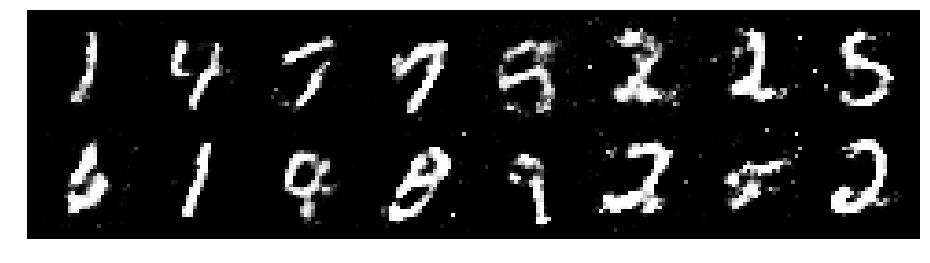

Epoch: [68/200], Batch Num: [300/600]
Discriminator Loss: 1.2807, Generator Loss: 1.0513
D(x): 0.5615, D(G(z)): 0.4118


In [ ]:
# Create logger instance
logger = Logger(model_name='VGAN', data_name='MNIST')
# Total number of epochs to train
num_epochs = 200
for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)
        # 1. Train Discriminator
        real_data = Variable(images_to_vectors(real_batch))
        # Generate fake data and detach 
        # (so gradients are not calculated for generator)
        fake_data = generator(noise(N)).detach()
        # Train D
        d_error, d_pred_real, d_pred_fake = \
              train_discriminator(d_optimizer, real_data, fake_data)

        # 2. Train Generator
        # Generate fake data
        fake_data = generator(noise(N))
        # Train G
        g_error = train_generator(g_optimizer, fake_data)
        # Log batch error
        logger.log(d_error, g_error, epoch, n_batch, num_batches)
        # Display Progress every few batches
        if (n_batch) % 100 == 0: 
            test_images = vectors_to_images(generator(test_noise))
            test_images = test_images.data
            logger.log_images(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            );
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )